In [27]:
import pandas as pd
import torch
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import math, random, torch, collections, time, torch.nn.functional as F, networkx as nx, matplotlib.pyplot as plt, numpy as np
from torch.nn import Linear
from torch_geometric.nn import GCNConv
from IPython.display import clear_output
from torch_geometric.utils import to_networkx
from torch_geometric.utils import from_networkx

In [28]:
import sys, os
sys.path.append('../../gnumap/')
from models.train_models import *
from scipy import optimize

dev = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
from codecarbon import OfflineEmissionsTracker
from umap_functions import *
from simulation_utils import make_roll

In [29]:
N_NEIGHBOURS = 5

In [30]:
make_roll(c=0.6, v=4, omega=12, n_samples = 2000, n_neighbours = 30,
              a = 2, b = 2, scale=0.5, plot=True, features=None,
              standardize=True)
"""
X: coordinates for swissroll
t: underlying beta samples
new_data: node features
"""

(array([[-1.01533933,  1.27516225, -0.65409644],
        [ 1.0276753 ,  1.23197662, -0.3246728 ],
        [-0.64572823,  1.52593462,  0.68018352],
        ...,
        [-0.66141264, -0.50715719, -0.43805662],
        [-1.72565129, -0.96382975, -0.59279169],
        [-0.54700976, -0.7919855 , -0.66407066]]),
 array([0.70961135, 0.59912818, 0.69196462, ..., 0.30151192, 0.82550375,
        0.34795354]),
 Data(x=[2000, 2000], edge_index=[2, 68212], edge_weight=[68212]))

'\nX: coordinates for swissroll\nt: underlying beta samples\nnew_data: node features\n'

## Data generation

In [31]:
import random
random.seed(12345)
X, t, new_data = make_roll(n_neighbours = N_NEIGHBOURS, scale=0.1, n_samples = 4000, features='coordinates')
# new_data is graph object

In [32]:
x = X[:,0]
y = X[:,1]
z = X[:,2]

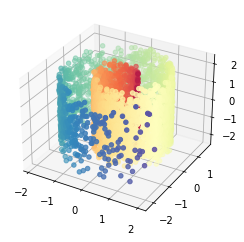

In [33]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter3D(x, y, z, c=t, cmap='Spectral')

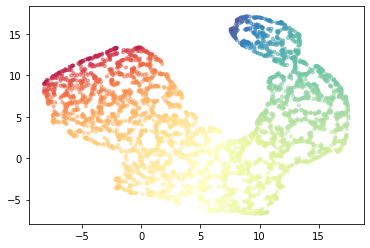

In [34]:
# import umap.umap_ as umap
import umap
import numpy as np
from sklearn.neighbors import kneighbors_graph

X = np.vstack([np.array(x),np.array(y),np.array(z)]).T
A_dist = kneighbors_graph(X, N_NEIGHBOURS, mode='distance', include_self=False)
embedding = umap.UMAP(n_components=2, n_neighbors= 10, min_dist= 0.3).fit_transform(X)
plt.scatter(*embedding.T, s=10, c=t, alpha=0.5, cmap='Spectral')

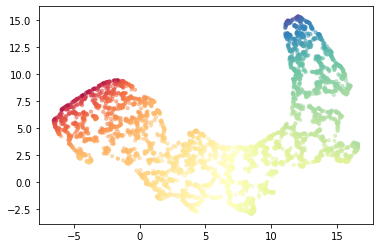

In [35]:
# more local when n_neighbors is small
embedding_20 = umap.UMAP(n_components=2, n_neighbors= 20, min_dist= 0.1).fit_transform(X)
plt.scatter(*embedding_20.T, s=10, c=t, alpha=0.5, cmap='Spectral')

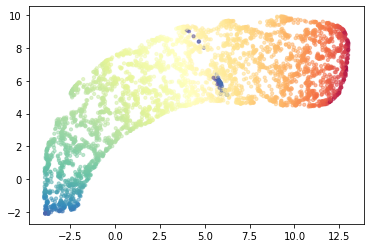

In [36]:
# more global when n_neighbors is large
embedding_200 = umap.UMAP(n_components=2, n_neighbors= 200, min_dist= 0.1).fit_transform(X)
plt.scatter(*embedding_200.T, s=10, c=t, alpha=0.5, cmap='Spectral')

In [37]:
A_dist[:,0]

<4000x1 sparse matrix of type '<class 'numpy.float64'>'
	with 8 stored elements in Compressed Sparse Row format>

## Draw reconstructed graph

<Figure size 432x288 with 0 Axes>

/var/folders/5t/52gqcj5n3h945tk2hbmm1hsr0000gn/T/ipykernel_5803/114033988.py:4: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),


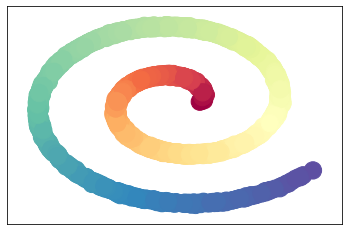

In [38]:
# A_dist = kneighbors_graph(X, 5, mode='distance', include_self=False)
### Very sensitive to wrong edges
plt.figure()
nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),
                 pos={i:[new_data.x[i,0].numpy(),new_data.x[i,1].numpy()] for i in range(new_data.num_nodes)},
                 # to see the "roll" it should by x, y axis
                 node_color=t, cmap='Spectral', with_labels=False)
plt.show()

n_neighbors = 3 : small k puts more emphasis on the local structure

<Figure size 432x288 with 0 Axes>

/var/folders/5t/52gqcj5n3h945tk2hbmm1hsr0000gn/T/ipykernel_5803/3333484911.py:3: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),


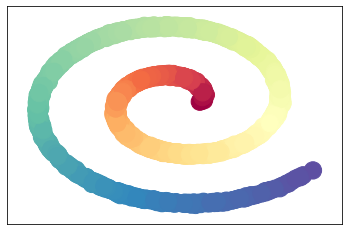

In [39]:
A_dist = kneighbors_graph(X, 3, mode='distance', include_self=False)
plt.figure()
nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),
                 pos={i:[new_data.x[i,0].numpy(),new_data.x[i,1].numpy()] for i in range(new_data.num_nodes)},
                 # to see the "roll" it should by x, y axis
                 node_color=t, cmap='Spectral', with_labels=False)
plt.show()

<Figure size 432x288 with 0 Axes>

/var/folders/5t/52gqcj5n3h945tk2hbmm1hsr0000gn/T/ipykernel_5803/2897849191.py:3: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),


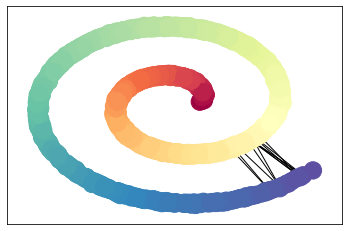

In [40]:
A_dist = kneighbors_graph(X, 10, mode='distance', include_self=False)
plt.figure()
nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),
                 pos={i:[new_data.x[i,0].numpy(),new_data.x[i,1].numpy()] for i in range(new_data.num_nodes)},
                 # to see the "roll" it should by x, y axis
                 node_color=t, cmap='Spectral', with_labels=False)
plt.show()

<Figure size 432x288 with 0 Axes>

/var/folders/5t/52gqcj5n3h945tk2hbmm1hsr0000gn/T/ipykernel_5803/3693753448.py:3: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),


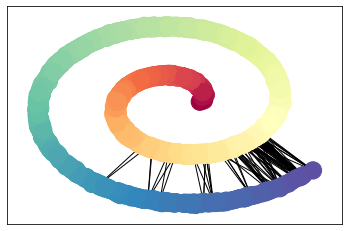

In [41]:
A_dist = kneighbors_graph(X, 20, mode='distance', include_self=False)
plt.figure()
nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),
                 pos={i:[new_data.x[i,0].numpy(),new_data.x[i,1].numpy()] for i in range(new_data.num_nodes)},
                 # to see the "roll" it should by x, y axis
                 node_color=t, cmap='Spectral', with_labels=False)
plt.show()

<Figure size 432x288 with 0 Axes>

/var/folders/5t/52gqcj5n3h945tk2hbmm1hsr0000gn/T/ipykernel_5803/1375359892.py:3: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),


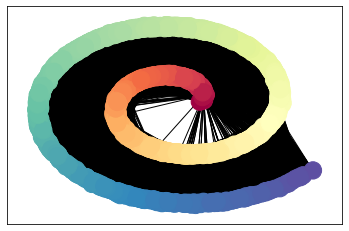

In [42]:
A_dist = kneighbors_graph(X, 200, mode='distance', include_self=False)
plt.figure()
nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),
                 pos={i:[new_data.x[i,0].numpy(),new_data.x[i,1].numpy()] for i in range(new_data.num_nodes)},
                 # to see the "roll" it should by x, y axis
                 node_color=t, cmap='Spectral', with_labels=False)
plt.show()

# Define GNUMAP model

In [43]:
from graph_utils import *
heat_edge, heat_weight = get_weights(new_data, method = 'heat')
heat_edge2, heat_weight2 = get_weights(new_data, method = 'heat', beta = 0.5)
power_edge, power_weight = get_weights(new_data, method = 'power')
lap_edge1, lap_weight1 = get_weights(new_data, method = 'laplacian', alpha = 0.1)
lap_edge2, lap_weight2 = get_weights(new_data, method = 'laplacian', alpha = 0.5)
lap_edge3, lap_weight3 = get_weights(new_data, method = 'laplacian', alpha = 0.9)

In [44]:
new_data.edge_index, new_data.edge_weight

(tensor([[   0,    0,    0,  ..., 3999, 3999, 3999],
         [   0, 1006, 1187,  ..., 2433, 2993, 3999]]),
 tensor([1., 1., 1.,  ..., 1., 1., 1.]))

In [45]:
from models.data_augmentation import *

In [46]:
high_graph_index, high_graph_weights  = get_weights(new_data, neighbours=15, method = 'laplacian', alpha= 0.5)
data_tmp = Data(x=new_data.x, y = new_data.y,
                edge_index= high_graph_index,
                edge_weight= high_graph_weights)
out,_ = random_aug(data_tmp, feat_drop_rate = 0.1, edge_mask_rate = 0.3)
target_graph_index, target_graph_weights  = out.edge_index, out.edge_weight

In [47]:
target_graph_weights.shape

torch.Size([16350])

In [50]:
import numpy as np
from carbontracker.tracker import CarbonTracker
import cProfile
import os
import scipy
import torch
import torch.nn as nn
import torch_geometric
from torch_geometric.data import Data
from torch_geometric.utils import remove_self_loops, negative_sampling
from torch_geometric.utils import add_remaining_self_loops
from torch_geometric.utils import to_scipy_sparse_matrix, to_networkx, from_scipy_sparse_matrix
import time
from umap_functions import *
from graph_utils import *
from models.data_augmentation import *

def train_gnumap(data, hid_dim, dim, n_layers=2, target=None,
                 method = 'laplacian', must_propagate=None,
                 norm='normalize', neighbours=15,
                 patience=20, epochs=200, lr=1e-3, wd=1e-2,
                 min_dist=0.1, name_file="1", subsampling=None,
                 alpha = 0.5, spread = 1.0, lambd_corr=1e-2,
                 beta = 1., gnn_type: str = 'symmetric',
                 power = 3,
                 feat_drop_rate = 0.0, edge_mask_rate = 0.0,
                 repulsion_strength=None,
                 local_connectivity=1,
                 device=None, colours=None):


    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    EPS_0 = data.num_edges/ (data.num_nodes ** 2)
    _a, _b = find_ab_params(spread, min_dist) # spread , min_dist given as hyperparameter

    #if torch_geometric.utils.is_undirected(data.edge_index):
    #    new_edge_index, new_edge_attr = torch_geometric.utils.to_undirected(data.edge_index, data.edge_weight)
    #else:
    #    new_edge_index, new_edge_attr = data.edge_index, data.edge_weight

    if torch_geometric.utils.is_undirected(data.edge_index):
        new_edge_index, new_edge_attr = data.edge_index, data.edge_weight
    else:
        new_edge_index, new_edge_attr = torch_geometric.utils.to_undirected(data.edge_index, data.edge_weight)

    #### transform edge index into knn matrix
    knn = []
    for i in range(data.num_nodes):
        knn += [list(np.sort(list(new_edge_attr[(new_edge_index[0]==i) & (new_edge_index[1]!=i )].numpy())))]
    knn_dists = pd.DataFrame(knn).fillna(0).values
    sigmas, rhos = smooth_knn_dist(
        knn_dists,
        float(neighbours),
        local_connectivity=float(local_connectivity),
         )

    # Maybe use the distance as the original distribution?
    vals = [ np.exp(-(np.max([new_edge_attr.numpy()[i] - rhos[new_edge_index[0,i]], 0])) /
                    (sigmas[new_edge_index[0,i]])) for i in range(len(new_edge_attr))]

    #print(np.where(vals > 1e5))
    rows = new_edge_index[0,:].numpy()
    cols = new_edge_index[1,:].numpy()
    vals = np.array(vals)
    vals[vals<1e-5] = 0

    high = []
    for i in range(data.num_nodes):
        high.append(
            np.insert((new_edge_attr[(new_edge_index[0]==i) & (new_edge_index[1]!=i )].numpy())/new_edge_attr[(new_edge_index[0] == i) & (new_edge_index[1] != i)].sum().numpy(),0,0)
        )
    # highs = np.hstack(high)
    highs  = new_edge_attr/data.num_edges
    p =[]
    for i in range(data.num_nodes):
        p.append(
            highs[(new_edge_index[0] == i) & (new_edge_index[1] != i)].sum().numpy()
        )
    eta = data.edge_weight
    for i in range(len(data.edge_weight)):
        eta[i] = (p[data.edge_index[0,i]]+p[data.edge_index[1,i]])/2*data.x.shape[0]

    result = scipy.sparse.coo_matrix(
  #      (vals, (rows, cols)), shape=(X.shape[0], X.shape[0])
         (highs, (rows, cols)), shape=(X.shape[0], X.shape[0])
    )
    result.eliminate_zeros()
    # target_graph_index, target_graph_weights = from_scipy_sparse_matrix(result)
    high_graph_index, high_graph_weights  = get_weights(data, neighbours=neighbours, method = method, alpha= alpha, beta = beta,  power = power)
    data_tmp = Data(x=data.x, y = data.y,
                    edge_index= high_graph_index,
                    edge_weight= high_graph_weights)
    out, _ = random_aug(data_tmp, feat_drop_rate = feat_drop_rate, edge_mask_rate = edge_mask_rate)
    target_graph_index, target_graph_weights  = out.edge_index, out.edge_weight

    #### Prune
    EPS = 1e-29 #math.exp(-1.0/(2*_b) * math.log(1.0/_a * (1.0/EPS_0 -1)))
    print("Epsilon is " + str(EPS))
    print("Hyperparameters a = " + str(_a) + " and b = " + str(_b))



    model = GNN(data.num_features, hid_dim, dim, n_layers=n_layers,
                must_propagate=must_propagate,
                norm=norm)
    model = model.to(device)
    model.apply(init_weights)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr,
                             weight_decay=wd)
    new_data = Data(x=out.x, edge_index=target_graph_index, # if feature drops the feature matrix should be updated
                    y=data.y, edge_weight=target_graph_weights)
    sparsity =  new_data.num_edges/(new_data.num_nodes**2 -new_data.num_nodes)
    if repulsion_strength is None:
        repulsion_strength = 1.0/sparsity
        # we have way more samples that are "not" connected(sparsity), so need to give more weight to negative sampling to get balanced results
    row_pos, col_pos =  new_data.edge_index
    index = (row_pos != col_pos)
        # to exclude self-connectivity
    edge_weights_pos = new_data.edge_weight#[index]

    if target is not None:
        edge_weights_pos = fast_intersection(row_pos[index], col_pos[index], edge_weights_pos,
                                             target, unknown_dist=1.0, far_dist=5.0)
        # p_{ij}
    if subsampling is None:
        row_neg, col_neg = negative_sampling(new_data.edge_index, num_neg_samples = 5 * new_data.edge_index.shape[1] )
        # m = 5
        index_neg = (row_neg != col_neg)
        # edge_weights_neg = EPS * torch.ones(len(row_neg))
        edge_weights_neg = m*torch.ones(len(row_neg))
        if target is not None:
            edge_weights_neg = fast_intersection(row_neg[index_neg], col_neg[index_neg], edge_weights_neg,
                                                 target, unknown_dist=1.0, far_dist=5.0)
    best_t=0
    cnt_wait = 0
    best=1e9
    log_sigmoid = torch.nn.LogSigmoid()
    edges = [(e[0],e[1]) for _, e in enumerate(data.edge_index.numpy().T)]
    for epoch in range(epochs):
        tic_epoch = time.time()
        model.train()
        optimizer.zero_grad()
        tic = time.time()
        out = model(data.x.float(), new_data.edge_index) # data.edge_index?
        diff_norm = torch.sum(torch.square(out[row_pos[index]] - out[col_pos[index]]), 1)
        diff_norm = torch.clip(diff_norm, min=1e-3)
        log_q = - torch.log1p(_a *  diff_norm ** _b) # 1/(1+a*d^2b)
        # log_q = - torch.log1p(1+ diff_norm)
        loss_pos = - torch.mean(edge_weights_pos[index] * log_sigmoid(log_q)) - torch.mean((1. - edge_weights_pos[index]) *  (log_sigmoid(log_q) - log_q ) * repulsion_strength)
        # log(q/(q+1))


        if subsampling is None:
            diff_norm_neg = torch.sum(torch.square(out[row_neg[index_neg]] - out[col_neg[index_neg]]), 1) #+ 1e-3
            diff_norm_neg = torch.clip(diff_norm_neg, min=1e-3)
            log_q_neg = - torch.log1p(_a *  diff_norm_neg ** _b)
            # log_q_neg = - torch.log1p(1+ diff_norm_neg)
        else:
            row_neg, col_neg = negative_sampling(new_data.edge_index,
                                                 num_neg_samples=subsampling)
            index_neg = (row_neg != col_neg)
            edge_weights_neg = EPS * torch.ones(len(row_neg))
            if target is not None:
                edge_weights_neg = fast_intersection(row_neg[index_neg],
                                                     col_neg[index_neg], edge_weights_neg,
                                                     target, unknown_dist=1.0, far_dist=5.0)
            diff_norm_neg = torch.sum(torch.square(out[row_neg[index_neg]] - out[col_neg[index_neg]]), 1) #+ 1e-3
            diff_norm_neg = torch.clip(diff_norm_neg, min=1e-3)
            log_q_neg = - torch.log1p(_a *  diff_norm_neg ** _b)
            # log_q_neg = - torch.log1p(1+ diff_norm_neg)
        print("loss before neg", loss_pos)
        loss_neg = - torch.mean((log_sigmoid(log_q_neg) - log_q_neg ) * repulsion_strength)
        print("loss after neg", loss_neg)
        ### Add a term to make sure that the features are learned independently
        c1 = torch.mm(out.T, out)
        c1 = c1 / out.shape[0]
        iden = torch.tensor(np.eye(out.shape[1])).to(device)
        loss_dec1 = (torch.diag_embed(c1) - c1).pow(2).sum()
        loss = loss_pos + loss_neg +  lambd_corr * loss_dec1
        print("loss corr", lambd_corr * loss_dec1)
        print("loss final", loss)
        tic =  time.time()
        loss.backward()
        #torch.nn.utils.clip_grad_value_(model.parameters(), clip_value=4)
        optimizer.step()

        if epoch%10== 0:
            u = out.detach().numpy()
            plt.figure()
            plt.scatter(u[:,0], u[:,1], c = t,
                        cmap="Spectral")
            plt.show()
            print(torch.mm(out.T, out)/ new_data.num_nodes)

        for g in optimizer.param_groups:
            g['lr'] = lr * (1.0 - (float(epoch) / float(epochs)))

        print('Epoch={:03d}, loss={:.4f}, time={:.4f}'.format(epoch, loss.item(),time.time()-tic_epoch))
        if loss < best:
            best = loss
            best_t = epoch
            cnt_wait = 0
            torch.save(model.state_dict(), os.getcwd()  + '/results/best_gnumap_'
                                          + str(method) + '_neigh' + str(neighbours)
                                          + '_dim' + str(dim) + '_' + name_file +  '.pkl')
        else:
            cnt_wait += 1
        if cnt_wait == patience and epoch>50:
            print('Early stopping at epoch {}!'.format(epoch))
            break
        #print("Time epoch after saving", time.time()-tic_epoch)
    #tracker.stop()
    print('Loading {}th epoch'.format(best_t))
    model.load_state_dict(torch.load(os.getcwd()  + '/results/best_gnumap_' +
                                     str(method) + '_neigh' + str(neighbours)
                                     + '_dim' + str(dim) + '_' + name_file + '.pkl'))
    return(model,target_graph_index, vals, knn_dists)

## Test with various weight augmentations

### (a) Laplacian with alpha = 0.5

$\alpha$ = 0.5, $\lambda$ = 1e-4

Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(2.7282, grad_fn=<SubBackward0>)
loss after neg tensor(2.5257, grad_fn=<NegBackward0>)
loss corr tensor(0.0004, grad_fn=<MulBackward0>)
loss final tensor(5.2542, grad_fn=<AddBackward0>)


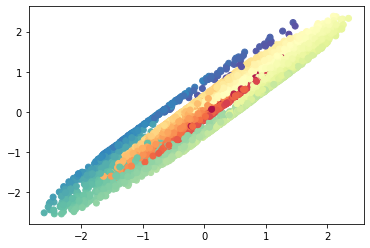

tensor([[0.9997, 0.9434],
        [0.9434, 0.9998]], grad_fn=<DivBackward0>)
Epoch=000, loss=5.2542, time=0.4188
loss before neg tensor(2.7280, grad_fn=<SubBackward0>)
loss after neg tensor(2.5044, grad_fn=<NegBackward0>)
loss corr tensor(0.0003, grad_fn=<MulBackward0>)
loss final tensor(5.2327, grad_fn=<AddBackward0>)
Epoch=001, loss=5.2327, time=0.1650
loss before neg tensor(2.7278, grad_fn=<SubBackward0>)
loss after neg tensor(2.4731, grad_fn=<NegBackward0>)
loss corr tensor(0.0003, grad_fn=<MulBackward0>)
loss final tensor(5.2012, grad_fn=<AddBackward0>)
Epoch=002, loss=5.2012, time=0.1601
loss before neg tensor(2.7276, grad_fn=<SubBackward0>)
loss after neg tensor(2.4529, grad_fn=<NegBackward0>)
loss corr tensor(0.0003, grad_fn=<MulBackward0>)
loss final tensor(5.1809, grad_fn=<AddBackward0>)
Epoch=003, loss=5.1809, time=0.1588
loss before neg tensor(2.7274, grad_fn=<SubBackward0>)
loss after neg tensor(2.4371, grad_fn=<NegBackward0>)
loss corr tensor(0.0003, grad_fn=<MulBackward0

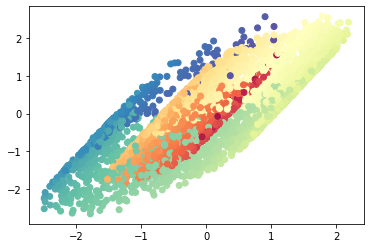

tensor([[0.9998, 0.7782],
        [0.7782, 0.9997]], grad_fn=<DivBackward0>)
Epoch=010, loss=5.0128, time=0.3355
loss before neg tensor(2.7257, grad_fn=<SubBackward0>)
loss after neg tensor(2.2668, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.9928, grad_fn=<AddBackward0>)
Epoch=011, loss=4.9928, time=0.1750
loss before neg tensor(2.7255, grad_fn=<SubBackward0>)
loss after neg tensor(2.2499, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.9756, grad_fn=<AddBackward0>)
Epoch=012, loss=4.9756, time=0.1732
loss before neg tensor(2.7252, grad_fn=<SubBackward0>)
loss after neg tensor(2.2365, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.9619, grad_fn=<AddBackward0>)
Epoch=013, loss=4.9619, time=0.1521
loss before neg tensor(2.7249, grad_fn=<SubBackward0>)
loss after neg tensor(2.2167, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0

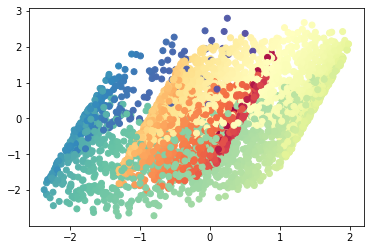

tensor([[0.9998, 0.4921],
        [0.4921, 0.9998]], grad_fn=<DivBackward0>)
Epoch=020, loss=4.8522, time=0.3660
loss before neg tensor(2.7231, grad_fn=<SubBackward0>)
loss after neg tensor(2.1236, grad_fn=<NegBackward0>)
loss corr tensor(0.0001, grad_fn=<MulBackward0>)
loss final tensor(4.8468, grad_fn=<AddBackward0>)
Epoch=021, loss=4.8468, time=0.1745
loss before neg tensor(2.7229, grad_fn=<SubBackward0>)
loss after neg tensor(2.1060, grad_fn=<NegBackward0>)
loss corr tensor(0.0001, grad_fn=<MulBackward0>)
loss final tensor(4.8291, grad_fn=<AddBackward0>)
Epoch=022, loss=4.8291, time=0.1619
loss before neg tensor(2.7227, grad_fn=<SubBackward0>)
loss after neg tensor(2.1002, grad_fn=<NegBackward0>)
loss corr tensor(0.0001, grad_fn=<MulBackward0>)
loss final tensor(4.8230, grad_fn=<AddBackward0>)
Epoch=023, loss=4.8230, time=0.1581
loss before neg tensor(2.7224, grad_fn=<SubBackward0>)
loss after neg tensor(2.0917, grad_fn=<NegBackward0>)
loss corr tensor(0.0001, grad_fn=<MulBackward0

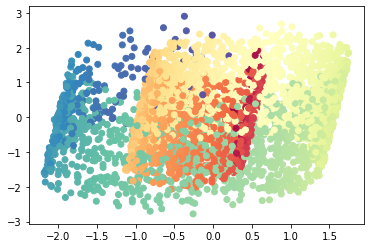

tensor([[0.9998, 0.1848],
        [0.1848, 0.9998]], grad_fn=<DivBackward0>)
Epoch=030, loss=4.7923, time=0.4976
loss before neg tensor(2.7213, grad_fn=<SubBackward0>)
loss after neg tensor(2.0582, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7796, grad_fn=<AddBackward0>)
Epoch=031, loss=4.7796, time=0.2421
loss before neg tensor(2.7211, grad_fn=<SubBackward0>)
loss after neg tensor(2.0536, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7749, grad_fn=<AddBackward0>)
Epoch=032, loss=4.7749, time=0.1832
loss before neg tensor(2.7210, grad_fn=<SubBackward0>)
loss after neg tensor(2.0545, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7757, grad_fn=<AddBackward0>)
Epoch=033, loss=4.7757, time=0.2085
loss before neg tensor(2.7209, grad_fn=<SubBackward0>)
loss after neg tensor(2.0562, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0

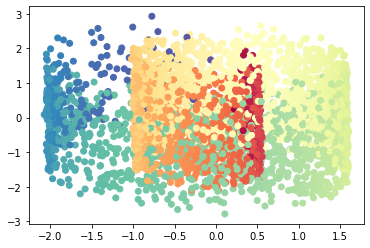

tensor([[ 0.9997, -0.0222],
        [-0.0222,  0.9998]], grad_fn=<DivBackward0>)
Epoch=040, loss=4.7766, time=0.3995
loss before neg tensor(2.7202, grad_fn=<SubBackward0>)
loss after neg tensor(2.0560, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7765, grad_fn=<AddBackward0>)
Epoch=041, loss=4.7765, time=0.1899
loss before neg tensor(2.7201, grad_fn=<SubBackward0>)
loss after neg tensor(2.0586, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7789, grad_fn=<AddBackward0>)
Epoch=042, loss=4.7789, time=0.2186
loss before neg tensor(2.7201, grad_fn=<SubBackward0>)
loss after neg tensor(2.0521, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7724, grad_fn=<AddBackward0>)
Epoch=043, loss=4.7724, time=0.1743
loss before neg tensor(2.7200, grad_fn=<SubBackward0>)
loss after neg tensor(2.0577, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

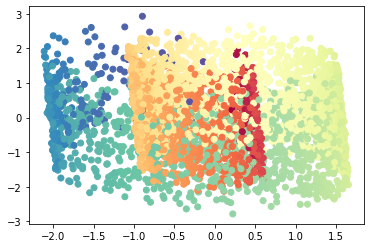

tensor([[ 0.9998, -0.0882],
        [-0.0882,  0.9998]], grad_fn=<DivBackward0>)
Epoch=050, loss=4.7764, time=0.3677
loss before neg tensor(2.7197, grad_fn=<SubBackward0>)
loss after neg tensor(2.0544, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7743, grad_fn=<AddBackward0>)
Epoch=051, loss=4.7743, time=0.1605
loss before neg tensor(2.7196, grad_fn=<SubBackward0>)
loss after neg tensor(2.0569, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7767, grad_fn=<AddBackward0>)
Epoch=052, loss=4.7767, time=0.1819
loss before neg tensor(2.7196, grad_fn=<SubBackward0>)
loss after neg tensor(2.0611, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7809, grad_fn=<AddBackward0>)
Epoch=053, loss=4.7809, time=0.1719
loss before neg tensor(2.7195, grad_fn=<SubBackward0>)
loss after neg tensor(2.0596, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

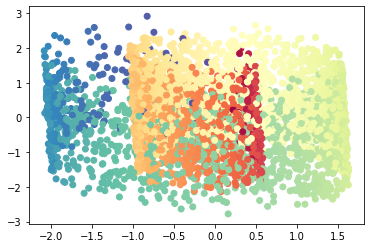

tensor([[ 0.9997, -0.0608],
        [-0.0608,  0.9998]], grad_fn=<DivBackward0>)
Epoch=060, loss=4.7753, time=0.4191
loss before neg tensor(2.7193, grad_fn=<SubBackward0>)
loss after neg tensor(2.0578, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7773, grad_fn=<AddBackward0>)
Epoch=061, loss=4.7773, time=0.2016
loss before neg tensor(2.7193, grad_fn=<SubBackward0>)
loss after neg tensor(2.0482, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7677, grad_fn=<AddBackward0>)
Epoch=062, loss=4.7677, time=0.2132
loss before neg tensor(2.7193, grad_fn=<SubBackward0>)
loss after neg tensor(2.0519, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7714, grad_fn=<AddBackward0>)
Epoch=063, loss=4.7714, time=0.2314
loss before neg tensor(2.7192, grad_fn=<SubBackward0>)
loss after neg tensor(2.0612, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

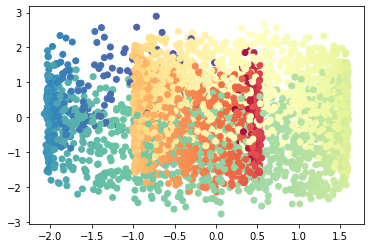

tensor([[ 0.9997, -0.0148],
        [-0.0148,  0.9998]], grad_fn=<DivBackward0>)
Epoch=070, loss=4.7728, time=0.4745
loss before neg tensor(2.7190, grad_fn=<SubBackward0>)
loss after neg tensor(2.0554, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7746, grad_fn=<AddBackward0>)
Epoch=071, loss=4.7746, time=0.1688
loss before neg tensor(2.7190, grad_fn=<SubBackward0>)
loss after neg tensor(2.0488, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7680, grad_fn=<AddBackward0>)
Epoch=072, loss=4.7680, time=0.1369
loss before neg tensor(2.7189, grad_fn=<SubBackward0>)
loss after neg tensor(2.0529, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7720, grad_fn=<AddBackward0>)
Epoch=073, loss=4.7720, time=0.1457
loss before neg tensor(2.7189, grad_fn=<SubBackward0>)
loss after neg tensor(2.0518, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

<Figure size 432x288 with 0 Axes>

(array([[   0.,  266.,  154., 1039.,  616.,  811.,  422.,  692.,    0.,
            0.],
        [  33.,  181.,  401.,  647.,  833.,  824.,  606.,  327.,  135.,
           13.]]),
 array([-2.77912784, -2.20934701, -1.63956594, -1.06978512, -0.50000417,
         0.06977677,  0.63955772,  1.20933867,  1.77911949,  2.34890056,
         2.91868138]),
 <a list of 2 BarContainer objects>)

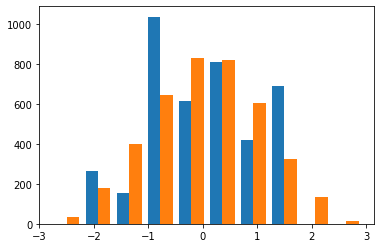

<Figure size 432x288 with 0 Axes>

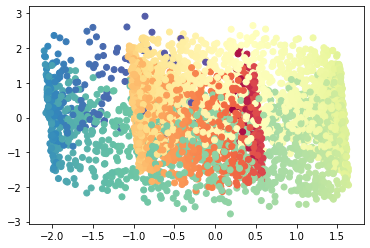

tensor([[ 0.9998, -0.0743],
        [-0.0743,  0.9998]], grad_fn=<DivBackward0>)
Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(2.7346, grad_fn=<SubBackward0>)
loss after neg tensor(2.3445, grad_fn=<NegBackward0>)
loss corr tensor(0.0009, grad_fn=<MulBackward0>)
loss final tensor(5.0800, grad_fn=<AddBackward0>)


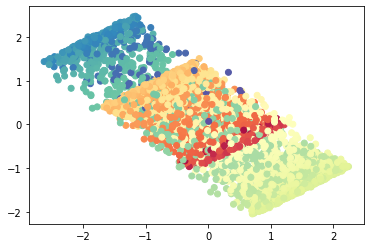

tensor([[ 0.9998, -0.8051],
        [-0.8051,  0.9998]], grad_fn=<DivBackward0>)
Epoch=000, loss=5.0800, time=0.4824
loss before neg tensor(2.7342, grad_fn=<SubBackward0>)
loss after neg tensor(2.3192, grad_fn=<NegBackward0>)
loss corr tensor(0.0009, grad_fn=<MulBackward0>)
loss final tensor(5.0543, grad_fn=<AddBackward0>)
Epoch=001, loss=5.0543, time=0.1846
loss before neg tensor(2.7337, grad_fn=<SubBackward0>)
loss after neg tensor(2.3078, grad_fn=<NegBackward0>)
loss corr tensor(0.0009, grad_fn=<MulBackward0>)
loss final tensor(5.0424, grad_fn=<AddBackward0>)
Epoch=002, loss=5.0424, time=0.1575
loss before neg tensor(2.7332, grad_fn=<SubBackward0>)
loss after neg tensor(2.2936, grad_fn=<NegBackward0>)
loss corr tensor(0.0009, grad_fn=<MulBackward0>)
loss final tensor(5.0276, grad_fn=<AddBackward0>)
Epoch=003, loss=5.0276, time=0.1751
loss before neg tensor(2.7327, grad_fn=<SubBackward0>)
loss after neg tensor(2.2796, grad_fn=<NegBackward0>)
loss corr tensor(0.0008, grad_fn=<MulBackw

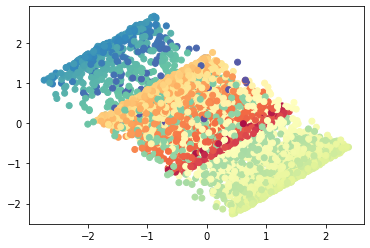

tensor([[ 0.9997, -0.6338],
        [-0.6338,  0.9998]], grad_fn=<DivBackward0>)
Epoch=010, loss=4.9400, time=0.3265
loss before neg tensor(2.7286, grad_fn=<SubBackward0>)
loss after neg tensor(2.1819, grad_fn=<NegBackward0>)
loss corr tensor(0.0007, grad_fn=<MulBackward0>)
loss final tensor(4.9112, grad_fn=<AddBackward0>)
Epoch=011, loss=4.9112, time=0.1713
loss before neg tensor(2.7280, grad_fn=<SubBackward0>)
loss after neg tensor(2.1776, grad_fn=<NegBackward0>)
loss corr tensor(0.0006, grad_fn=<MulBackward0>)
loss final tensor(4.9063, grad_fn=<AddBackward0>)
Epoch=012, loss=4.9063, time=0.1325
loss before neg tensor(2.7273, grad_fn=<SubBackward0>)
loss after neg tensor(2.1655, grad_fn=<NegBackward0>)
loss corr tensor(0.0006, grad_fn=<MulBackward0>)
loss final tensor(4.8934, grad_fn=<AddBackward0>)
Epoch=013, loss=4.8934, time=0.1641
loss before neg tensor(2.7267, grad_fn=<SubBackward0>)
loss after neg tensor(2.1536, grad_fn=<NegBackward0>)
loss corr tensor(0.0006, grad_fn=<MulBackw

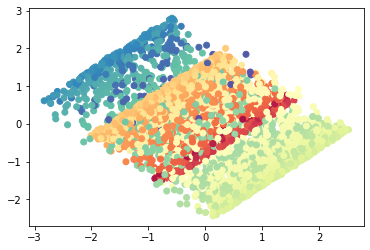

tensor([[ 0.9998, -0.3968],
        [-0.3968,  0.9998]], grad_fn=<DivBackward0>)
Epoch=020, loss=4.8216, time=0.6845
loss before neg tensor(2.7220, grad_fn=<SubBackward0>)
loss after neg tensor(2.0938, grad_fn=<NegBackward0>)
loss corr tensor(0.0004, grad_fn=<MulBackward0>)
loss final tensor(4.8162, grad_fn=<AddBackward0>)
Epoch=021, loss=4.8162, time=0.2199
loss before neg tensor(2.7213, grad_fn=<SubBackward0>)
loss after neg tensor(2.0879, grad_fn=<NegBackward0>)
loss corr tensor(0.0004, grad_fn=<MulBackward0>)
loss final tensor(4.8096, grad_fn=<AddBackward0>)
Epoch=022, loss=4.8096, time=0.2162
loss before neg tensor(2.7206, grad_fn=<SubBackward0>)
loss after neg tensor(2.0778, grad_fn=<NegBackward0>)
loss corr tensor(0.0004, grad_fn=<MulBackward0>)
loss final tensor(4.7988, grad_fn=<AddBackward0>)
Epoch=023, loss=4.7988, time=0.1640
loss before neg tensor(2.7200, grad_fn=<SubBackward0>)
loss after neg tensor(2.0811, grad_fn=<NegBackward0>)
loss corr tensor(0.0004, grad_fn=<MulBackw

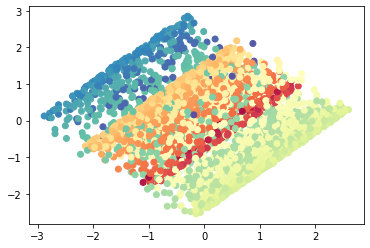

tensor([[ 0.9998, -0.1345],
        [-0.1345,  0.9997]], grad_fn=<DivBackward0>)
Epoch=030, loss=4.7696, time=0.3945
loss before neg tensor(2.7157, grad_fn=<SubBackward0>)
loss after neg tensor(2.0548, grad_fn=<NegBackward0>)
loss corr tensor(0.0003, grad_fn=<MulBackward0>)
loss final tensor(4.7707, grad_fn=<AddBackward0>)
Epoch=031, loss=4.7707, time=0.1561
loss before neg tensor(2.7152, grad_fn=<SubBackward0>)
loss after neg tensor(2.0487, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7641, grad_fn=<AddBackward0>)
Epoch=032, loss=4.7641, time=0.1524
loss before neg tensor(2.7147, grad_fn=<SubBackward0>)
loss after neg tensor(2.0481, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7630, grad_fn=<AddBackward0>)
Epoch=033, loss=4.7630, time=0.1277
loss before neg tensor(2.7142, grad_fn=<SubBackward0>)
loss after neg tensor(2.0450, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

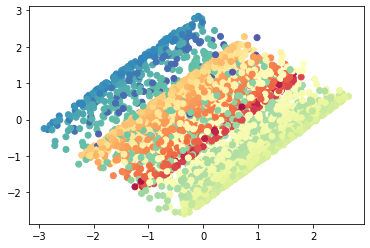

tensor([[0.9998, 0.0654],
        [0.0654, 0.9997]], grad_fn=<DivBackward0>)
Epoch=040, loss=4.7566, time=0.3575
loss before neg tensor(2.7116, grad_fn=<SubBackward0>)
loss after neg tensor(2.0448, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7566, grad_fn=<AddBackward0>)
Epoch=041, loss=4.7566, time=0.1704
loss before neg tensor(2.7114, grad_fn=<SubBackward0>)
loss after neg tensor(2.0501, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7617, grad_fn=<AddBackward0>)
Epoch=042, loss=4.7617, time=0.1685
loss before neg tensor(2.7112, grad_fn=<SubBackward0>)
loss after neg tensor(2.0433, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7546, grad_fn=<AddBackward0>)
Epoch=043, loss=4.7546, time=0.1560
loss before neg tensor(2.7110, grad_fn=<SubBackward0>)
loss after neg tensor(2.0549, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0

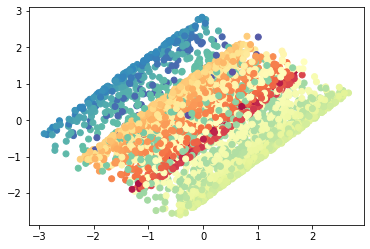

tensor([[0.9998, 0.1329],
        [0.1329, 0.9998]], grad_fn=<DivBackward0>)
Epoch=050, loss=4.7598, time=0.3572
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0568, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7674, grad_fn=<AddBackward0>)
Epoch=051, loss=4.7674, time=0.1648
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0488, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7595, grad_fn=<AddBackward0>)
Epoch=052, loss=4.7595, time=0.1289
loss before neg tensor(2.7106, grad_fn=<SubBackward0>)
loss after neg tensor(2.0464, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7572, grad_fn=<AddBackward0>)
Epoch=053, loss=4.7572, time=0.1413
loss before neg tensor(2.7106, grad_fn=<SubBackward0>)
loss after neg tensor(2.0494, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0

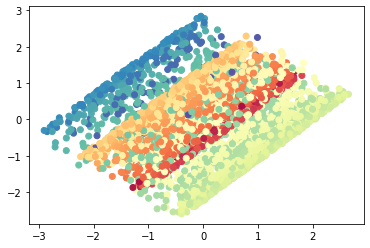

tensor([[0.9998, 0.1018],
        [0.1018, 0.9998]], grad_fn=<DivBackward0>)
Epoch=060, loss=4.7640, time=0.3797
loss before neg tensor(2.7112, grad_fn=<SubBackward0>)
loss after neg tensor(2.0493, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7607, grad_fn=<AddBackward0>)
Epoch=061, loss=4.7607, time=0.1623
loss before neg tensor(2.7113, grad_fn=<SubBackward0>)
loss after neg tensor(2.0552, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7667, grad_fn=<AddBackward0>)
Epoch=062, loss=4.7667, time=0.1690
loss before neg tensor(2.7114, grad_fn=<SubBackward0>)
loss after neg tensor(2.0437, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7553, grad_fn=<AddBackward0>)
Epoch=063, loss=4.7553, time=0.1406
Early stopping at epoch 63!
Loading 43th epoch


<Figure size 432x288 with 0 Axes>

(array([[ 24., 131., 352., 612., 837., 839., 622., 397., 149.,  37.],
        [ 20., 144., 325., 638., 794., 851., 668., 380., 143.,  37.]]),
 array([-2.90314341, -2.32973576, -1.75632834, -1.18292069, -0.60951316,
        -0.03610563,  0.5373019 ,  1.11070943,  1.68411708,  2.25752449,
         2.83093214]),
 <a list of 2 BarContainer objects>)

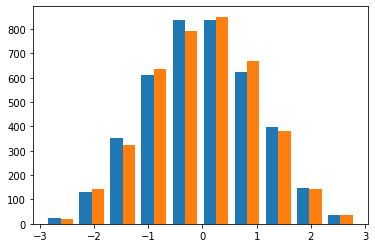

<Figure size 432x288 with 0 Axes>

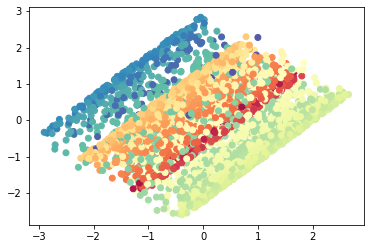

tensor([[0.9998, 0.1090],
        [0.1090, 0.9997]], grad_fn=<DivBackward0>)
Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(2.7334, grad_fn=<SubBackward0>)
loss after neg tensor(2.0910, grad_fn=<NegBackward0>)
loss corr tensor(0.0005, grad_fn=<MulBackward0>)
loss final tensor(4.8249, grad_fn=<AddBackward0>)


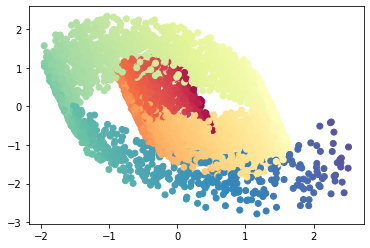

tensor([[ 0.9998, -0.3995],
        [-0.3995,  0.9998]], grad_fn=<DivBackward0>)
Epoch=000, loss=4.8249, time=0.3305
loss before neg tensor(2.7330, grad_fn=<SubBackward0>)
loss after neg tensor(2.0764, grad_fn=<NegBackward0>)
loss corr tensor(0.0004, grad_fn=<MulBackward0>)
loss final tensor(4.8097, grad_fn=<AddBackward0>)
Epoch=001, loss=4.8097, time=0.1626
loss before neg tensor(2.7325, grad_fn=<SubBackward0>)
loss after neg tensor(2.0748, grad_fn=<NegBackward0>)
loss corr tensor(0.0004, grad_fn=<MulBackward0>)
loss final tensor(4.8077, grad_fn=<AddBackward0>)
Epoch=002, loss=4.8077, time=0.1365
loss before neg tensor(2.7320, grad_fn=<SubBackward0>)
loss after neg tensor(2.0690, grad_fn=<NegBackward0>)
loss corr tensor(0.0004, grad_fn=<MulBackward0>)
loss final tensor(4.8014, grad_fn=<AddBackward0>)
Epoch=003, loss=4.8014, time=0.1459
loss before neg tensor(2.7316, grad_fn=<SubBackward0>)
loss after neg tensor(2.0626, grad_fn=<NegBackward0>)
loss corr tensor(0.0003, grad_fn=<MulBackw

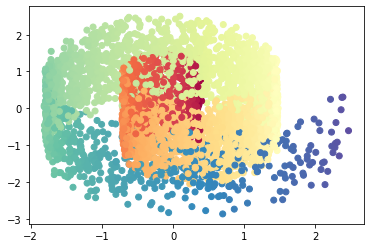

tensor([[ 0.9997, -0.0568],
        [-0.0568,  0.9998]], grad_fn=<DivBackward0>)
Epoch=010, loss=4.7751, time=0.3239
loss before neg tensor(2.7287, grad_fn=<SubBackward0>)
loss after neg tensor(2.0426, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7716, grad_fn=<AddBackward0>)
Epoch=011, loss=4.7716, time=0.1727
loss before neg tensor(2.7285, grad_fn=<SubBackward0>)
loss after neg tensor(2.0415, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7702, grad_fn=<AddBackward0>)
Epoch=012, loss=4.7702, time=0.1509
loss before neg tensor(2.7282, grad_fn=<SubBackward0>)
loss after neg tensor(2.0433, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7718, grad_fn=<AddBackward0>)
Epoch=013, loss=4.7718, time=0.1412
loss before neg tensor(2.7280, grad_fn=<SubBackward0>)
loss after neg tensor(2.0409, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

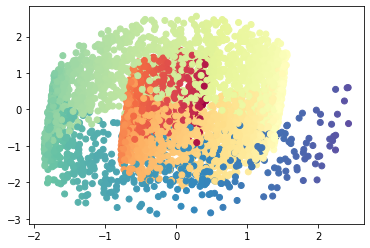

tensor([[0.9998, 0.1055],
        [0.1055, 0.9998]], grad_fn=<DivBackward0>)
Epoch=020, loss=4.7843, time=0.3311
loss before neg tensor(2.7277, grad_fn=<SubBackward0>)
loss after neg tensor(2.0473, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7752, grad_fn=<AddBackward0>)
Epoch=021, loss=4.7752, time=0.1526
loss before neg tensor(2.7278, grad_fn=<SubBackward0>)
loss after neg tensor(2.0477, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7757, grad_fn=<AddBackward0>)
Epoch=022, loss=4.7757, time=0.1325
loss before neg tensor(2.7279, grad_fn=<SubBackward0>)
loss after neg tensor(2.0495, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7776, grad_fn=<AddBackward0>)
Epoch=023, loss=4.7776, time=0.1557
loss before neg tensor(2.7281, grad_fn=<SubBackward0>)
loss after neg tensor(2.0495, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0

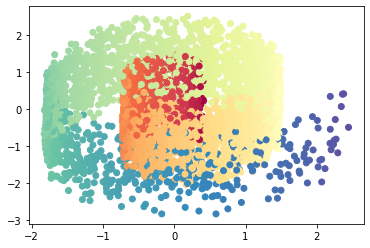

tensor([[0.9997, 0.0318],
        [0.0318, 0.9997]], grad_fn=<DivBackward0>)
Epoch=030, loss=4.7699, time=0.4481
loss before neg tensor(2.7292, grad_fn=<SubBackward0>)
loss after neg tensor(2.0382, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7676, grad_fn=<AddBackward0>)
Epoch=031, loss=4.7676, time=0.2432
loss before neg tensor(2.7294, grad_fn=<SubBackward0>)
loss after neg tensor(2.0446, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7741, grad_fn=<AddBackward0>)
Epoch=032, loss=4.7741, time=0.2583
loss before neg tensor(2.7295, grad_fn=<SubBackward0>)
loss after neg tensor(2.0452, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7749, grad_fn=<AddBackward0>)
Epoch=033, loss=4.7749, time=0.2535
loss before neg tensor(2.7297, grad_fn=<SubBackward0>)
loss after neg tensor(2.0416, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0

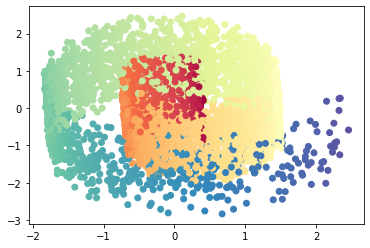

tensor([[ 0.9998, -0.0310],
        [-0.0310,  0.9998]], grad_fn=<DivBackward0>)
Epoch=040, loss=4.7775, time=0.3732
loss before neg tensor(2.7299, grad_fn=<SubBackward0>)
loss after neg tensor(2.0412, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7714, grad_fn=<AddBackward0>)
Epoch=041, loss=4.7714, time=0.1679
loss before neg tensor(2.7300, grad_fn=<SubBackward0>)
loss after neg tensor(2.0467, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7769, grad_fn=<AddBackward0>)
Epoch=042, loss=4.7769, time=0.1353
loss before neg tensor(2.7300, grad_fn=<SubBackward0>)
loss after neg tensor(2.0422, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7724, grad_fn=<AddBackward0>)
Epoch=043, loss=4.7724, time=0.1392
loss before neg tensor(2.7300, grad_fn=<SubBackward0>)
loss after neg tensor(2.0423, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

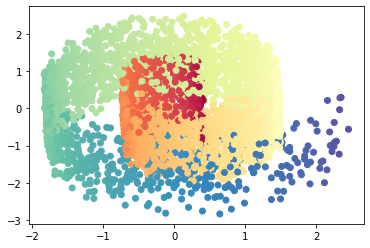

tensor([[ 0.9998, -0.0114],
        [-0.0114,  0.9997]], grad_fn=<DivBackward0>)
Epoch=050, loss=4.7687, time=0.3827
loss before neg tensor(2.7298, grad_fn=<SubBackward0>)
loss after neg tensor(2.0409, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7709, grad_fn=<AddBackward0>)
Epoch=051, loss=4.7709, time=0.1383
loss before neg tensor(2.7298, grad_fn=<SubBackward0>)
loss after neg tensor(2.0392, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7692, grad_fn=<AddBackward0>)
Epoch=052, loss=4.7692, time=0.1360
loss before neg tensor(2.7297, grad_fn=<SubBackward0>)
loss after neg tensor(2.0392, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7691, grad_fn=<AddBackward0>)
Epoch=053, loss=4.7691, time=0.1489
loss before neg tensor(2.7297, grad_fn=<SubBackward0>)
loss after neg tensor(2.0396, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

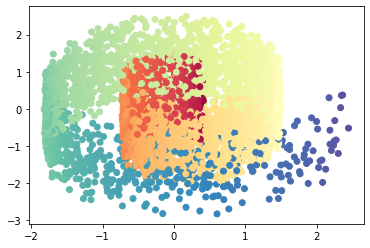

tensor([[0.9998, 0.0160],
        [0.0160, 0.9998]], grad_fn=<DivBackward0>)
Epoch=060, loss=4.7768, time=0.3570
loss before neg tensor(2.7292, grad_fn=<SubBackward0>)
loss after neg tensor(2.0446, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7739, grad_fn=<AddBackward0>)
Epoch=061, loss=4.7739, time=0.1613
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0460, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7753, grad_fn=<AddBackward0>)
Epoch=062, loss=4.7753, time=0.1497
loss before neg tensor(2.7290, grad_fn=<SubBackward0>)
loss after neg tensor(2.0435, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7727, grad_fn=<AddBackward0>)
Epoch=063, loss=4.7727, time=0.1506
loss before neg tensor(2.7290, grad_fn=<SubBackward0>)
loss after neg tensor(2.0456, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0

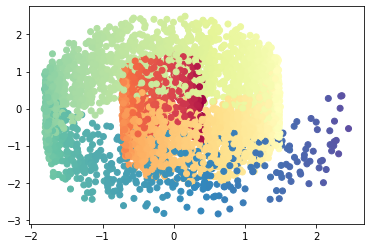

tensor([[0.9998, 0.0046],
        [0.0046, 0.9997]], grad_fn=<DivBackward0>)
Epoch=070, loss=4.7673, time=0.4075
loss before neg tensor(2.7294, grad_fn=<SubBackward0>)
loss after neg tensor(2.0384, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7680, grad_fn=<AddBackward0>)
Epoch=071, loss=4.7680, time=0.1669
loss before neg tensor(2.7295, grad_fn=<SubBackward0>)
loss after neg tensor(2.0419, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7715, grad_fn=<AddBackward0>)
Epoch=072, loss=4.7715, time=0.1596
loss before neg tensor(2.7295, grad_fn=<SubBackward0>)
loss after neg tensor(2.0480, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7777, grad_fn=<AddBackward0>)
Epoch=073, loss=4.7777, time=0.1549
loss before neg tensor(2.7296, grad_fn=<SubBackward0>)
loss after neg tensor(2.0429, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0

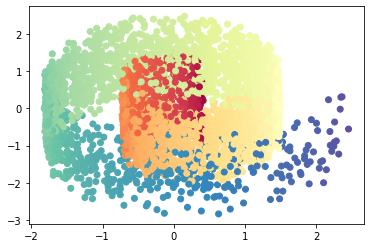

tensor([[ 0.9998, -0.0048],
        [-0.0048,  0.9998]], grad_fn=<DivBackward0>)
Epoch=080, loss=4.7747, time=0.3917
loss before neg tensor(2.7296, grad_fn=<SubBackward0>)
loss after neg tensor(2.0399, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7697, grad_fn=<AddBackward0>)
Epoch=081, loss=4.7697, time=0.1718
loss before neg tensor(2.7296, grad_fn=<SubBackward0>)
loss after neg tensor(2.0395, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7693, grad_fn=<AddBackward0>)
Epoch=082, loss=4.7693, time=0.1546
loss before neg tensor(2.7295, grad_fn=<SubBackward0>)
loss after neg tensor(2.0494, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7791, grad_fn=<AddBackward0>)
Epoch=083, loss=4.7791, time=0.1327
loss before neg tensor(2.7295, grad_fn=<SubBackward0>)
loss after neg tensor(2.0379, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

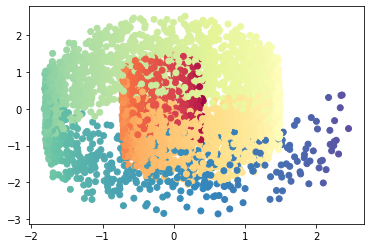

tensor([[0.9998, 0.0049],
        [0.0049, 0.9998]], grad_fn=<DivBackward0>)
Epoch=090, loss=4.7682, time=0.4336
loss before neg tensor(2.7289, grad_fn=<SubBackward0>)
loss after neg tensor(2.0414, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7706, grad_fn=<AddBackward0>)
Epoch=091, loss=4.7706, time=0.1761
loss before neg tensor(2.7289, grad_fn=<SubBackward0>)
loss after neg tensor(2.0488, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7779, grad_fn=<AddBackward0>)
Epoch=092, loss=4.7779, time=0.1783
loss before neg tensor(2.7288, grad_fn=<SubBackward0>)
loss after neg tensor(2.0374, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7664, grad_fn=<AddBackward0>)
Epoch=093, loss=4.7664, time=0.1525
loss before neg tensor(2.7288, grad_fn=<SubBackward0>)
loss after neg tensor(2.0463, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0

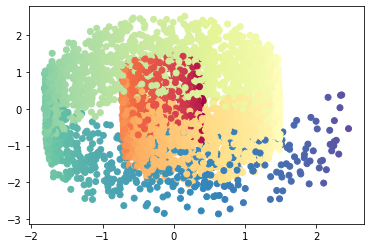

tensor([[0.9997, 0.0026],
        [0.0026, 0.9998]], grad_fn=<DivBackward0>)
Epoch=100, loss=4.7680, time=0.5029
loss before neg tensor(2.7290, grad_fn=<SubBackward0>)
loss after neg tensor(2.0411, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7703, grad_fn=<AddBackward0>)
Epoch=101, loss=4.7703, time=0.1537
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0428, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7721, grad_fn=<AddBackward0>)
Epoch=102, loss=4.7721, time=0.1341
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0380, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7673, grad_fn=<AddBackward0>)
Epoch=103, loss=4.7673, time=0.1484
loss before neg tensor(2.7292, grad_fn=<SubBackward0>)
loss after neg tensor(2.0429, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0

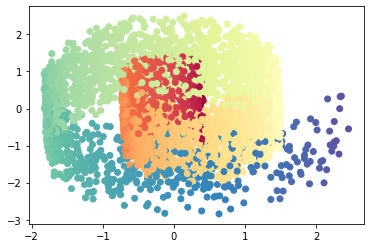

tensor([[ 0.9997, -0.0030],
        [-0.0030,  0.9997]], grad_fn=<DivBackward0>)
Epoch=110, loss=4.7696, time=0.3473
loss before neg tensor(2.7294, grad_fn=<SubBackward0>)
loss after neg tensor(2.0384, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7680, grad_fn=<AddBackward0>)
Epoch=111, loss=4.7680, time=0.1678
loss before neg tensor(2.7293, grad_fn=<SubBackward0>)
loss after neg tensor(2.0288, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7583, grad_fn=<AddBackward0>)
Epoch=112, loss=4.7583, time=0.2291
loss before neg tensor(2.7292, grad_fn=<SubBackward0>)
loss after neg tensor(2.0421, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7715, grad_fn=<AddBackward0>)
Epoch=113, loss=4.7715, time=0.1629
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0423, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

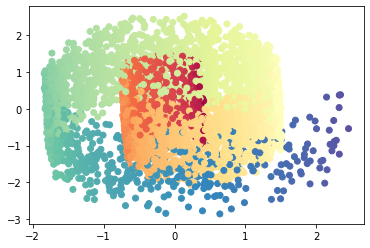

tensor([[ 9.9975e-01, -1.4023e-04],
        [-1.4023e-04,  9.9975e-01]], grad_fn=<DivBackward0>)
Epoch=120, loss=4.7740, time=0.4375
loss before neg tensor(2.7289, grad_fn=<SubBackward0>)
loss after neg tensor(2.0415, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7706, grad_fn=<AddBackward0>)
Epoch=121, loss=4.7706, time=0.1497
loss before neg tensor(2.7289, grad_fn=<SubBackward0>)
loss after neg tensor(2.0462, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7753, grad_fn=<AddBackward0>)
Epoch=122, loss=4.7753, time=0.1716
loss before neg tensor(2.7289, grad_fn=<SubBackward0>)
loss after neg tensor(2.0451, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7743, grad_fn=<AddBackward0>)
Epoch=123, loss=4.7743, time=0.1824
loss before neg tensor(2.7289, grad_fn=<SubBackward0>)
loss after neg tensor(2.0458, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, g

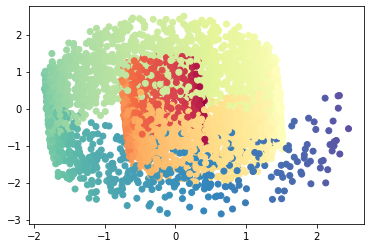

tensor([[ 0.9998, -0.0029],
        [-0.0029,  0.9998]], grad_fn=<DivBackward0>)
Epoch=130, loss=4.7703, time=0.3566
loss before neg tensor(2.7292, grad_fn=<SubBackward0>)
loss after neg tensor(2.0421, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7716, grad_fn=<AddBackward0>)
Epoch=131, loss=4.7716, time=0.1372
loss before neg tensor(2.7293, grad_fn=<SubBackward0>)
loss after neg tensor(2.0406, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7701, grad_fn=<AddBackward0>)
Epoch=132, loss=4.7701, time=0.1373
Early stopping at epoch 132!
Loading 112th epoch


<Figure size 432x288 with 0 Axes>

(array([[   0.,   65.,  503.,  285., 1002.,  635.,  489.,  744.,  257.,
           20.],
        [  25.,  117.,  305.,  580.,  742.,  739.,  669.,  515.,  229.,
           79.]]),
 array([-2.84788585, -2.31347275, -1.77905989, -1.24464679, -0.71023381,
        -0.17582083,  0.35859218,  0.89300519,  1.42741823,  1.96183121,
         2.49624419]),
 <a list of 2 BarContainer objects>)

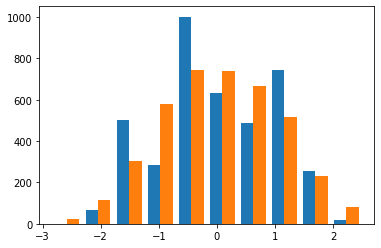

<Figure size 432x288 with 0 Axes>

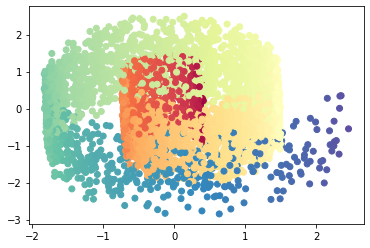

tensor([[ 0.9997, -0.0022],
        [-0.0022,  0.9997]], grad_fn=<DivBackward0>)


In [53]:
#xx = torch.ones((X.shape[0], 10))
# new_data2.x =  new_data.x[:,:2] # leave out z-axis
model, target_index,_,_ =  train_gnumap(new_data,
                                     target=None, hid_dim=256, dim=2,
                                     n_layers=1, must_propagate= [True, True, True, True, True],
                                     method = 'laplacian', alpha=0.5,
                                     gnn_type='symmetric', repulsion_strength=10.,
                                     norm='standardize', neighbours=15,
                                     beta=1, patience=20, epochs=1000,
                                    # feat_drop_rate = 0.1, edge_mask_rate = 0.5,
                                     lr=1e-2,
                                     wd=1e-4,
                                     lambd_corr=1e-4,
                                     min_dist=0.001,subsampling=100000)
out = model(new_data.x.float(), new_data.edge_index)
plt.figure()
plt.hist(out.detach().numpy())
plt.show()
u = out.detach().numpy()
plt.figure()
plt.scatter(u[:,0], u[:,1], c = t,
            cmap="Spectral")
plt.show()
print(torch.mm(out.T, out)/ new_data.num_nodes)

$\alpha$ = 0.5, $\lambda$ = 1e-4 with edge-dropping

Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(2.7337, grad_fn=<SubBackward0>)
loss after neg tensor(2.0478, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7817, grad_fn=<AddBackward0>)


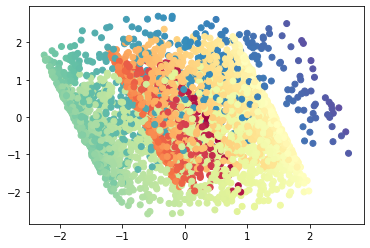

tensor([[ 0.9997, -0.0853],
        [-0.0853,  0.9998]], grad_fn=<DivBackward0>)
Epoch=000, loss=4.7817, time=0.3139
loss before neg tensor(2.7335, grad_fn=<SubBackward0>)
loss after neg tensor(2.0526, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7864, grad_fn=<AddBackward0>)
Epoch=001, loss=4.7864, time=0.1374
loss before neg tensor(2.7333, grad_fn=<SubBackward0>)
loss after neg tensor(2.0498, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7833, grad_fn=<AddBackward0>)
Epoch=002, loss=4.7833, time=0.1307
loss before neg tensor(2.7330, grad_fn=<SubBackward0>)
loss after neg tensor(2.0508, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7840, grad_fn=<AddBackward0>)
Epoch=003, loss=4.7840, time=0.1343
loss before neg tensor(2.7328, grad_fn=<SubBackward0>)
loss after neg tensor(2.0364, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

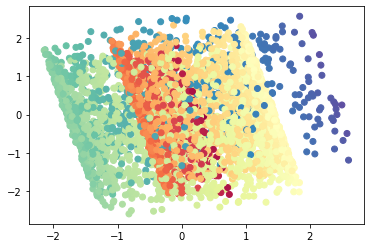

tensor([[0.9998, 0.0034],
        [0.0034, 0.9998]], grad_fn=<DivBackward0>)
Epoch=010, loss=4.7781, time=0.3284
loss before neg tensor(2.7313, grad_fn=<SubBackward0>)
loss after neg tensor(2.0496, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7811, grad_fn=<AddBackward0>)
Epoch=011, loss=4.7811, time=0.1471
loss before neg tensor(2.7311, grad_fn=<SubBackward0>)
loss after neg tensor(2.0414, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7727, grad_fn=<AddBackward0>)
Epoch=012, loss=4.7727, time=0.1336
loss before neg tensor(2.7309, grad_fn=<SubBackward0>)
loss after neg tensor(2.0447, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7758, grad_fn=<AddBackward0>)
Epoch=013, loss=4.7758, time=0.1505
loss before neg tensor(2.7307, grad_fn=<SubBackward0>)
loss after neg tensor(2.0416, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0

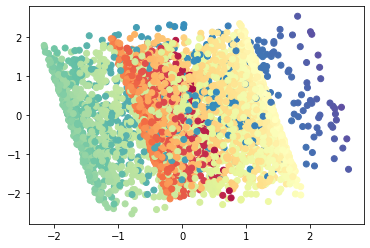

tensor([[ 0.9998, -0.0263],
        [-0.0263,  0.9998]], grad_fn=<DivBackward0>)
Epoch=020, loss=4.7718, time=0.3297
loss before neg tensor(2.7297, grad_fn=<SubBackward0>)
loss after neg tensor(2.0456, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7755, grad_fn=<AddBackward0>)
Epoch=021, loss=4.7755, time=0.1354
loss before neg tensor(2.7296, grad_fn=<SubBackward0>)
loss after neg tensor(2.0395, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7693, grad_fn=<AddBackward0>)
Epoch=022, loss=4.7693, time=0.1330
loss before neg tensor(2.7296, grad_fn=<SubBackward0>)
loss after neg tensor(2.0413, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7710, grad_fn=<AddBackward0>)
Epoch=023, loss=4.7710, time=0.1422
loss before neg tensor(2.7295, grad_fn=<SubBackward0>)
loss after neg tensor(2.0407, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

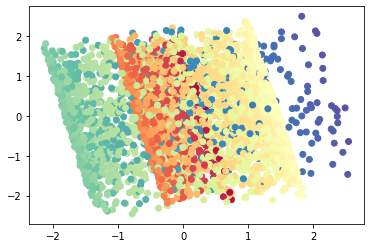

tensor([[ 0.9998, -0.0081],
        [-0.0081,  0.9998]], grad_fn=<DivBackward0>)
Epoch=030, loss=4.7718, time=0.3429
loss before neg tensor(2.7293, grad_fn=<SubBackward0>)
loss after neg tensor(2.0476, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7771, grad_fn=<AddBackward0>)
Epoch=031, loss=4.7771, time=0.1581
loss before neg tensor(2.7293, grad_fn=<SubBackward0>)
loss after neg tensor(2.0349, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7644, grad_fn=<AddBackward0>)
Epoch=032, loss=4.7644, time=0.1636
loss before neg tensor(2.7293, grad_fn=<SubBackward0>)
loss after neg tensor(2.0415, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7710, grad_fn=<AddBackward0>)
Epoch=033, loss=4.7710, time=0.1284
loss before neg tensor(2.7292, grad_fn=<SubBackward0>)
loss after neg tensor(2.0473, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

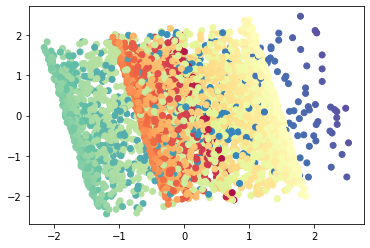

tensor([[ 0.9998, -0.0148],
        [-0.0148,  0.9997]], grad_fn=<DivBackward0>)
Epoch=040, loss=4.7776, time=0.3136
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0457, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7750, grad_fn=<AddBackward0>)
Epoch=041, loss=4.7750, time=0.1641
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0418, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7711, grad_fn=<AddBackward0>)
Epoch=042, loss=4.7711, time=0.1664
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0417, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7710, grad_fn=<AddBackward0>)
Epoch=043, loss=4.7710, time=0.1685
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0494, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

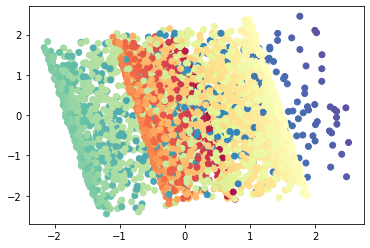

tensor([[ 0.9997, -0.0148],
        [-0.0148,  0.9997]], grad_fn=<DivBackward0>)
Epoch=050, loss=4.7751, time=0.3436
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0457, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7750, grad_fn=<AddBackward0>)
Epoch=051, loss=4.7750, time=0.1435
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0442, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7735, grad_fn=<AddBackward0>)
Epoch=052, loss=4.7735, time=0.1404
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0415, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7707, grad_fn=<AddBackward0>)
Epoch=053, loss=4.7707, time=0.1492
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0395, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

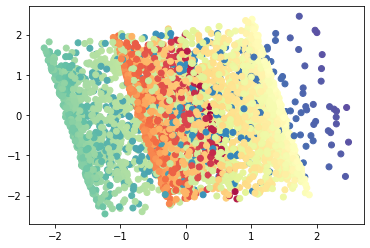

tensor([[ 0.9997, -0.0117],
        [-0.0117,  0.9998]], grad_fn=<DivBackward0>)
Epoch=060, loss=4.7669, time=0.3369
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0533, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7826, grad_fn=<AddBackward0>)
Epoch=061, loss=4.7826, time=0.1568
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0422, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7715, grad_fn=<AddBackward0>)
Epoch=062, loss=4.7715, time=0.1338
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0410, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackward0>)
loss final tensor(4.7703, grad_fn=<AddBackward0>)
Epoch=063, loss=4.7703, time=0.1377
loss before neg tensor(2.7291, grad_fn=<SubBackward0>)
loss after neg tensor(2.0389, grad_fn=<NegBackward0>)
loss corr tensor(0.0002, grad_fn=<MulBackw

<Figure size 432x288 with 0 Axes>

(array([[ 31., 369., 340., 648., 708., 544., 511., 671., 160.,  18.],
        [ 54., 270., 477., 564., 671., 642., 593., 475., 221.,  33.]]),
 array([-2.4506886 , -1.95409703, -1.45750535, -0.96091378, -0.46432215,
         0.03226948,  0.52886111,  1.02545273,  1.5220443 ,  2.01863599,
         2.51522756]),
 <a list of 2 BarContainer objects>)

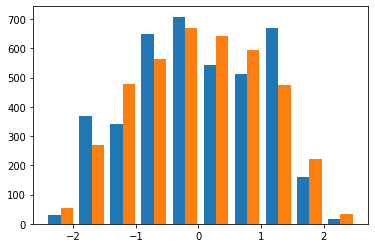

<Figure size 432x288 with 0 Axes>

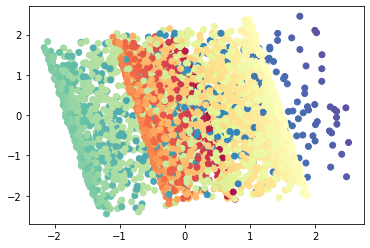

tensor([[ 0.9997, -0.0148],
        [-0.0148,  0.9997]], grad_fn=<DivBackward0>)


In [54]:
#xx = torch.ones((X.shape[0], 10))
# new_data2.x =  new_data.x[:,:2] # leave out z-axis
model, target_index,_,_ =  train_gnumap(new_data,
                                     target=None, hid_dim=256, dim=2,
                                     n_layers=1, must_propagate= [True, True, True, True, True],
                                     method = 'laplacian', alpha=0.5,
                                     gnn_type='symmetric', repulsion_strength=10.,
                                     norm='standardize', neighbours=15,
                                     beta=1, patience=20, epochs=1000,
                                     feat_drop_rate = 0.1, edge_mask_rate = 0.5,
                                     lr=1e-2,
                                     wd=1e-4,
                                     lambd_corr=1e-4,
                                     min_dist=0.001,subsampling=100000)
out = model(new_data.x.float(), new_data.edge_index)
plt.figure()
plt.hist(out.detach().numpy())
plt.show()
u = out.detach().numpy()
plt.figure()
plt.scatter(u[:,0], u[:,1], c = t,
            cmap="Spectral")
plt.show()
print(torch.mm(out.T, out)/ new_data.num_nodes)

$\alpha$ = 0.5, $\lambda$ = 1

Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(2.7299, grad_fn=<SubBackward0>)
loss after neg tensor(2.0980, grad_fn=<NegBackward0>)
loss corr tensor(4.8731, grad_fn=<MulBackward0>)
loss final tensor(9.7010, grad_fn=<AddBackward0>)


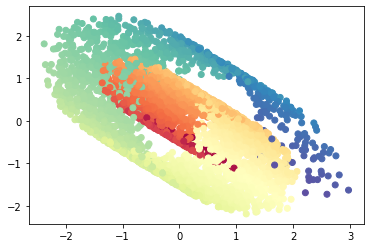

tensor([[ 0.9997, -0.4349],
        [-0.4349,  0.9998]], grad_fn=<DivBackward0>)
Epoch=000, loss=9.7010, time=0.3729
loss before neg tensor(2.7302, grad_fn=<SubBackward0>)
loss after neg tensor(2.0856, grad_fn=<NegBackward0>)
loss corr tensor(4.6379, grad_fn=<MulBackward0>)
loss final tensor(9.4538, grad_fn=<AddBackward0>)
Epoch=001, loss=9.4538, time=0.1670
loss before neg tensor(2.7305, grad_fn=<SubBackward0>)
loss after neg tensor(2.0666, grad_fn=<NegBackward0>)
loss corr tensor(4.4056, grad_fn=<MulBackward0>)
loss final tensor(9.2027, grad_fn=<AddBackward0>)
Epoch=002, loss=9.2027, time=0.1827
loss before neg tensor(2.7308, grad_fn=<SubBackward0>)
loss after neg tensor(2.0687, grad_fn=<NegBackward0>)
loss corr tensor(4.1771, grad_fn=<MulBackward0>)
loss final tensor(8.9766, grad_fn=<AddBackward0>)
Epoch=003, loss=8.9766, time=0.1399
loss before neg tensor(2.7312, grad_fn=<SubBackward0>)
loss after neg tensor(2.0690, grad_fn=<NegBackward0>)
loss corr tensor(3.9533, grad_fn=<MulBackw

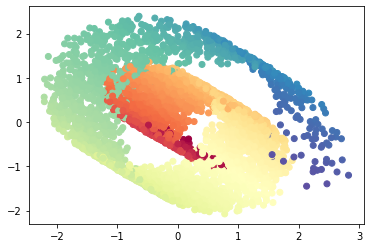

tensor([[ 0.9998, -0.1535],
        [-0.1535,  0.9997]], grad_fn=<DivBackward0>)
Epoch=010, loss=7.5343, time=0.4827
loss before neg tensor(2.7334, grad_fn=<SubBackward0>)
loss after neg tensor(2.0421, grad_fn=<NegBackward0>)
loss corr tensor(2.5855, grad_fn=<MulBackward0>)
loss final tensor(7.3610, grad_fn=<AddBackward0>)
Epoch=011, loss=7.3610, time=0.2952
loss before neg tensor(2.7337, grad_fn=<SubBackward0>)
loss after neg tensor(2.0375, grad_fn=<NegBackward0>)
loss corr tensor(2.4271, grad_fn=<MulBackward0>)
loss final tensor(7.1983, grad_fn=<AddBackward0>)
Epoch=012, loss=7.1983, time=0.2004
loss before neg tensor(2.7341, grad_fn=<SubBackward0>)
loss after neg tensor(2.0459, grad_fn=<NegBackward0>)
loss corr tensor(2.2796, grad_fn=<MulBackward0>)
loss final tensor(7.0595, grad_fn=<AddBackward0>)
Epoch=013, loss=7.0595, time=0.1508
loss before neg tensor(2.7344, grad_fn=<SubBackward0>)
loss after neg tensor(2.0495, grad_fn=<NegBackward0>)
loss corr tensor(2.1433, grad_fn=<MulBackw

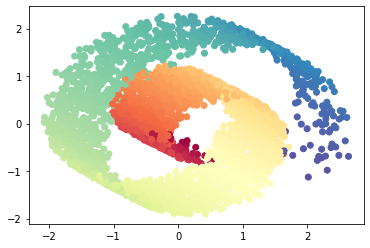

tensor([[0.9998, 0.1354],
        [0.1354, 0.9998]], grad_fn=<DivBackward0>)
Epoch=020, loss=6.3499, time=0.3803
loss before neg tensor(2.7363, grad_fn=<SubBackward0>)
loss after neg tensor(2.0596, grad_fn=<NegBackward0>)
loss corr tensor(1.5101, grad_fn=<MulBackward0>)
loss final tensor(6.3060, grad_fn=<AddBackward0>)
Epoch=021, loss=6.3060, time=0.1494
loss before neg tensor(2.7365, grad_fn=<SubBackward0>)
loss after neg tensor(2.0517, grad_fn=<NegBackward0>)
loss corr tensor(1.4624, grad_fn=<MulBackward0>)
loss final tensor(6.2506, grad_fn=<AddBackward0>)
Epoch=022, loss=6.2506, time=0.1663
loss before neg tensor(2.7367, grad_fn=<SubBackward0>)
loss after neg tensor(2.0591, grad_fn=<NegBackward0>)
loss corr tensor(1.4236, grad_fn=<MulBackward0>)
loss final tensor(6.2195, grad_fn=<AddBackward0>)
Epoch=023, loss=6.2195, time=0.1729
loss before neg tensor(2.7369, grad_fn=<SubBackward0>)
loss after neg tensor(2.0650, grad_fn=<NegBackward0>)
loss corr tensor(1.3931, grad_fn=<MulBackward0

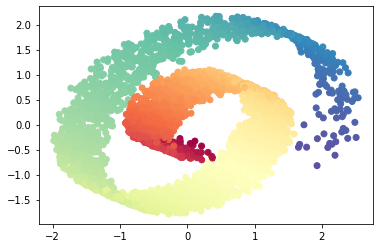

tensor([[0.9998, 0.3407],
        [0.3407, 0.9997]], grad_fn=<DivBackward0>)
Epoch=030, loss=6.1532, time=0.3874
loss before neg tensor(2.7379, grad_fn=<SubBackward0>)
loss after neg tensor(2.0947, grad_fn=<NegBackward0>)
loss corr tensor(1.3351, grad_fn=<MulBackward0>)
loss final tensor(6.1677, grad_fn=<AddBackward0>)
Epoch=031, loss=6.1677, time=0.1617
loss before neg tensor(2.7380, grad_fn=<SubBackward0>)
loss after neg tensor(2.0974, grad_fn=<NegBackward0>)
loss corr tensor(1.3384, grad_fn=<MulBackward0>)
loss final tensor(6.1738, grad_fn=<AddBackward0>)
Epoch=032, loss=6.1738, time=0.1487
loss before neg tensor(2.7381, grad_fn=<SubBackward0>)
loss after neg tensor(2.0844, grad_fn=<NegBackward0>)
loss corr tensor(1.3425, grad_fn=<MulBackward0>)
loss final tensor(6.1649, grad_fn=<AddBackward0>)
Epoch=033, loss=6.1649, time=0.1572
loss before neg tensor(2.7381, grad_fn=<SubBackward0>)
loss after neg tensor(2.0876, grad_fn=<NegBackward0>)
loss corr tensor(1.3466, grad_fn=<MulBackward0

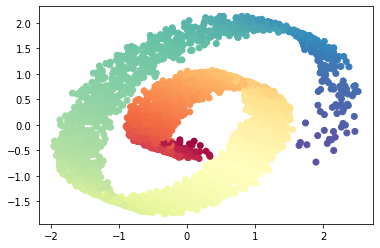

tensor([[0.9998, 0.3982],
        [0.3982, 0.9997]], grad_fn=<DivBackward0>)
Epoch=040, loss=6.1936, time=0.3734
loss before neg tensor(2.7383, grad_fn=<SubBackward0>)
loss after neg tensor(2.0997, grad_fn=<NegBackward0>)
loss corr tensor(1.3569, grad_fn=<MulBackward0>)
loss final tensor(6.1949, grad_fn=<AddBackward0>)
Epoch=041, loss=6.1949, time=0.1569
loss before neg tensor(2.7383, grad_fn=<SubBackward0>)
loss after neg tensor(2.1111, grad_fn=<NegBackward0>)
loss corr tensor(1.3552, grad_fn=<MulBackward0>)
loss final tensor(6.2046, grad_fn=<AddBackward0>)
Epoch=042, loss=6.2046, time=0.1444
loss before neg tensor(2.7382, grad_fn=<SubBackward0>)
loss after neg tensor(2.0976, grad_fn=<NegBackward0>)
loss corr tensor(1.3530, grad_fn=<MulBackward0>)
loss final tensor(6.1888, grad_fn=<AddBackward0>)
Epoch=043, loss=6.1888, time=0.1502
loss before neg tensor(2.7382, grad_fn=<SubBackward0>)
loss after neg tensor(2.1031, grad_fn=<NegBackward0>)
loss corr tensor(1.3505, grad_fn=<MulBackward0

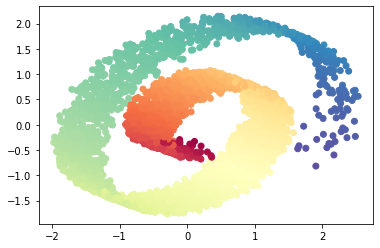

tensor([[0.9998, 0.3572],
        [0.3572, 0.9997]], grad_fn=<DivBackward0>)
Epoch=050, loss=6.1667, time=0.3946
loss before neg tensor(2.7379, grad_fn=<SubBackward0>)
loss after neg tensor(2.0874, grad_fn=<NegBackward0>)
loss corr tensor(1.3347, grad_fn=<MulBackward0>)
loss final tensor(6.1600, grad_fn=<AddBackward0>)
Epoch=051, loss=6.1600, time=0.1577
loss before neg tensor(2.7379, grad_fn=<SubBackward0>)
loss after neg tensor(2.0879, grad_fn=<NegBackward0>)
loss corr tensor(1.3336, grad_fn=<MulBackward0>)
loss final tensor(6.1594, grad_fn=<AddBackward0>)
Epoch=052, loss=6.1594, time=0.1419
loss before neg tensor(2.7378, grad_fn=<SubBackward0>)
loss after neg tensor(2.0876, grad_fn=<NegBackward0>)
loss corr tensor(1.3330, grad_fn=<MulBackward0>)
loss final tensor(6.1584, grad_fn=<AddBackward0>)
Epoch=053, loss=6.1584, time=0.1503
loss before neg tensor(2.7378, grad_fn=<SubBackward0>)
loss after neg tensor(2.0861, grad_fn=<NegBackward0>)
loss corr tensor(1.3327, grad_fn=<MulBackward0

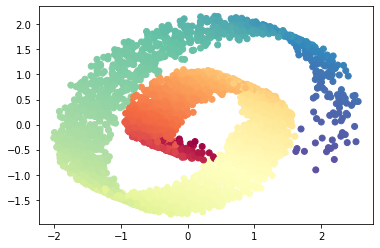

tensor([[0.9998, 0.3098],
        [0.3098, 0.9998]], grad_fn=<DivBackward0>)
Epoch=060, loss=6.1362, time=0.3834
loss before neg tensor(2.7375, grad_fn=<SubBackward0>)
loss after neg tensor(2.0787, grad_fn=<NegBackward0>)
loss corr tensor(1.3369, grad_fn=<MulBackward0>)
loss final tensor(6.1531, grad_fn=<AddBackward0>)
Epoch=061, loss=6.1531, time=0.1584
loss before neg tensor(2.7375, grad_fn=<SubBackward0>)
loss after neg tensor(2.0760, grad_fn=<NegBackward0>)
loss corr tensor(1.3377, grad_fn=<MulBackward0>)
loss final tensor(6.1513, grad_fn=<AddBackward0>)
Epoch=062, loss=6.1513, time=0.1585
loss before neg tensor(2.7375, grad_fn=<SubBackward0>)
loss after neg tensor(2.0756, grad_fn=<NegBackward0>)
loss corr tensor(1.3386, grad_fn=<MulBackward0>)
loss final tensor(6.1517, grad_fn=<AddBackward0>)
Epoch=063, loss=6.1517, time=0.1635
loss before neg tensor(2.7374, grad_fn=<SubBackward0>)
loss after neg tensor(2.0714, grad_fn=<NegBackward0>)
loss corr tensor(1.3393, grad_fn=<MulBackward0

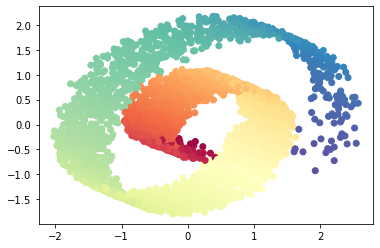

tensor([[0.9997, 0.2956],
        [0.2956, 0.9998]], grad_fn=<DivBackward0>)
Epoch=070, loss=6.1519, time=0.4003
loss before neg tensor(2.7373, grad_fn=<SubBackward0>)
loss after neg tensor(2.0788, grad_fn=<NegBackward0>)
loss corr tensor(1.3410, grad_fn=<MulBackward0>)
loss final tensor(6.1572, grad_fn=<AddBackward0>)
Epoch=071, loss=6.1572, time=0.1692
loss before neg tensor(2.7373, grad_fn=<SubBackward0>)
loss after neg tensor(2.0744, grad_fn=<NegBackward0>)
loss corr tensor(1.3408, grad_fn=<MulBackward0>)
loss final tensor(6.1526, grad_fn=<AddBackward0>)
Epoch=072, loss=6.1526, time=0.1629
loss before neg tensor(2.7373, grad_fn=<SubBackward0>)
loss after neg tensor(2.0801, grad_fn=<NegBackward0>)
loss corr tensor(1.3405, grad_fn=<MulBackward0>)
loss final tensor(6.1579, grad_fn=<AddBackward0>)
Epoch=073, loss=6.1579, time=0.2061
loss before neg tensor(2.7373, grad_fn=<SubBackward0>)
loss after neg tensor(2.0752, grad_fn=<NegBackward0>)
loss corr tensor(1.3402, grad_fn=<MulBackward0

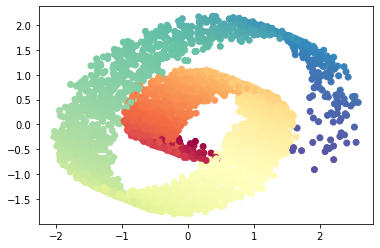

tensor([[0.9997, 0.3052],
        [0.3052, 0.9997]], grad_fn=<DivBackward0>)
Epoch=080, loss=6.1466, time=0.6604
Early stopping at epoch 80!
Loading 60th epoch


<Figure size 432x288 with 0 Axes>

(array([[225., 480., 441., 695., 510., 481., 687., 322., 101.,  58.],
        [193., 595., 360., 605., 519., 702., 569., 187., 260.,  10.]]),
 array([-2.00612712, -1.54975367, -1.09338021, -0.63700676, -0.18063331,
         0.27574015,  0.7321136 ,  1.18848705,  1.64486051,  2.10123396,
         2.55760741]),
 <a list of 2 BarContainer objects>)

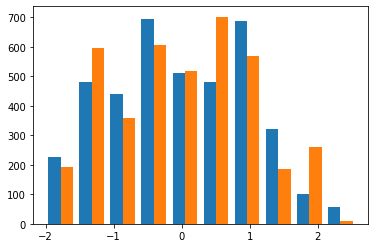

<Figure size 432x288 with 0 Axes>

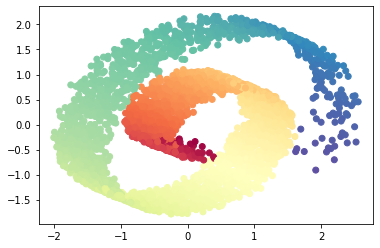

tensor([[0.9997, 0.3068],
        [0.3068, 0.9997]], grad_fn=<DivBackward0>)


In [55]:
#xx = torch.ones((X.shape[0], 10))
# new_data2.x =  new_data.x[:,:2] # leave out z-axis
model, target_index,_,_ =  train_gnumap(new_data,
                                     target=None, hid_dim=256, dim=2,
                                     n_layers=1, must_propagate= [True, True, True, True, True],
                                     method = 'laplacian', alpha=0.5,
                                     gnn_type='symmetric', repulsion_strength=10.,
                                     norm='standardize', neighbours=15,
                                     beta=1, patience=20, epochs=1000,
                                     lr=1e-2,
                                     wd=1e-4,
                                     lambd_corr=1,
                                     min_dist=0.001,subsampling=100000)
out = model(new_data.x.float(), new_data.edge_index)
plt.figure()
plt.hist(out.detach().numpy())
plt.show()
u = out.detach().numpy()
plt.figure()
plt.scatter(u[:,0], u[:,1], c = t,
            cmap="Spectral")
plt.show()
print(torch.mm(out.T, out)/ new_data.num_nodes)

Can this be considered as a good recovery?

What if adding edge-dropping?

Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(2.7368, grad_fn=<SubBackward0>)
loss after neg tensor(2.0710, grad_fn=<NegBackward0>)
loss corr tensor(1.3527, grad_fn=<MulBackward0>)
loss final tensor(6.1606, grad_fn=<AddBackward0>)


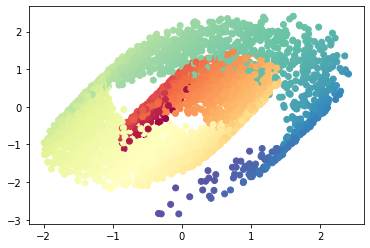

tensor([[0.9998, 0.2754],
        [0.2754, 0.9998]], grad_fn=<DivBackward0>)
Epoch=000, loss=6.1606, time=0.4193
loss before neg tensor(2.7366, grad_fn=<SubBackward0>)
loss after neg tensor(2.0740, grad_fn=<NegBackward0>)
loss corr tensor(1.3400, grad_fn=<MulBackward0>)
loss final tensor(6.1507, grad_fn=<AddBackward0>)
Epoch=001, loss=6.1507, time=0.1505
loss before neg tensor(2.7365, grad_fn=<SubBackward0>)
loss after neg tensor(2.0748, grad_fn=<NegBackward0>)
loss corr tensor(1.3339, grad_fn=<MulBackward0>)
loss final tensor(6.1452, grad_fn=<AddBackward0>)
Epoch=002, loss=6.1452, time=0.1680
loss before neg tensor(2.7363, grad_fn=<SubBackward0>)
loss after neg tensor(2.0750, grad_fn=<NegBackward0>)
loss corr tensor(1.3327, grad_fn=<MulBackward0>)
loss final tensor(6.1440, grad_fn=<AddBackward0>)
Epoch=003, loss=6.1440, time=0.1870
loss before neg tensor(2.7362, grad_fn=<SubBackward0>)
loss after neg tensor(2.0718, grad_fn=<NegBackward0>)
loss corr tensor(1.3331, grad_fn=<MulBackward0

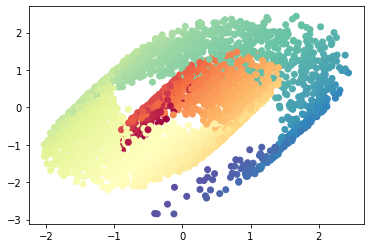

tensor([[0.9997, 0.3081],
        [0.3081, 0.9997]], grad_fn=<DivBackward0>)
Epoch=010, loss=6.1508, time=0.5447
loss before neg tensor(2.7364, grad_fn=<SubBackward0>)
loss after neg tensor(2.0625, grad_fn=<NegBackward0>)
loss corr tensor(1.3379, grad_fn=<MulBackward0>)
loss final tensor(6.1368, grad_fn=<AddBackward0>)
Epoch=011, loss=6.1368, time=0.1967
loss before neg tensor(2.7363, grad_fn=<SubBackward0>)
loss after neg tensor(2.0680, grad_fn=<NegBackward0>)
loss corr tensor(1.3386, grad_fn=<MulBackward0>)
loss final tensor(6.1429, grad_fn=<AddBackward0>)
Epoch=012, loss=6.1429, time=0.2394
loss before neg tensor(2.7363, grad_fn=<SubBackward0>)
loss after neg tensor(2.0745, grad_fn=<NegBackward0>)
loss corr tensor(1.3382, grad_fn=<MulBackward0>)
loss final tensor(6.1490, grad_fn=<AddBackward0>)
Epoch=013, loss=6.1490, time=0.3975
loss before neg tensor(2.7362, grad_fn=<SubBackward0>)
loss after neg tensor(2.0717, grad_fn=<NegBackward0>)
loss corr tensor(1.3372, grad_fn=<MulBackward0

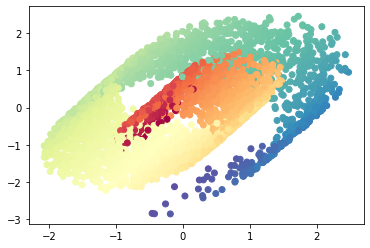

tensor([[0.9997, 0.3279],
        [0.3279, 0.9998]], grad_fn=<DivBackward0>)
Epoch=020, loss=6.1425, time=0.4691
loss before neg tensor(2.7359, grad_fn=<SubBackward0>)
loss after neg tensor(2.0779, grad_fn=<NegBackward0>)
loss corr tensor(1.3329, grad_fn=<MulBackward0>)
loss final tensor(6.1467, grad_fn=<AddBackward0>)
Epoch=021, loss=6.1467, time=0.1680
loss before neg tensor(2.7359, grad_fn=<SubBackward0>)
loss after neg tensor(2.0779, grad_fn=<NegBackward0>)
loss corr tensor(1.3331, grad_fn=<MulBackward0>)
loss final tensor(6.1469, grad_fn=<AddBackward0>)
Epoch=022, loss=6.1469, time=0.1449
loss before neg tensor(2.7359, grad_fn=<SubBackward0>)
loss after neg tensor(2.0686, grad_fn=<NegBackward0>)
loss corr tensor(1.3334, grad_fn=<MulBackward0>)
loss final tensor(6.1379, grad_fn=<AddBackward0>)
Epoch=023, loss=6.1379, time=0.1742
loss before neg tensor(2.7359, grad_fn=<SubBackward0>)
loss after neg tensor(2.0680, grad_fn=<NegBackward0>)
loss corr tensor(1.3340, grad_fn=<MulBackward0

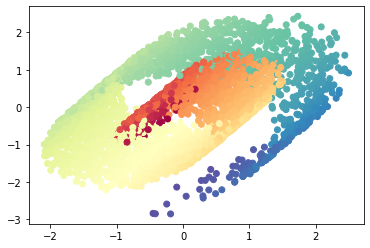

tensor([[0.9997, 0.3128],
        [0.3128, 0.9998]], grad_fn=<DivBackward0>)
Epoch=030, loss=6.1416, time=0.3522
loss before neg tensor(2.7359, grad_fn=<SubBackward0>)
loss after neg tensor(2.0738, grad_fn=<NegBackward0>)
loss corr tensor(1.3346, grad_fn=<MulBackward0>)
loss final tensor(6.1442, grad_fn=<AddBackward0>)
Epoch=031, loss=6.1442, time=0.1611
loss before neg tensor(2.7358, grad_fn=<SubBackward0>)
loss after neg tensor(2.0710, grad_fn=<NegBackward0>)
loss corr tensor(1.3341, grad_fn=<MulBackward0>)
loss final tensor(6.1409, grad_fn=<AddBackward0>)
Epoch=032, loss=6.1409, time=0.1527
loss before neg tensor(2.7358, grad_fn=<SubBackward0>)
loss after neg tensor(2.0594, grad_fn=<NegBackward0>)
loss corr tensor(1.3337, grad_fn=<MulBackward0>)
loss final tensor(6.1289, grad_fn=<AddBackward0>)
Epoch=033, loss=6.1289, time=0.1654
loss before neg tensor(2.7357, grad_fn=<SubBackward0>)
loss after neg tensor(2.0705, grad_fn=<NegBackward0>)
loss corr tensor(1.3334, grad_fn=<MulBackward0

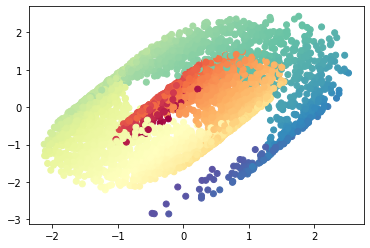

tensor([[0.9998, 0.3162],
        [0.3162, 0.9998]], grad_fn=<DivBackward0>)
Epoch=040, loss=6.1409, time=0.4392
loss before neg tensor(2.7356, grad_fn=<SubBackward0>)
loss after neg tensor(2.0835, grad_fn=<NegBackward0>)
loss corr tensor(1.3347, grad_fn=<MulBackward0>)
loss final tensor(6.1538, grad_fn=<AddBackward0>)
Epoch=041, loss=6.1538, time=0.1391
loss before neg tensor(2.7356, grad_fn=<SubBackward0>)
loss after neg tensor(2.0709, grad_fn=<NegBackward0>)
loss corr tensor(1.3349, grad_fn=<MulBackward0>)
loss final tensor(6.1415, grad_fn=<AddBackward0>)
Epoch=042, loss=6.1415, time=0.1496
loss before neg tensor(2.7356, grad_fn=<SubBackward0>)
loss after neg tensor(2.0697, grad_fn=<NegBackward0>)
loss corr tensor(1.3350, grad_fn=<MulBackward0>)
loss final tensor(6.1403, grad_fn=<AddBackward0>)
Epoch=043, loss=6.1403, time=0.1422
loss before neg tensor(2.7356, grad_fn=<SubBackward0>)
loss after neg tensor(2.0725, grad_fn=<NegBackward0>)
loss corr tensor(1.3348, grad_fn=<MulBackward0

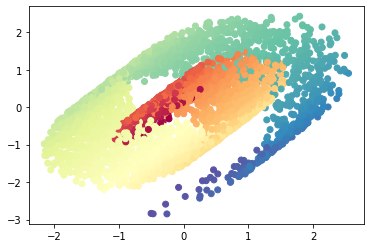

tensor([[0.9998, 0.3199],
        [0.3199, 0.9998]], grad_fn=<DivBackward0>)
Epoch=050, loss=6.1372, time=0.3499
loss before neg tensor(2.7355, grad_fn=<SubBackward0>)
loss after neg tensor(2.0622, grad_fn=<NegBackward0>)
loss corr tensor(1.3338, grad_fn=<MulBackward0>)
loss final tensor(6.1315, grad_fn=<AddBackward0>)
Epoch=051, loss=6.1315, time=0.1452
loss before neg tensor(2.7355, grad_fn=<SubBackward0>)
loss after neg tensor(2.0751, grad_fn=<NegBackward0>)
loss corr tensor(1.3340, grad_fn=<MulBackward0>)
loss final tensor(6.1446, grad_fn=<AddBackward0>)
Epoch=052, loss=6.1446, time=0.1611
loss before neg tensor(2.7355, grad_fn=<SubBackward0>)
loss after neg tensor(2.0742, grad_fn=<NegBackward0>)
loss corr tensor(1.3341, grad_fn=<MulBackward0>)
loss final tensor(6.1438, grad_fn=<AddBackward0>)
Epoch=053, loss=6.1438, time=0.1686
Early stopping at epoch 53!
Loading 33th epoch


<Figure size 432x288 with 0 Axes>

(array([[  0.,  79., 455., 583., 644., 639., 813., 480., 224.,  83.],
        [  7.,  86., 396., 584., 712., 726., 666., 479., 257.,  87.]]),
 array([-2.85121059, -2.31537271, -1.77953494, -1.24369717, -0.70785934,
        -0.17202151,  0.36381632,  0.89965415,  1.43549192,  1.97132981,
         2.50716758]),
 <a list of 2 BarContainer objects>)

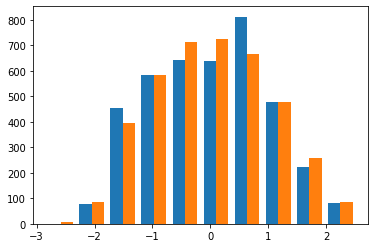

<Figure size 432x288 with 0 Axes>

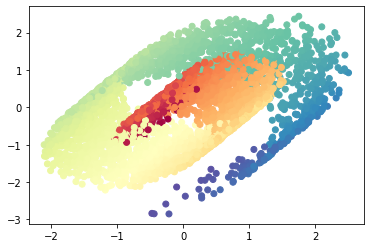

tensor([[0.9997, 0.3220],
        [0.3220, 0.9998]], grad_fn=<DivBackward0>)


In [63]:
#xx = torch.ones((X.shape[0], 10))
# new_data2.x =  new_data.x[:,:2] # leave out z-axis
model, target_index,_,_ =  train_gnumap(new_data,
                                     target=None, hid_dim=256, dim=2,
                                     n_layers=1, must_propagate= [True, True, True, True, True],
                                     method = 'laplacian', alpha=0.5,
                                     gnn_type='symmetric', repulsion_strength=10.,
                                     norm='standardize', neighbours=15,
                                     beta=1, patience=20, epochs=1000,
                                     feat_drop_rate = 0.1, edge_mask_rate = 0.5,
                                     lr=1e-2,
                                     wd=1e-4,
                                     lambd_corr=1,
                                     min_dist=0.001,subsampling=100000)
out = model(new_data.x.float(), new_data.edge_index)
plt.figure()
plt.hist(out.detach().numpy())
plt.show()
u = out.detach().numpy()
plt.figure()
plt.scatter(u[:,0], u[:,1], c = t,
            cmap="Spectral")
plt.show()
print(torch.mm(out.T, out)/ new_data.num_nodes)

$\alpha$ = 0.5, $\lambda$ = 50

Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(2.7125, grad_fn=<SubBackward0>)
loss after neg tensor(2.0587, grad_fn=<NegBackward0>)
loss corr tensor(75.0400, grad_fn=<MulBackward0>)
loss final tensor(79.8113, grad_fn=<AddBackward0>)


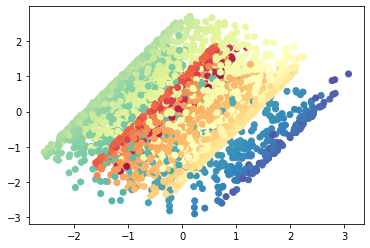

tensor([[0.9998, 0.1659],
        [0.1659, 0.9998]], grad_fn=<DivBackward0>)
Epoch=000, loss=79.8113, time=0.4130
loss before neg tensor(2.7122, grad_fn=<SubBackward0>)
loss after neg tensor(2.0532, grad_fn=<NegBackward0>)
loss corr tensor(72.6940, grad_fn=<MulBackward0>)
loss final tensor(77.4594, grad_fn=<AddBackward0>)
Epoch=001, loss=77.4594, time=0.1390
loss before neg tensor(2.7119, grad_fn=<SubBackward0>)
loss after neg tensor(2.0600, grad_fn=<NegBackward0>)
loss corr tensor(70.7630, grad_fn=<MulBackward0>)
loss final tensor(75.5349, grad_fn=<AddBackward0>)
Epoch=002, loss=75.5349, time=0.1684
loss before neg tensor(2.7116, grad_fn=<SubBackward0>)
loss after neg tensor(2.0620, grad_fn=<NegBackward0>)
loss corr tensor(69.2396, grad_fn=<MulBackward0>)
loss final tensor(74.0132, grad_fn=<AddBackward0>)
Epoch=003, loss=74.0132, time=0.1787
loss before neg tensor(2.7113, grad_fn=<SubBackward0>)
loss after neg tensor(2.0650, grad_fn=<NegBackward0>)
loss corr tensor(68.1039, grad_fn=<M

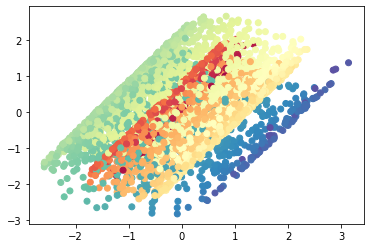

tensor([[0.9998, 0.3670],
        [0.3670, 0.9997]], grad_fn=<DivBackward0>)
Epoch=010, loss=71.7709, time=0.4520
loss before neg tensor(2.7101, grad_fn=<SubBackward0>)
loss after neg tensor(2.0834, grad_fn=<NegBackward0>)
loss corr tensor(67.1855, grad_fn=<MulBackward0>)
loss final tensor(71.9789, grad_fn=<AddBackward0>)
Epoch=011, loss=71.9789, time=0.1902
loss before neg tensor(2.7100, grad_fn=<SubBackward0>)
loss after neg tensor(2.0932, grad_fn=<NegBackward0>)
loss corr tensor(67.3682, grad_fn=<MulBackward0>)
loss final tensor(72.1714, grad_fn=<AddBackward0>)
Epoch=012, loss=72.1714, time=0.1926
loss before neg tensor(2.7100, grad_fn=<SubBackward0>)
loss after neg tensor(2.0931, grad_fn=<NegBackward0>)
loss corr tensor(67.4967, grad_fn=<MulBackward0>)
loss final tensor(72.2997, grad_fn=<AddBackward0>)
Epoch=013, loss=72.2997, time=0.2138
loss before neg tensor(2.7099, grad_fn=<SubBackward0>)
loss after neg tensor(2.0956, grad_fn=<NegBackward0>)
loss corr tensor(67.5587, grad_fn=<M

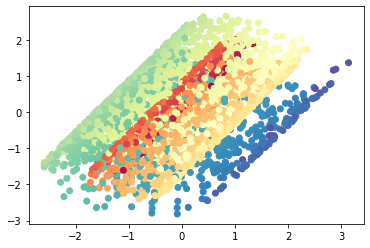

tensor([[0.9997, 0.3662],
        [0.3662, 0.9997]], grad_fn=<DivBackward0>)
Epoch=020, loss=71.7541, time=0.5171
loss before neg tensor(2.7102, grad_fn=<SubBackward0>)
loss after neg tensor(2.0867, grad_fn=<NegBackward0>)
loss corr tensor(66.8357, grad_fn=<MulBackward0>)
loss final tensor(71.6326, grad_fn=<AddBackward0>)
Epoch=021, loss=71.6326, time=0.2203
loss before neg tensor(2.7103, grad_fn=<SubBackward0>)
loss after neg tensor(2.0873, grad_fn=<NegBackward0>)
loss corr tensor(66.7382, grad_fn=<MulBackward0>)
loss final tensor(71.5358, grad_fn=<AddBackward0>)
Epoch=022, loss=71.5358, time=0.1800
loss before neg tensor(2.7104, grad_fn=<SubBackward0>)
loss after neg tensor(2.0761, grad_fn=<NegBackward0>)
loss corr tensor(66.6724, grad_fn=<MulBackward0>)
loss final tensor(71.4588, grad_fn=<AddBackward0>)
Epoch=023, loss=71.4588, time=0.1866
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0766, grad_fn=<NegBackward0>)
loss corr tensor(66.6390, grad_fn=<M

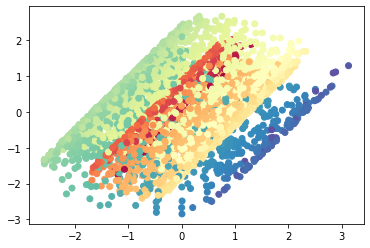

tensor([[0.9997, 0.3104],
        [0.3104, 0.9998]], grad_fn=<DivBackward0>)
Epoch=030, loss=71.5782, time=0.6313
loss before neg tensor(2.7108, grad_fn=<SubBackward0>)
loss after neg tensor(2.0748, grad_fn=<NegBackward0>)
loss corr tensor(66.8050, grad_fn=<MulBackward0>)
loss final tensor(71.5906, grad_fn=<AddBackward0>)
Epoch=031, loss=71.5906, time=0.2100
loss before neg tensor(2.7108, grad_fn=<SubBackward0>)
loss after neg tensor(2.0748, grad_fn=<NegBackward0>)
loss corr tensor(66.8051, grad_fn=<MulBackward0>)
loss final tensor(71.5908, grad_fn=<AddBackward0>)
Epoch=032, loss=71.5908, time=0.1900
loss before neg tensor(2.7108, grad_fn=<SubBackward0>)
loss after neg tensor(2.0724, grad_fn=<NegBackward0>)
loss corr tensor(66.7921, grad_fn=<MulBackward0>)
loss final tensor(71.5753, grad_fn=<AddBackward0>)
Epoch=033, loss=71.5753, time=0.1649
loss before neg tensor(2.7108, grad_fn=<SubBackward0>)
loss after neg tensor(2.0850, grad_fn=<NegBackward0>)
loss corr tensor(66.7690, grad_fn=<M

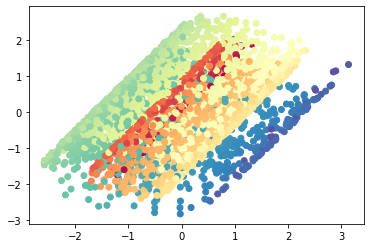

tensor([[0.9998, 0.3311],
        [0.3311, 0.9998]], grad_fn=<DivBackward0>)
Epoch=040, loss=71.4239, time=0.4148
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0747, grad_fn=<NegBackward0>)
loss corr tensor(66.6336, grad_fn=<MulBackward0>)
loss final tensor(71.4189, grad_fn=<AddBackward0>)
Epoch=041, loss=71.4189, time=0.1564
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0758, grad_fn=<NegBackward0>)
loss corr tensor(66.6377, grad_fn=<MulBackward0>)
loss final tensor(71.4241, grad_fn=<AddBackward0>)
Epoch=042, loss=71.4241, time=0.1808
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0797, grad_fn=<NegBackward0>)
loss corr tensor(66.6450, grad_fn=<MulBackward0>)
loss final tensor(71.4351, grad_fn=<AddBackward0>)
Epoch=043, loss=71.4351, time=0.1684
loss before neg tensor(2.7104, grad_fn=<SubBackward0>)
loss after neg tensor(2.0900, grad_fn=<NegBackward0>)
loss corr tensor(66.6530, grad_fn=<M

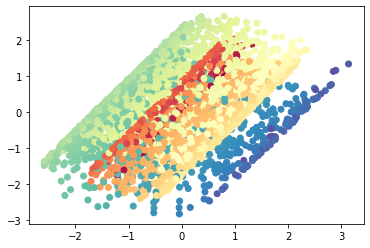

tensor([[0.9998, 0.3418],
        [0.3418, 0.9998]], grad_fn=<DivBackward0>)
Epoch=050, loss=71.4429, time=0.3925
loss before neg tensor(2.7104, grad_fn=<SubBackward0>)
loss after neg tensor(2.0763, grad_fn=<NegBackward0>)
loss corr tensor(66.6489, grad_fn=<MulBackward0>)
loss final tensor(71.4357, grad_fn=<AddBackward0>)
Epoch=051, loss=71.4357, time=0.1773
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0827, grad_fn=<NegBackward0>)
loss corr tensor(66.6429, grad_fn=<MulBackward0>)
loss final tensor(71.4360, grad_fn=<AddBackward0>)
Epoch=052, loss=71.4360, time=0.1613
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0787, grad_fn=<NegBackward0>)
loss corr tensor(66.6380, grad_fn=<MulBackward0>)
loss final tensor(71.4272, grad_fn=<AddBackward0>)
Epoch=053, loss=71.4272, time=0.1636
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0820, grad_fn=<NegBackward0>)
loss corr tensor(66.6348, grad_fn=<M

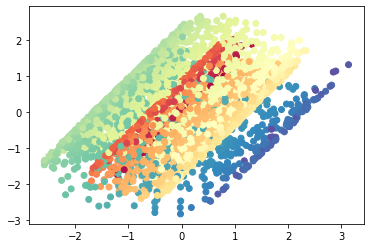

tensor([[0.9998, 0.3281],
        [0.3281, 0.9997]], grad_fn=<DivBackward0>)
Epoch=060, loss=71.4296, time=0.4294
loss before neg tensor(2.7106, grad_fn=<SubBackward0>)
loss after neg tensor(2.0724, grad_fn=<NegBackward0>)
loss corr tensor(66.6424, grad_fn=<MulBackward0>)
loss final tensor(71.4254, grad_fn=<AddBackward0>)
Epoch=061, loss=71.4254, time=0.2089
loss before neg tensor(2.7106, grad_fn=<SubBackward0>)
loss after neg tensor(2.0741, grad_fn=<NegBackward0>)
loss corr tensor(66.6425, grad_fn=<MulBackward0>)
loss final tensor(71.4272, grad_fn=<AddBackward0>)
Epoch=062, loss=71.4272, time=0.1801
loss before neg tensor(2.7106, grad_fn=<SubBackward0>)
loss after neg tensor(2.0667, grad_fn=<NegBackward0>)
loss corr tensor(66.6417, grad_fn=<MulBackward0>)
loss final tensor(71.4190, grad_fn=<AddBackward0>)
Epoch=063, loss=71.4190, time=0.1731
loss before neg tensor(2.7106, grad_fn=<SubBackward0>)
loss after neg tensor(2.0798, grad_fn=<NegBackward0>)
loss corr tensor(66.6403, grad_fn=<M

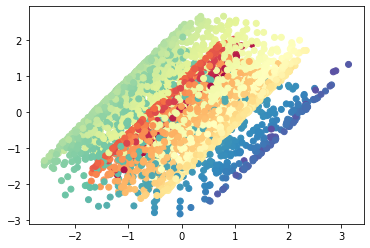

tensor([[0.9998, 0.3333],
        [0.3333, 0.9998]], grad_fn=<DivBackward0>)
Epoch=070, loss=71.4222, time=0.4100
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0771, grad_fn=<NegBackward0>)
loss corr tensor(66.6335, grad_fn=<MulBackward0>)
loss final tensor(71.4211, grad_fn=<AddBackward0>)
Epoch=071, loss=71.4211, time=0.1825
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0844, grad_fn=<NegBackward0>)
loss corr tensor(66.6339, grad_fn=<MulBackward0>)
loss final tensor(71.4288, grad_fn=<AddBackward0>)
Epoch=072, loss=71.4288, time=0.1754
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0838, grad_fn=<NegBackward0>)
loss corr tensor(66.6343, grad_fn=<MulBackward0>)
loss final tensor(71.4286, grad_fn=<AddBackward0>)
Epoch=073, loss=71.4286, time=0.1566
loss before neg tensor(2.7105, grad_fn=<SubBackward0>)
loss after neg tensor(2.0795, grad_fn=<NegBackward0>)
loss corr tensor(66.6346, grad_fn=<M

<Figure size 432x288 with 0 Axes>

(array([[ 22., 177., 475., 679., 838., 817., 619., 286.,  79.,   8.],
        [ 30., 155., 449., 735., 837., 834., 581., 286.,  86.,   7.]]),
 array([-2.83427119, -2.23746467, -1.64065814, -1.04385161, -0.44704509,
         0.14976144,  0.74656796,  1.34337449,  1.94018102,  2.53698754,
         3.13379407]),
 <a list of 2 BarContainer objects>)

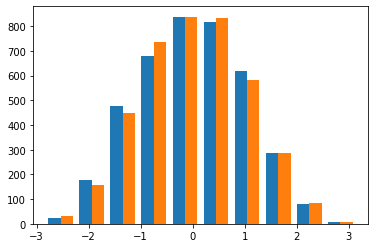

<Figure size 432x288 with 0 Axes>

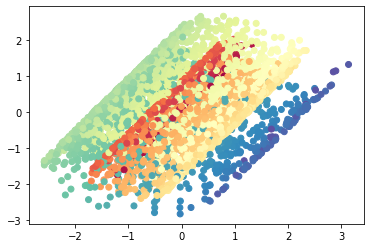

tensor([[0.9997, 0.3321],
        [0.3321, 0.9998]], grad_fn=<DivBackward0>)


In [56]:
#xx = torch.ones((X.shape[0], 10))
# new_data2.x =  new_data.x[:,:2] # leave out z-axis
model, target_index,_,_ =  train_gnumap(new_data,
                                     target=None, hid_dim=256, dim=2,
                                     n_layers=1, must_propagate= [True, True, True, True, True],
                                     method = 'laplacian', alpha=0.5,
                                     gnn_type='symmetric', repulsion_strength=10.,
                                     norm='standardize', neighbours=15,
                                     beta=1, patience=20, epochs=1000,
                                    # feat_drop_rate = 0.5, edge_mask_rate =0.1,
                                     lr=1e-2,
                                     wd=1e-4,
                                     lambd_corr=50.,
                                     min_dist=0.001,subsampling=100000)
out = model(new_data.x.float(), new_data.edge_index)
plt.figure()
plt.hist(out.detach().numpy())
plt.show()
u = out.detach().numpy()
plt.figure()
plt.scatter(u[:,0], u[:,1], c = t,
            cmap="Spectral")
plt.show()
print(torch.mm(out.T, out)/ new_data.num_nodes)

### (b) Laplacian with alpha = 0.1

Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(2.7277, grad_fn=<SubBackward0>)
loss after neg tensor(2.1302, grad_fn=<NegBackward0>)
loss corr tensor(1.4157, grad_fn=<MulBackward0>)
loss final tensor(6.2737, grad_fn=<AddBackward0>)


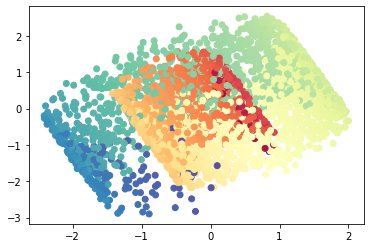

tensor([[0.9998, 0.4509],
        [0.4509, 0.9997]], grad_fn=<DivBackward0>)
Epoch=000, loss=6.2737, time=0.3333
loss before neg tensor(2.7271, grad_fn=<SubBackward0>)
loss after neg tensor(2.1136, grad_fn=<NegBackward0>)
loss corr tensor(1.3716, grad_fn=<MulBackward0>)
loss final tensor(6.2123, grad_fn=<AddBackward0>)
Epoch=001, loss=6.2123, time=0.1629
loss before neg tensor(2.7265, grad_fn=<SubBackward0>)
loss after neg tensor(2.0958, grad_fn=<NegBackward0>)
loss corr tensor(1.3440, grad_fn=<MulBackward0>)
loss final tensor(6.1664, grad_fn=<AddBackward0>)
Epoch=002, loss=6.1664, time=0.1567
loss before neg tensor(2.7260, grad_fn=<SubBackward0>)
loss after neg tensor(2.0852, grad_fn=<NegBackward0>)
loss corr tensor(1.3330, grad_fn=<MulBackward0>)
loss final tensor(6.1442, grad_fn=<AddBackward0>)
Epoch=003, loss=6.1442, time=0.1274
loss before neg tensor(2.7255, grad_fn=<SubBackward0>)
loss after neg tensor(2.0778, grad_fn=<NegBackward0>)
loss corr tensor(1.3364, grad_fn=<MulBackward0

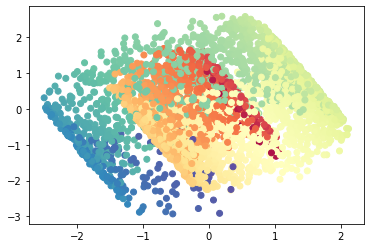

tensor([[0.9998, 0.2627],
        [0.2627, 0.9997]], grad_fn=<DivBackward0>)
Epoch=010, loss=6.1613, time=0.3270
loss before neg tensor(2.7249, grad_fn=<SubBackward0>)
loss after neg tensor(2.0756, grad_fn=<NegBackward0>)
loss corr tensor(1.3531, grad_fn=<MulBackward0>)
loss final tensor(6.1537, grad_fn=<AddBackward0>)
Epoch=011, loss=6.1537, time=0.1417
loss before neg tensor(2.7252, grad_fn=<SubBackward0>)
loss after neg tensor(2.0818, grad_fn=<NegBackward0>)
loss corr tensor(1.3445, grad_fn=<MulBackward0>)
loss final tensor(6.1515, grad_fn=<AddBackward0>)
Epoch=012, loss=6.1515, time=0.1867
loss before neg tensor(2.7254, grad_fn=<SubBackward0>)
loss after neg tensor(2.0860, grad_fn=<NegBackward0>)
loss corr tensor(1.3380, grad_fn=<MulBackward0>)
loss final tensor(6.1494, grad_fn=<AddBackward0>)
Epoch=013, loss=6.1494, time=0.2585
loss before neg tensor(2.7256, grad_fn=<SubBackward0>)
loss after neg tensor(2.0847, grad_fn=<NegBackward0>)
loss corr tensor(1.3342, grad_fn=<MulBackward0

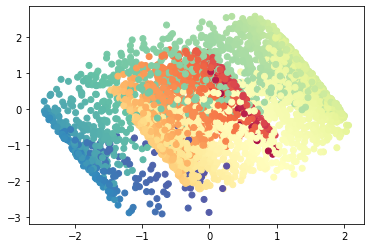

tensor([[0.9997, 0.3484],
        [0.3484, 0.9998]], grad_fn=<DivBackward0>)
Epoch=020, loss=6.1495, time=0.3200
loss before neg tensor(2.7260, grad_fn=<SubBackward0>)
loss after neg tensor(2.0905, grad_fn=<NegBackward0>)
loss corr tensor(1.3333, grad_fn=<MulBackward0>)
loss final tensor(6.1498, grad_fn=<AddBackward0>)
Epoch=021, loss=6.1498, time=0.1546
loss before neg tensor(2.7259, grad_fn=<SubBackward0>)
loss after neg tensor(2.0906, grad_fn=<NegBackward0>)
loss corr tensor(1.3328, grad_fn=<MulBackward0>)
loss final tensor(6.1492, grad_fn=<AddBackward0>)
Epoch=022, loss=6.1492, time=0.1289
loss before neg tensor(2.7258, grad_fn=<SubBackward0>)
loss after neg tensor(2.0878, grad_fn=<NegBackward0>)
loss corr tensor(1.3328, grad_fn=<MulBackward0>)
loss final tensor(6.1463, grad_fn=<AddBackward0>)
Epoch=023, loss=6.1463, time=0.1416
loss before neg tensor(2.7256, grad_fn=<SubBackward0>)
loss after neg tensor(2.0891, grad_fn=<NegBackward0>)
loss corr tensor(1.3336, grad_fn=<MulBackward0

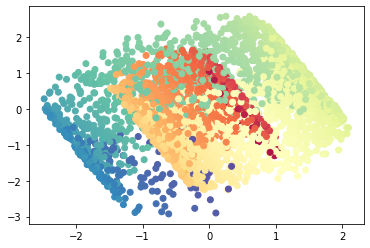

tensor([[0.9997, 0.2939],
        [0.2939, 0.9997]], grad_fn=<DivBackward0>)
Epoch=030, loss=6.1477, time=0.3542
loss before neg tensor(2.7252, grad_fn=<SubBackward0>)
loss after neg tensor(2.0833, grad_fn=<NegBackward0>)
loss corr tensor(1.3411, grad_fn=<MulBackward0>)
loss final tensor(6.1497, grad_fn=<AddBackward0>)
Epoch=031, loss=6.1497, time=0.2100
loss before neg tensor(2.7253, grad_fn=<SubBackward0>)
loss after neg tensor(2.0857, grad_fn=<NegBackward0>)
loss corr tensor(1.3397, grad_fn=<MulBackward0>)
loss final tensor(6.1507, grad_fn=<AddBackward0>)
Epoch=032, loss=6.1507, time=0.1693
loss before neg tensor(2.7253, grad_fn=<SubBackward0>)
loss after neg tensor(2.0858, grad_fn=<NegBackward0>)
loss corr tensor(1.3380, grad_fn=<MulBackward0>)
loss final tensor(6.1491, grad_fn=<AddBackward0>)
Epoch=033, loss=6.1491, time=0.1442
loss before neg tensor(2.7254, grad_fn=<SubBackward0>)
loss after neg tensor(2.0906, grad_fn=<NegBackward0>)
loss corr tensor(1.3364, grad_fn=<MulBackward0

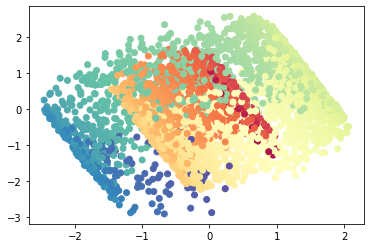

tensor([[0.9997, 0.3271],
        [0.3271, 0.9997]], grad_fn=<DivBackward0>)
Epoch=040, loss=6.1383, time=0.3602
loss before neg tensor(2.7257, grad_fn=<SubBackward0>)
loss after neg tensor(2.0885, grad_fn=<NegBackward0>)
loss corr tensor(1.3330, grad_fn=<MulBackward0>)
loss final tensor(6.1471, grad_fn=<AddBackward0>)
Epoch=041, loss=6.1471, time=0.1919
loss before neg tensor(2.7256, grad_fn=<SubBackward0>)
loss after neg tensor(2.0815, grad_fn=<NegBackward0>)
loss corr tensor(1.3331, grad_fn=<MulBackward0>)
loss final tensor(6.1403, grad_fn=<AddBackward0>)
Epoch=042, loss=6.1403, time=0.1324
loss before neg tensor(2.7256, grad_fn=<SubBackward0>)
loss after neg tensor(2.0883, grad_fn=<NegBackward0>)
loss corr tensor(1.3334, grad_fn=<MulBackward0>)
loss final tensor(6.1473, grad_fn=<AddBackward0>)
Epoch=043, loss=6.1473, time=0.1285
loss before neg tensor(2.7256, grad_fn=<SubBackward0>)
loss after neg tensor(2.0873, grad_fn=<NegBackward0>)
loss corr tensor(1.3339, grad_fn=<MulBackward0

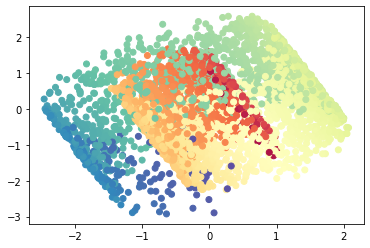

tensor([[0.9997, 0.3071],
        [0.3071, 0.9998]], grad_fn=<DivBackward0>)
Epoch=050, loss=6.1446, time=0.3265
loss before neg tensor(2.7253, grad_fn=<SubBackward0>)
loss after neg tensor(2.0833, grad_fn=<NegBackward0>)
loss corr tensor(1.3366, grad_fn=<MulBackward0>)
loss final tensor(6.1453, grad_fn=<AddBackward0>)
Epoch=051, loss=6.1453, time=0.1408
loss before neg tensor(2.7254, grad_fn=<SubBackward0>)
loss after neg tensor(2.0796, grad_fn=<NegBackward0>)
loss corr tensor(1.3362, grad_fn=<MulBackward0>)
loss final tensor(6.1412, grad_fn=<AddBackward0>)
Epoch=052, loss=6.1412, time=0.1843
loss before neg tensor(2.7254, grad_fn=<SubBackward0>)
loss after neg tensor(2.0807, grad_fn=<NegBackward0>)
loss corr tensor(1.3357, grad_fn=<MulBackward0>)
loss final tensor(6.1417, grad_fn=<AddBackward0>)
Epoch=053, loss=6.1417, time=0.1314
loss before neg tensor(2.7254, grad_fn=<SubBackward0>)
loss after neg tensor(2.0839, grad_fn=<NegBackward0>)
loss corr tensor(1.3352, grad_fn=<MulBackward0

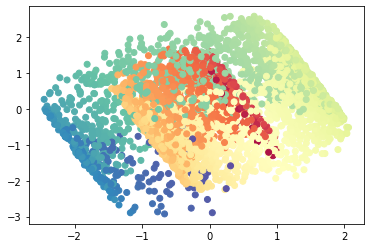

tensor([[0.9997, 0.3194],
        [0.3194, 0.9998]], grad_fn=<DivBackward0>)
Epoch=060, loss=6.1449, time=0.3462
loss before neg tensor(2.7255, grad_fn=<SubBackward0>)
loss after neg tensor(2.0901, grad_fn=<NegBackward0>)
loss corr tensor(1.3339, grad_fn=<MulBackward0>)
loss final tensor(6.1495, grad_fn=<AddBackward0>)
Epoch=061, loss=6.1495, time=0.1373
loss before neg tensor(2.7255, grad_fn=<SubBackward0>)
loss after neg tensor(2.0834, grad_fn=<NegBackward0>)
loss corr tensor(1.3341, grad_fn=<MulBackward0>)
loss final tensor(6.1430, grad_fn=<AddBackward0>)
Epoch=062, loss=6.1430, time=0.1304
loss before neg tensor(2.7254, grad_fn=<SubBackward0>)
loss after neg tensor(2.0893, grad_fn=<NegBackward0>)
loss corr tensor(1.3344, grad_fn=<MulBackward0>)
loss final tensor(6.1491, grad_fn=<AddBackward0>)
Epoch=063, loss=6.1491, time=0.1272
loss before neg tensor(2.7254, grad_fn=<SubBackward0>)
loss after neg tensor(2.0887, grad_fn=<NegBackward0>)
loss corr tensor(1.3347, grad_fn=<MulBackward0

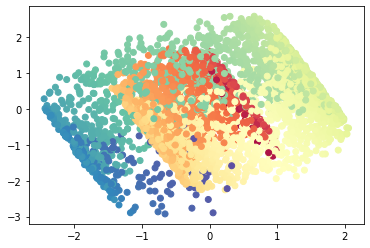

tensor([[0.9998, 0.3122],
        [0.3122, 0.9998]], grad_fn=<DivBackward0>)
Epoch=070, loss=6.1457, time=0.3593
loss before neg tensor(2.7254, grad_fn=<SubBackward0>)
loss after neg tensor(2.0809, grad_fn=<NegBackward0>)
loss corr tensor(1.3351, grad_fn=<MulBackward0>)
loss final tensor(6.1413, grad_fn=<AddBackward0>)
Epoch=071, loss=6.1413, time=0.1564
loss before neg tensor(2.7254, grad_fn=<SubBackward0>)
loss after neg tensor(2.0863, grad_fn=<NegBackward0>)
loss corr tensor(1.3349, grad_fn=<MulBackward0>)
loss final tensor(6.1466, grad_fn=<AddBackward0>)
Epoch=072, loss=6.1466, time=0.1490
loss before neg tensor(2.7254, grad_fn=<SubBackward0>)
loss after neg tensor(2.0864, grad_fn=<NegBackward0>)
loss corr tensor(1.3347, grad_fn=<MulBackward0>)
loss final tensor(6.1464, grad_fn=<AddBackward0>)
Epoch=073, loss=6.1464, time=0.1412
loss before neg tensor(2.7254, grad_fn=<SubBackward0>)
loss after neg tensor(2.0899, grad_fn=<NegBackward0>)
loss corr tensor(1.3345, grad_fn=<MulBackward0

<Figure size 432x288 with 0 Axes>

(array([[  6., 143., 253., 613., 803., 712., 591., 575., 301.,   3.],
        [ 18., 104., 316., 534., 805., 783., 679., 457., 233.,  71.]]),
 array([-2.92477345, -2.37399054, -1.8232075 , -1.27242446, -0.72164148,
        -0.1708585 ,  0.37992448,  0.93070745,  1.48149049,  2.03227353,
         2.58305645]),
 <a list of 2 BarContainer objects>)

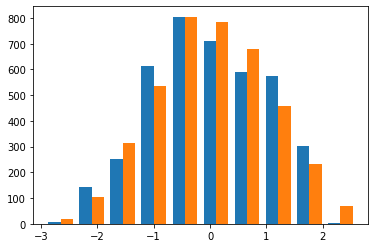

<Figure size 432x288 with 0 Axes>

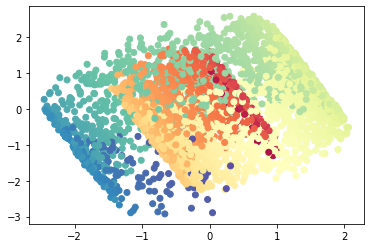

tensor([[0.9998, 0.3182],
        [0.3182, 0.9997]], grad_fn=<DivBackward0>)


In [57]:
#xx = torch.ones((X.shape[0], 10))
# new_data2.x =  new_data.x[:,:2] # leave out z-axis
model2, target_index,_,_  =  train_gnumap(new_data,
                                     target=None, hid_dim=256, dim=2,
                                     n_layers=1, must_propagate= [True, True, True, True, True],
                                     method = 'laplacian', alpha=0.1,
                                     gnn_type='symmetric', repulsion_strength=10.,
                                     norm='standardize', neighbours=15,
                                     beta=1, patience=20, epochs=1000,
                                     #feat_drop_rate = 0.1, edge_mask_rate = 0.5,
                                     lr=1e-2,
                                     wd=1e-4,
                                     lambd_corr=1.,
                                     min_dist=0.001,subsampling=100000)
out = model2(new_data.x.float(), new_data.edge_index)
plt.figure()
plt.hist(out.detach().numpy())
plt.show()
u = out.detach().numpy()
plt.figure()
plt.scatter(u[:,0], u[:,1], c = t,
            cmap="Spectral")
plt.show()
print(torch.mm(out.T, out)/ new_data.num_nodes)

### (c) Laplacian with alpha = 0.9

Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(2.7333, grad_fn=<SubBackward0>)
loss after neg tensor(2.4363, grad_fn=<NegBackward0>)
loss corr tensor(3.2611, grad_fn=<MulBackward0>)
loss final tensor(8.4306, grad_fn=<AddBackward0>)


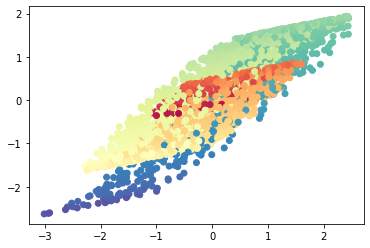

tensor([[0.9997, 0.9002],
        [0.9002, 0.9998]], grad_fn=<DivBackward0>)
Epoch=000, loss=8.4306, time=0.3967
loss before neg tensor(2.7330, grad_fn=<SubBackward0>)
loss after neg tensor(2.4265, grad_fn=<NegBackward0>)
loss corr tensor(3.1925, grad_fn=<MulBackward0>)
loss final tensor(8.3520, grad_fn=<AddBackward0>)
Epoch=001, loss=8.3520, time=0.1548
loss before neg tensor(2.7328, grad_fn=<SubBackward0>)
loss after neg tensor(2.4079, grad_fn=<NegBackward0>)
loss corr tensor(3.1218, grad_fn=<MulBackward0>)
loss final tensor(8.2625, grad_fn=<AddBackward0>)
Epoch=002, loss=8.2625, time=0.1809
loss before neg tensor(2.7325, grad_fn=<SubBackward0>)
loss after neg tensor(2.3966, grad_fn=<NegBackward0>)
loss corr tensor(3.0491, grad_fn=<MulBackward0>)
loss final tensor(8.1783, grad_fn=<AddBackward0>)
Epoch=003, loss=8.1783, time=0.1670
loss before neg tensor(2.7322, grad_fn=<SubBackward0>)
loss after neg tensor(2.3855, grad_fn=<NegBackward0>)
loss corr tensor(2.9749, grad_fn=<MulBackward0

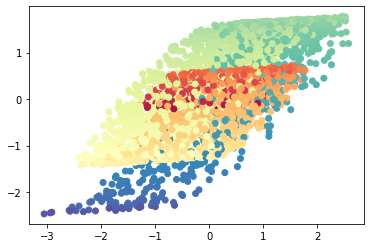

tensor([[0.9998, 0.7760],
        [0.7760, 0.9998]], grad_fn=<DivBackward0>)
Epoch=010, loss=7.5352, time=0.3580
loss before neg tensor(2.7300, grad_fn=<SubBackward0>)
loss after neg tensor(2.2900, grad_fn=<NegBackward0>)
loss corr tensor(2.4305, grad_fn=<MulBackward0>)
loss final tensor(7.4505, grad_fn=<AddBackward0>)
Epoch=011, loss=7.4505, time=0.1542
loss before neg tensor(2.7296, grad_fn=<SubBackward0>)
loss after neg tensor(2.2712, grad_fn=<NegBackward0>)
loss corr tensor(2.3527, grad_fn=<MulBackward0>)
loss final tensor(7.3535, grad_fn=<AddBackward0>)
Epoch=012, loss=7.3535, time=0.1382
loss before neg tensor(2.7293, grad_fn=<SubBackward0>)
loss after neg tensor(2.2587, grad_fn=<NegBackward0>)
loss corr tensor(2.2759, grad_fn=<MulBackward0>)
loss final tensor(7.2639, grad_fn=<AddBackward0>)
Epoch=013, loss=7.2639, time=0.1422
loss before neg tensor(2.7289, grad_fn=<SubBackward0>)
loss after neg tensor(2.2422, grad_fn=<NegBackward0>)
loss corr tensor(2.2004, grad_fn=<MulBackward0

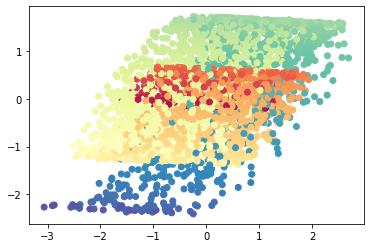

tensor([[0.9998, 0.6101],
        [0.6101, 0.9997]], grad_fn=<DivBackward0>)
Epoch=020, loss=6.7002, time=0.3415
loss before neg tensor(2.7262, grad_fn=<SubBackward0>)
loss after neg tensor(2.1756, grad_fn=<NegBackward0>)
loss corr tensor(1.7351, grad_fn=<MulBackward0>)
loss final tensor(6.6369, grad_fn=<AddBackward0>)
Epoch=021, loss=6.6369, time=0.1553
loss before neg tensor(2.7258, grad_fn=<SubBackward0>)
loss after neg tensor(2.1680, grad_fn=<NegBackward0>)
loss corr tensor(1.6811, grad_fn=<MulBackward0>)
loss final tensor(6.5750, grad_fn=<AddBackward0>)
Epoch=022, loss=6.5750, time=0.1345
loss before neg tensor(2.7254, grad_fn=<SubBackward0>)
loss after neg tensor(2.1532, grad_fn=<NegBackward0>)
loss corr tensor(1.6310, grad_fn=<MulBackward0>)
loss final tensor(6.5096, grad_fn=<AddBackward0>)
Epoch=023, loss=6.5096, time=0.1419
loss before neg tensor(2.7250, grad_fn=<SubBackward0>)
loss after neg tensor(2.1525, grad_fn=<NegBackward0>)
loss corr tensor(1.5848, grad_fn=<MulBackward0

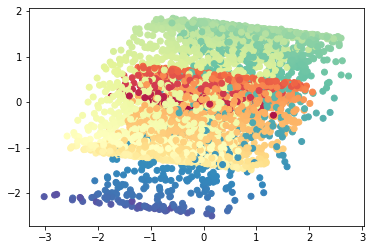

tensor([[0.9998, 0.4343],
        [0.4343, 0.9997]], grad_fn=<DivBackward0>)
Epoch=030, loss=6.2319, time=0.3810
loss before neg tensor(2.7225, grad_fn=<SubBackward0>)
loss after neg tensor(2.1083, grad_fn=<NegBackward0>)
loss corr tensor(1.3759, grad_fn=<MulBackward0>)
loss final tensor(6.2068, grad_fn=<AddBackward0>)
Epoch=031, loss=6.2068, time=0.1661
loss before neg tensor(2.7222, grad_fn=<SubBackward0>)
loss after neg tensor(2.0988, grad_fn=<NegBackward0>)
loss corr tensor(1.3615, grad_fn=<MulBackward0>)
loss final tensor(6.1825, grad_fn=<AddBackward0>)
Epoch=032, loss=6.1825, time=0.1691
loss before neg tensor(2.7219, grad_fn=<SubBackward0>)
loss after neg tensor(2.0939, grad_fn=<NegBackward0>)
loss corr tensor(1.3504, grad_fn=<MulBackward0>)
loss final tensor(6.1662, grad_fn=<AddBackward0>)
Epoch=033, loss=6.1662, time=0.1445
loss before neg tensor(2.7216, grad_fn=<SubBackward0>)
loss after neg tensor(2.0902, grad_fn=<NegBackward0>)
loss corr tensor(1.3423, grad_fn=<MulBackward0

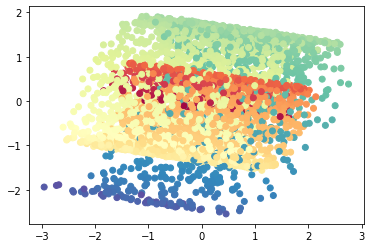

tensor([[0.9997, 0.3036],
        [0.3036, 0.9998]], grad_fn=<DivBackward0>)
Epoch=040, loss=6.1346, time=0.4433
loss before neg tensor(2.7200, grad_fn=<SubBackward0>)
loss after neg tensor(2.0687, grad_fn=<NegBackward0>)
loss corr tensor(1.3414, grad_fn=<MulBackward0>)
loss final tensor(6.1301, grad_fn=<AddBackward0>)
Epoch=041, loss=6.1301, time=0.2209
loss before neg tensor(2.7199, grad_fn=<SubBackward0>)
loss after neg tensor(2.0764, grad_fn=<NegBackward0>)
loss corr tensor(1.3452, grad_fn=<MulBackward0>)
loss final tensor(6.1414, grad_fn=<AddBackward0>)
Epoch=042, loss=6.1414, time=0.2034
loss before neg tensor(2.7197, grad_fn=<SubBackward0>)
loss after neg tensor(2.0683, grad_fn=<NegBackward0>)
loss corr tensor(1.3491, grad_fn=<MulBackward0>)
loss final tensor(6.1371, grad_fn=<AddBackward0>)
Epoch=043, loss=6.1371, time=0.1916
loss before neg tensor(2.7196, grad_fn=<SubBackward0>)
loss after neg tensor(2.0681, grad_fn=<NegBackward0>)
loss corr tensor(1.3528, grad_fn=<MulBackward0

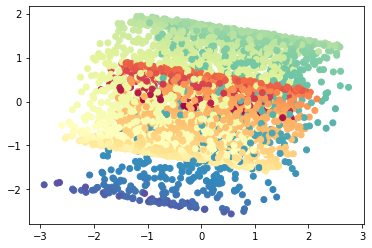

tensor([[0.9998, 0.2597],
        [0.2597, 0.9997]], grad_fn=<DivBackward0>)
Epoch=050, loss=6.1587, time=0.4101
loss before neg tensor(2.7193, grad_fn=<SubBackward0>)
loss after neg tensor(2.0670, grad_fn=<NegBackward0>)
loss corr tensor(1.3650, grad_fn=<MulBackward0>)
loss final tensor(6.1513, grad_fn=<AddBackward0>)
Epoch=051, loss=6.1513, time=0.2000
loss before neg tensor(2.7193, grad_fn=<SubBackward0>)
loss after neg tensor(2.0724, grad_fn=<NegBackward0>)
loss corr tensor(1.3644, grad_fn=<MulBackward0>)
loss final tensor(6.1562, grad_fn=<AddBackward0>)
Epoch=052, loss=6.1562, time=0.2062
loss before neg tensor(2.7194, grad_fn=<SubBackward0>)
loss after neg tensor(2.0687, grad_fn=<NegBackward0>)
loss corr tensor(1.3634, grad_fn=<MulBackward0>)
loss final tensor(6.1515, grad_fn=<AddBackward0>)
Epoch=053, loss=6.1515, time=0.2704
loss before neg tensor(2.7194, grad_fn=<SubBackward0>)
loss after neg tensor(2.0752, grad_fn=<NegBackward0>)
loss corr tensor(1.3619, grad_fn=<MulBackward0

<Figure size 432x288 with 0 Axes>

(array([[ 15., 105., 325., 647., 795., 774., 661., 453., 192.,  33.],
        [ 12.,  97., 299., 839., 564., 797., 648., 572., 172.,   0.]]),
 array([-2.9548173 , -2.38409185, -1.81336665, -1.24264133, -0.67191601,
        -0.10119069,  0.46953464,  1.04025996,  1.61098528,  2.18171072,
         2.75243592]),
 <a list of 2 BarContainer objects>)

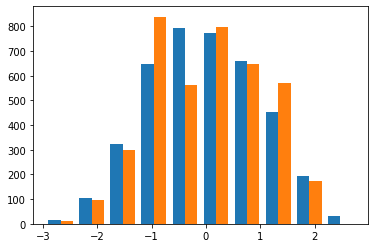

<Figure size 432x288 with 0 Axes>

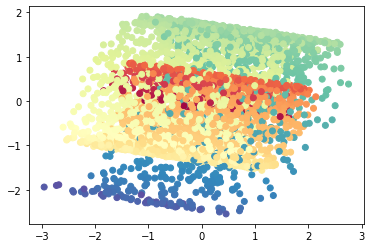

tensor([[0.9997, 0.3036],
        [0.3036, 0.9998]], grad_fn=<DivBackward0>)


In [58]:
#xx = torch.ones((X.shape[0], 10))
# new_data2.x =  new_data.x[:,:2] # leave out z-axis
model3, target_index,_,_  =  train_gnumap(new_data,
                                     target=None, hid_dim=256, dim=2,
                                     n_layers=1, must_propagate= [True, True, True, True, True],
                                     method = 'laplacian', alpha=0.9,
                                     gnn_type='symmetric', repulsion_strength=10.,
                                     norm='standardize', neighbours=15,
                                     beta=1, patience=20, epochs=1000,
                                     lr=1e-2,
                                     wd=1e-4,
                                     lambd_corr=1.,
                                     min_dist=0.001,subsampling=100000)
out = model3(new_data.x.float(), new_data.edge_index)
plt.figure()
plt.hist(out.detach().numpy())
plt.show()
u = out.detach().numpy()
plt.figure()
plt.scatter(u[:,0], u[:,1], c = t,
            cmap="Spectral")
plt.show()
print(torch.mm(out.T, out)/ new_data.num_nodes)

### (d) Heat diffusion N_neighbours = 5

Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(4.0749, grad_fn=<SubBackward0>)
loss after neg tensor(2.0467, grad_fn=<NegBackward0>)
loss corr tensor(1.5787, grad_fn=<MulBackward0>)
loss final tensor(7.7003, grad_fn=<AddBackward0>)


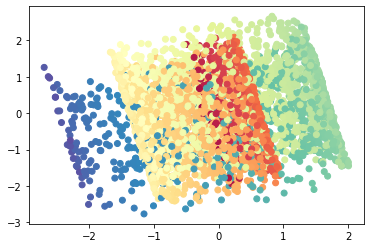

tensor([[0.9997, 0.1308],
        [0.1308, 0.9997]], grad_fn=<DivBackward0>)
Epoch=000, loss=7.7003, time=0.3615
loss before neg tensor(4.0754, grad_fn=<SubBackward0>)
loss after neg tensor(2.0577, grad_fn=<NegBackward0>)
loss corr tensor(1.5174, grad_fn=<MulBackward0>)
loss final tensor(7.6505, grad_fn=<AddBackward0>)
Epoch=001, loss=7.6505, time=0.1350
loss before neg tensor(4.0760, grad_fn=<SubBackward0>)
loss after neg tensor(2.0548, grad_fn=<NegBackward0>)
loss corr tensor(1.4653, grad_fn=<MulBackward0>)
loss final tensor(7.5960, grad_fn=<AddBackward0>)
Epoch=002, loss=7.5960, time=0.1370
loss before neg tensor(4.0765, grad_fn=<SubBackward0>)
loss after neg tensor(2.0552, grad_fn=<NegBackward0>)
loss corr tensor(1.4225, grad_fn=<MulBackward0>)
loss final tensor(7.5542, grad_fn=<AddBackward0>)
Epoch=003, loss=7.5542, time=0.1346
loss before neg tensor(4.0771, grad_fn=<SubBackward0>)
loss after neg tensor(2.0674, grad_fn=<NegBackward0>)
loss corr tensor(1.3888, grad_fn=<MulBackward0

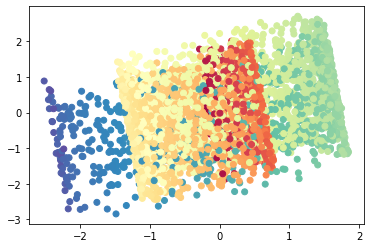

tensor([[0.9998, 0.3539],
        [0.3539, 0.9997]], grad_fn=<DivBackward0>)
Epoch=010, loss=7.5027, time=0.4597
loss before neg tensor(4.0802, grad_fn=<SubBackward0>)
loss after neg tensor(2.0852, grad_fn=<NegBackward0>)
loss corr tensor(1.3383, grad_fn=<MulBackward0>)
loss final tensor(7.5037, grad_fn=<AddBackward0>)
Epoch=011, loss=7.5037, time=0.1878
loss before neg tensor(4.0803, grad_fn=<SubBackward0>)
loss after neg tensor(2.0874, grad_fn=<NegBackward0>)
loss corr tensor(1.3412, grad_fn=<MulBackward0>)
loss final tensor(7.5090, grad_fn=<AddBackward0>)
Epoch=012, loss=7.5090, time=0.1753
loss before neg tensor(4.0804, grad_fn=<SubBackward0>)
loss after neg tensor(2.0961, grad_fn=<NegBackward0>)
loss corr tensor(1.3432, grad_fn=<MulBackward0>)
loss final tensor(7.5197, grad_fn=<AddBackward0>)
Epoch=013, loss=7.5197, time=0.1575
loss before neg tensor(4.0804, grad_fn=<SubBackward0>)
loss after neg tensor(2.0979, grad_fn=<NegBackward0>)
loss corr tensor(1.3438, grad_fn=<MulBackward0

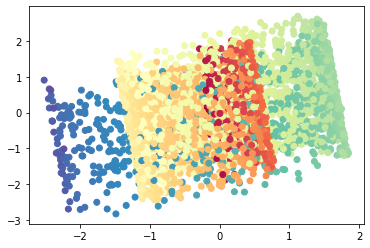

tensor([[0.9998, 0.3458],
        [0.3458, 0.9998]], grad_fn=<DivBackward0>)
Epoch=020, loss=7.4906, time=0.3644
loss before neg tensor(4.0792, grad_fn=<SubBackward0>)
loss after neg tensor(2.0794, grad_fn=<NegBackward0>)
loss corr tensor(1.3328, grad_fn=<MulBackward0>)
loss final tensor(7.4914, grad_fn=<AddBackward0>)
Epoch=021, loss=7.4914, time=0.1522
loss before neg tensor(4.0790, grad_fn=<SubBackward0>)
loss after neg tensor(2.0799, grad_fn=<NegBackward0>)
loss corr tensor(1.3328, grad_fn=<MulBackward0>)
loss final tensor(7.4917, grad_fn=<AddBackward0>)
Epoch=022, loss=7.4917, time=0.1679
loss before neg tensor(4.0788, grad_fn=<SubBackward0>)
loss after neg tensor(2.0723, grad_fn=<NegBackward0>)
loss corr tensor(1.3336, grad_fn=<MulBackward0>)
loss final tensor(7.4847, grad_fn=<AddBackward0>)
Epoch=023, loss=7.4847, time=0.1518
loss before neg tensor(4.0785, grad_fn=<SubBackward0>)
loss after neg tensor(2.0754, grad_fn=<NegBackward0>)
loss corr tensor(1.3351, grad_fn=<MulBackward0

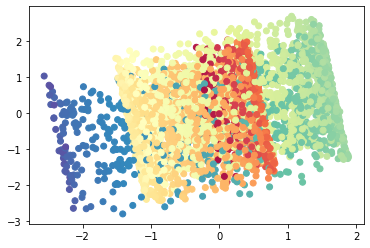

tensor([[0.9998, 0.2873],
        [0.2873, 0.9998]], grad_fn=<DivBackward0>)
Epoch=030, loss=7.4987, time=0.3833
loss before neg tensor(4.0778, grad_fn=<SubBackward0>)
loss after neg tensor(2.0767, grad_fn=<NegBackward0>)
loss corr tensor(1.3454, grad_fn=<MulBackward0>)
loss final tensor(7.4999, grad_fn=<AddBackward0>)
Epoch=031, loss=7.4999, time=0.1889
loss before neg tensor(4.0778, grad_fn=<SubBackward0>)
loss after neg tensor(2.0853, grad_fn=<NegBackward0>)
loss corr tensor(1.3449, grad_fn=<MulBackward0>)
loss final tensor(7.5080, grad_fn=<AddBackward0>)
Epoch=032, loss=7.5080, time=0.1660
loss before neg tensor(4.0778, grad_fn=<SubBackward0>)
loss after neg tensor(2.0782, grad_fn=<NegBackward0>)
loss corr tensor(1.3439, grad_fn=<MulBackward0>)
loss final tensor(7.4999, grad_fn=<AddBackward0>)
Epoch=033, loss=7.4999, time=0.1629
loss before neg tensor(4.0778, grad_fn=<SubBackward0>)
loss after neg tensor(2.0712, grad_fn=<NegBackward0>)
loss corr tensor(1.3426, grad_fn=<MulBackward0

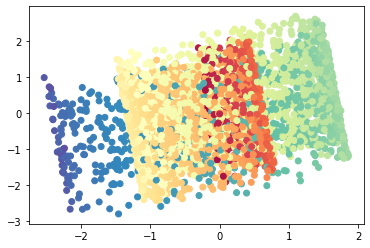

tensor([[0.9998, 0.3151],
        [0.3151, 0.9998]], grad_fn=<DivBackward0>)
Epoch=040, loss=7.4972, time=0.7129
loss before neg tensor(4.0784, grad_fn=<SubBackward0>)
loss after neg tensor(2.0806, grad_fn=<NegBackward0>)
loss corr tensor(1.3340, grad_fn=<MulBackward0>)
loss final tensor(7.4930, grad_fn=<AddBackward0>)
Epoch=041, loss=7.4930, time=0.2660
loss before neg tensor(4.0784, grad_fn=<SubBackward0>)
loss after neg tensor(2.0846, grad_fn=<NegBackward0>)
loss corr tensor(1.3335, grad_fn=<MulBackward0>)
loss final tensor(7.4966, grad_fn=<AddBackward0>)
Epoch=042, loss=7.4966, time=0.2081
loss before neg tensor(4.0785, grad_fn=<SubBackward0>)
loss after neg tensor(2.0860, grad_fn=<NegBackward0>)
loss corr tensor(1.3333, grad_fn=<MulBackward0>)
loss final tensor(7.4977, grad_fn=<AddBackward0>)
Epoch=043, loss=7.4977, time=0.1803
loss before neg tensor(4.0785, grad_fn=<SubBackward0>)
loss after neg tensor(2.0818, grad_fn=<NegBackward0>)
loss corr tensor(1.3331, grad_fn=<MulBackward0

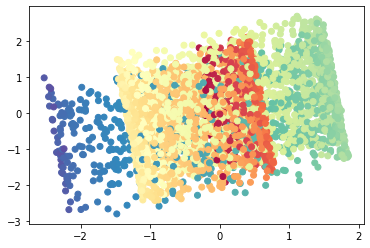

tensor([[0.9998, 0.3226],
        [0.3226, 0.9997]], grad_fn=<DivBackward0>)
Epoch=050, loss=7.4885, time=0.4665
loss before neg tensor(4.0783, grad_fn=<SubBackward0>)
loss after neg tensor(2.0676, grad_fn=<NegBackward0>)
loss corr tensor(1.3336, grad_fn=<MulBackward0>)
loss final tensor(7.4795, grad_fn=<AddBackward0>)
Epoch=051, loss=7.4795, time=0.1823
loss before neg tensor(4.0782, grad_fn=<SubBackward0>)
loss after neg tensor(2.0832, grad_fn=<NegBackward0>)
loss corr tensor(1.3339, grad_fn=<MulBackward0>)
loss final tensor(7.4953, grad_fn=<AddBackward0>)
Epoch=052, loss=7.4953, time=0.1546
loss before neg tensor(4.0781, grad_fn=<SubBackward0>)
loss after neg tensor(2.0815, grad_fn=<NegBackward0>)
loss corr tensor(1.3343, grad_fn=<MulBackward0>)
loss final tensor(7.4939, grad_fn=<AddBackward0>)
Epoch=053, loss=7.4939, time=0.1568
loss before neg tensor(4.0781, grad_fn=<SubBackward0>)
loss after neg tensor(2.0742, grad_fn=<NegBackward0>)
loss corr tensor(1.3347, grad_fn=<MulBackward0

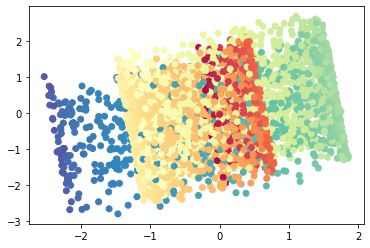

tensor([[0.9998, 0.3080],
        [0.3080, 0.9997]], grad_fn=<DivBackward0>)
Epoch=060, loss=7.4906, time=0.3679
loss before neg tensor(4.0778, grad_fn=<SubBackward0>)
loss after neg tensor(2.0717, grad_fn=<NegBackward0>)
loss corr tensor(1.3365, grad_fn=<MulBackward0>)
loss final tensor(7.4860, grad_fn=<AddBackward0>)
Epoch=061, loss=7.4860, time=0.1433
loss before neg tensor(4.0778, grad_fn=<SubBackward0>)
loss after neg tensor(2.0691, grad_fn=<NegBackward0>)
loss corr tensor(1.3364, grad_fn=<MulBackward0>)
loss final tensor(7.4833, grad_fn=<AddBackward0>)
Epoch=062, loss=7.4833, time=0.1464
loss before neg tensor(4.0778, grad_fn=<SubBackward0>)
loss after neg tensor(2.0805, grad_fn=<NegBackward0>)
loss corr tensor(1.3363, grad_fn=<MulBackward0>)
loss final tensor(7.4945, grad_fn=<AddBackward0>)
Epoch=063, loss=7.4945, time=0.1415
loss before neg tensor(4.0778, grad_fn=<SubBackward0>)
loss after neg tensor(2.0747, grad_fn=<NegBackward0>)
loss corr tensor(1.3361, grad_fn=<MulBackward0

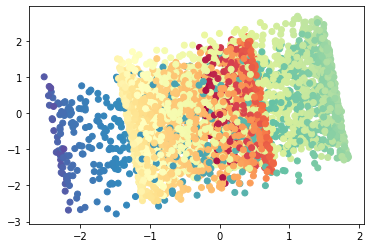

tensor([[0.9997, 0.3151],
        [0.3151, 0.9997]], grad_fn=<DivBackward0>)
Epoch=070, loss=7.4907, time=0.3579
loss before neg tensor(4.0778, grad_fn=<SubBackward0>)
loss after neg tensor(2.0849, grad_fn=<NegBackward0>)
loss corr tensor(1.3345, grad_fn=<MulBackward0>)
loss final tensor(7.4972, grad_fn=<AddBackward0>)
Epoch=071, loss=7.4972, time=0.2264
Early stopping at epoch 71!
Loading 51th epoch


<Figure size 432x288 with 0 Axes>

(array([[ 31.,  76., 510., 703., 531., 792., 596., 537., 224.,   0.],
        [ 28., 131., 363., 651., 737., 799., 645., 416., 178.,  52.]]),
 array([-2.8033824 , -2.25457597, -1.7057693 , -1.15696287, -0.60815632,
        -0.05934978,  0.48945674,  1.03826332,  1.58706975,  2.13587642,
         2.68468285]),
 <a list of 2 BarContainer objects>)

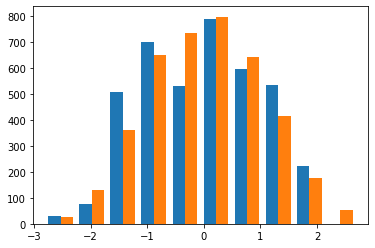

<Figure size 432x288 with 0 Axes>

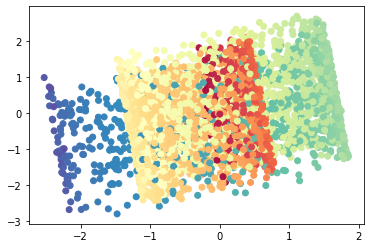

tensor([[0.9997, 0.3189],
        [0.3189, 0.9998]], grad_fn=<DivBackward0>)


In [59]:
#xx = torch.ones((X.shape[0], 10))
# new_data2.x =  new_data.x[:,:2] # leave out z-axis
model4, target_index,_,_  =  train_gnumap(new_data,
                                     target=None, hid_dim=256, dim=2,
                                     n_layers=1, must_propagate= [True, True, True, True, True],
                                     method = 'laplacian', alpha=0.5,
                                     gnn_type='symmetric', repulsion_strength=10.,
                                     norm='standardize', neighbours=5,
                                     beta=1, patience=20, epochs=1000,
                                     lr=1e-2,
                                     wd=1e-4,
                                     lambd_corr=1.,
                                     min_dist=0.001,subsampling=100000)
out = model4(new_data.x.float(), new_data.edge_index)
plt.figure()
plt.hist(out.detach().numpy())
plt.show()
u = out.detach().numpy()
plt.figure()
plt.scatter(u[:,0], u[:,1], c = t,
            cmap="Spectral")
plt.show()
print(torch.mm(out.T, out)/ new_data.num_nodes)

### (e) Heat diffusion with n_neighbours = 20

Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(2.3395, grad_fn=<SubBackward0>)
loss after neg tensor(2.0686, grad_fn=<NegBackward0>)
loss corr tensor(1.4525, grad_fn=<MulBackward0>)
loss final tensor(5.8606, grad_fn=<AddBackward0>)


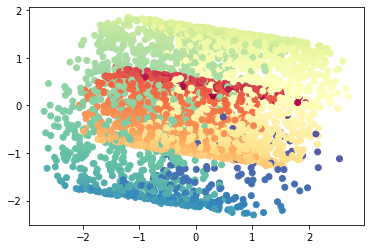

tensor([[0.9998, 0.1920],
        [0.1920, 0.9997]], grad_fn=<DivBackward0>)
Epoch=000, loss=5.8606, time=0.3409
loss before neg tensor(2.3397, grad_fn=<SubBackward0>)
loss after neg tensor(2.0691, grad_fn=<NegBackward0>)
loss corr tensor(1.4157, grad_fn=<MulBackward0>)
loss final tensor(5.8245, grad_fn=<AddBackward0>)
Epoch=001, loss=5.8245, time=0.1366
loss before neg tensor(2.3399, grad_fn=<SubBackward0>)
loss after neg tensor(2.0675, grad_fn=<NegBackward0>)
loss corr tensor(1.3859, grad_fn=<MulBackward0>)
loss final tensor(5.7934, grad_fn=<AddBackward0>)
Epoch=002, loss=5.7934, time=0.1520
loss before neg tensor(2.3402, grad_fn=<SubBackward0>)
loss after neg tensor(2.0776, grad_fn=<NegBackward0>)
loss corr tensor(1.3632, grad_fn=<MulBackward0>)
loss final tensor(5.7809, grad_fn=<AddBackward0>)
Epoch=003, loss=5.7809, time=0.1546
loss before neg tensor(2.3404, grad_fn=<SubBackward0>)
loss after neg tensor(2.0818, grad_fn=<NegBackward0>)
loss corr tensor(1.3474, grad_fn=<MulBackward0

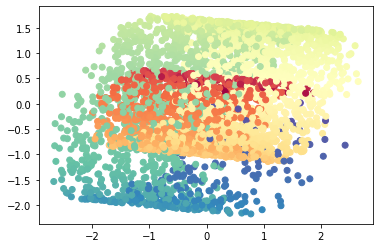

tensor([[0.9998, 0.3633],
        [0.3633, 0.9998]], grad_fn=<DivBackward0>)
Epoch=010, loss=5.7791, time=0.3980
loss before neg tensor(2.3412, grad_fn=<SubBackward0>)
loss after neg tensor(2.0939, grad_fn=<NegBackward0>)
loss corr tensor(1.3387, grad_fn=<MulBackward0>)
loss final tensor(5.7738, grad_fn=<AddBackward0>)
Epoch=011, loss=5.7738, time=0.1664
loss before neg tensor(2.3412, grad_fn=<SubBackward0>)
loss after neg tensor(2.0925, grad_fn=<NegBackward0>)
loss corr tensor(1.3383, grad_fn=<MulBackward0>)
loss final tensor(5.7719, grad_fn=<AddBackward0>)
Epoch=012, loss=5.7719, time=0.1593
loss before neg tensor(2.3411, grad_fn=<SubBackward0>)
loss after neg tensor(2.0993, grad_fn=<NegBackward0>)
loss corr tensor(1.3371, grad_fn=<MulBackward0>)
loss final tensor(5.7775, grad_fn=<AddBackward0>)
Epoch=013, loss=5.7775, time=0.1674
loss before neg tensor(2.3411, grad_fn=<SubBackward0>)
loss after neg tensor(2.0957, grad_fn=<NegBackward0>)
loss corr tensor(1.3355, grad_fn=<MulBackward0

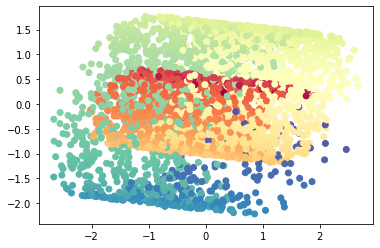

tensor([[0.9997, 0.3093],
        [0.3093, 0.9997]], grad_fn=<DivBackward0>)
Epoch=020, loss=5.7534, time=0.6646
loss before neg tensor(2.3405, grad_fn=<SubBackward0>)
loss after neg tensor(2.0766, grad_fn=<NegBackward0>)
loss corr tensor(1.3381, grad_fn=<MulBackward0>)
loss final tensor(5.7552, grad_fn=<AddBackward0>)
Epoch=021, loss=5.7552, time=0.1945
loss before neg tensor(2.3405, grad_fn=<SubBackward0>)
loss after neg tensor(2.0824, grad_fn=<NegBackward0>)
loss corr tensor(1.3401, grad_fn=<MulBackward0>)
loss final tensor(5.7630, grad_fn=<AddBackward0>)
Epoch=022, loss=5.7630, time=0.2859
loss before neg tensor(2.3404, grad_fn=<SubBackward0>)
loss after neg tensor(2.0769, grad_fn=<NegBackward0>)
loss corr tensor(1.3416, grad_fn=<MulBackward0>)
loss final tensor(5.7590, grad_fn=<AddBackward0>)
Epoch=023, loss=5.7590, time=0.1702
loss before neg tensor(2.3404, grad_fn=<SubBackward0>)
loss after neg tensor(2.0748, grad_fn=<NegBackward0>)
loss corr tensor(1.3426, grad_fn=<MulBackward0

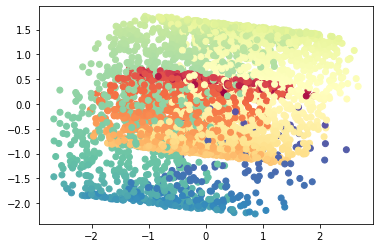

tensor([[0.9998, 0.3049],
        [0.3049, 0.9998]], grad_fn=<DivBackward0>)
Epoch=030, loss=5.7668, time=0.4455
loss before neg tensor(2.3405, grad_fn=<SubBackward0>)
loss after neg tensor(2.0900, grad_fn=<NegBackward0>)
loss corr tensor(1.3361, grad_fn=<MulBackward0>)
loss final tensor(5.7667, grad_fn=<AddBackward0>)
Epoch=031, loss=5.7667, time=0.1556
loss before neg tensor(2.3406, grad_fn=<SubBackward0>)
loss after neg tensor(2.0777, grad_fn=<NegBackward0>)
loss corr tensor(1.3350, grad_fn=<MulBackward0>)
loss final tensor(5.7533, grad_fn=<AddBackward0>)
Epoch=032, loss=5.7533, time=0.1568
loss before neg tensor(2.3406, grad_fn=<SubBackward0>)
loss after neg tensor(2.0927, grad_fn=<NegBackward0>)
loss corr tensor(1.3341, grad_fn=<MulBackward0>)
loss final tensor(5.7675, grad_fn=<AddBackward0>)
Epoch=033, loss=5.7675, time=0.1370
loss before neg tensor(2.3407, grad_fn=<SubBackward0>)
loss after neg tensor(2.0886, grad_fn=<NegBackward0>)
loss corr tensor(1.3335, grad_fn=<MulBackward0

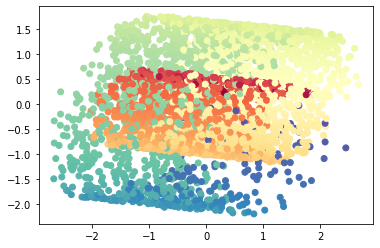

tensor([[0.9997, 0.3269],
        [0.3269, 0.9998]], grad_fn=<DivBackward0>)
Epoch=040, loss=5.7499, time=0.4025
loss before neg tensor(2.3407, grad_fn=<SubBackward0>)
loss after neg tensor(2.0909, grad_fn=<NegBackward0>)
loss corr tensor(1.3330, grad_fn=<MulBackward0>)
loss final tensor(5.7646, grad_fn=<AddBackward0>)
Epoch=041, loss=5.7646, time=0.1625
loss before neg tensor(2.3406, grad_fn=<SubBackward0>)
loss after neg tensor(2.0936, grad_fn=<NegBackward0>)
loss corr tensor(1.3332, grad_fn=<MulBackward0>)
loss final tensor(5.7675, grad_fn=<AddBackward0>)
Epoch=042, loss=5.7675, time=0.1620
loss before neg tensor(2.3406, grad_fn=<SubBackward0>)
loss after neg tensor(2.0802, grad_fn=<NegBackward0>)
loss corr tensor(1.3335, grad_fn=<MulBackward0>)
loss final tensor(5.7544, grad_fn=<AddBackward0>)
Epoch=043, loss=5.7544, time=0.1391
loss before neg tensor(2.3406, grad_fn=<SubBackward0>)
loss after neg tensor(2.0831, grad_fn=<NegBackward0>)
loss corr tensor(1.3339, grad_fn=<MulBackward0

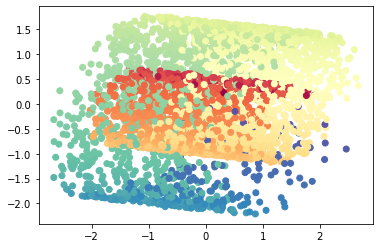

tensor([[0.9997, 0.3091],
        [0.3091, 0.9997]], grad_fn=<DivBackward0>)
Epoch=050, loss=5.7542, time=0.4042
loss before neg tensor(2.3405, grad_fn=<SubBackward0>)
loss after neg tensor(2.0786, grad_fn=<NegBackward0>)
loss corr tensor(1.3362, grad_fn=<MulBackward0>)
loss final tensor(5.7553, grad_fn=<AddBackward0>)
Epoch=051, loss=5.7553, time=0.1391
loss before neg tensor(2.3405, grad_fn=<SubBackward0>)
loss after neg tensor(2.0820, grad_fn=<NegBackward0>)
loss corr tensor(1.3361, grad_fn=<MulBackward0>)
loss final tensor(5.7585, grad_fn=<AddBackward0>)
Epoch=052, loss=5.7585, time=0.1530
loss before neg tensor(2.3405, grad_fn=<SubBackward0>)
loss after neg tensor(2.0874, grad_fn=<NegBackward0>)
loss corr tensor(1.3358, grad_fn=<MulBackward0>)
loss final tensor(5.7637, grad_fn=<AddBackward0>)
Epoch=053, loss=5.7637, time=0.1662
loss before neg tensor(2.3405, grad_fn=<SubBackward0>)
loss after neg tensor(2.0892, grad_fn=<NegBackward0>)
loss corr tensor(1.3355, grad_fn=<MulBackward0

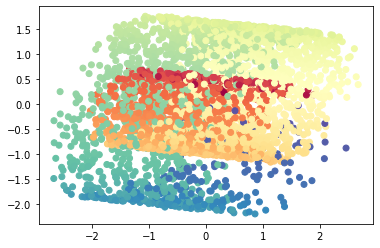

tensor([[0.9997, 0.3187],
        [0.3187, 0.9998]], grad_fn=<DivBackward0>)
Epoch=060, loss=5.7622, time=0.4277
Early stopping at epoch 60!
Loading 40th epoch


<Figure size 432x288 with 0 Axes>

(array([[ 55., 152., 396., 649., 771., 742., 631., 359., 200.,  45.],
        [  5., 271., 183., 948., 610., 705., 464., 722.,  92.,   0.]]),
 array([-2.66924143e+00, -2.13547516e+00, -1.60170889e+00, -1.06794262e+00,
        -5.34176350e-01, -4.10079956e-04,  5.33356190e-01,  1.06712246e+00,
         1.60088873e+00,  2.13465500e+00,  2.66842127e+00]),
 <a list of 2 BarContainer objects>)

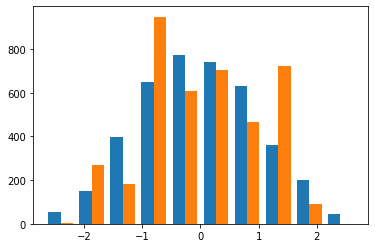

<Figure size 432x288 with 0 Axes>

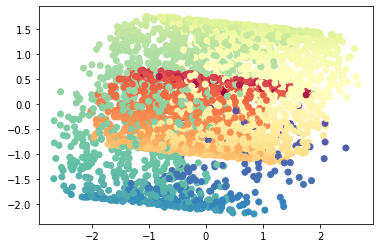

tensor([[0.9998, 0.3254],
        [0.3254, 0.9997]], grad_fn=<DivBackward0>)


In [60]:
#xx = torch.ones((X.shape[0], 10))
# new_data2.x =  new_data.x[:,:2] # leave out z-axis
model5, target_index,_,_  =  train_gnumap(new_data,
                                     target=None, hid_dim=256, dim=2,
                                     n_layers=1, must_propagate= [True, True, True, True, True],
                                     method = 'laplacian', alpha=0.5,
                                     gnn_type='symmetric', repulsion_strength=10.,
                                     norm='standardize', neighbours=20,
                                     beta=1, patience=20, epochs=1000,
                                     lr=1e-2,
                                     wd=1e-4,
                                     lambd_corr=1.,
                                     min_dist=0.001,subsampling=100000)
out = model5(new_data.x.float(), new_data.edge_index)
plt.figure()
plt.hist(out.detach().numpy())
plt.show()
u = out.detach().numpy()
plt.figure()
plt.scatter(u[:,0], u[:,1], c = t,
            cmap="Spectral")
plt.show()
print(torch.mm(out.T, out)/ new_data.num_nodes)

### (f) power = 3

Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(4.8854, grad_fn=<SubBackward0>)
loss after neg tensor(2.0439, grad_fn=<NegBackward0>)
loss corr tensor(3.5894, grad_fn=<MulBackward0>)
loss final tensor(10.5187, grad_fn=<AddBackward0>)


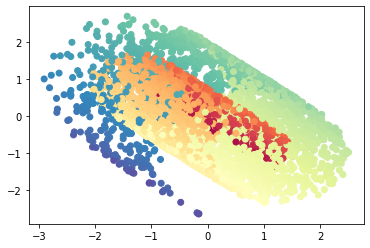

tensor([[ 0.9997, -0.2800],
        [-0.2800,  0.9997]], grad_fn=<DivBackward0>)
Epoch=000, loss=10.5187, time=0.4859
loss before neg tensor(4.8891, grad_fn=<SubBackward0>)
loss after neg tensor(2.0499, grad_fn=<NegBackward0>)
loss corr tensor(3.3393, grad_fn=<MulBackward0>)
loss final tensor(10.2783, grad_fn=<AddBackward0>)
Epoch=001, loss=10.2783, time=0.1937
loss before neg tensor(4.8927, grad_fn=<SubBackward0>)
loss after neg tensor(2.0461, grad_fn=<NegBackward0>)
loss corr tensor(3.1055, grad_fn=<MulBackward0>)
loss final tensor(10.0443, grad_fn=<AddBackward0>)
Epoch=002, loss=10.0443, time=0.2031
loss before neg tensor(4.8963, grad_fn=<SubBackward0>)
loss after neg tensor(2.0318, grad_fn=<NegBackward0>)
loss corr tensor(2.8887, grad_fn=<MulBackward0>)
loss final tensor(9.8168, grad_fn=<AddBackward0>)
Epoch=003, loss=9.8168, time=0.2020
loss before neg tensor(4.8997, grad_fn=<SubBackward0>)
loss after neg tensor(2.0404, grad_fn=<NegBackward0>)
loss corr tensor(2.6886, grad_fn=<Mul

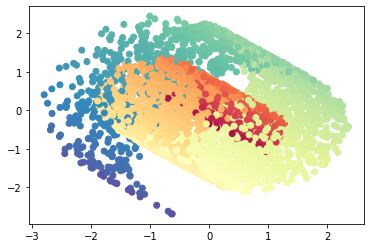

tensor([[0.9997, 0.0543],
        [0.0543, 0.9997]], grad_fn=<DivBackward0>)
Epoch=010, loss=8.7402, time=0.4627
loss before neg tensor(4.9192, grad_fn=<SubBackward0>)
loss after neg tensor(2.0325, grad_fn=<NegBackward0>)
loss corr tensor(1.6993, grad_fn=<MulBackward0>)
loss final tensor(8.6510, grad_fn=<AddBackward0>)
Epoch=011, loss=8.6510, time=0.3123
loss before neg tensor(4.9216, grad_fn=<SubBackward0>)
loss after neg tensor(2.0240, grad_fn=<NegBackward0>)
loss corr tensor(1.6127, grad_fn=<MulBackward0>)
loss final tensor(8.5583, grad_fn=<AddBackward0>)
Epoch=012, loss=8.5583, time=0.1859
loss before neg tensor(4.9239, grad_fn=<SubBackward0>)
loss after neg tensor(2.0384, grad_fn=<NegBackward0>)
loss corr tensor(1.5391, grad_fn=<MulBackward0>)
loss final tensor(8.5014, grad_fn=<AddBackward0>)
Epoch=013, loss=8.5014, time=0.1872
loss before neg tensor(4.9261, grad_fn=<SubBackward0>)
loss after neg tensor(2.0320, grad_fn=<NegBackward0>)
loss corr tensor(1.4783, grad_fn=<MulBackward0

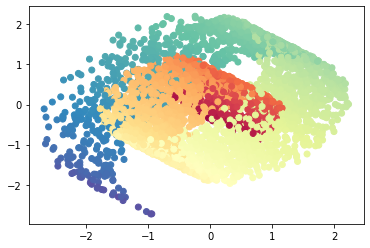

tensor([[0.9998, 0.3293],
        [0.3293, 0.9997]], grad_fn=<DivBackward0>)
Epoch=020, loss=8.3259, time=0.3863
loss before neg tensor(4.9385, grad_fn=<SubBackward0>)
loss after neg tensor(2.0714, grad_fn=<NegBackward0>)
loss corr tensor(1.3340, grad_fn=<MulBackward0>)
loss final tensor(8.3439, grad_fn=<AddBackward0>)
Epoch=021, loss=8.3439, time=0.1783
loss before neg tensor(4.9397, grad_fn=<SubBackward0>)
loss after neg tensor(2.0793, grad_fn=<NegBackward0>)
loss corr tensor(1.3386, grad_fn=<MulBackward0>)
loss final tensor(8.3576, grad_fn=<AddBackward0>)
Epoch=022, loss=8.3576, time=0.2549
loss before neg tensor(4.9407, grad_fn=<SubBackward0>)
loss after neg tensor(2.0680, grad_fn=<NegBackward0>)
loss corr tensor(1.3450, grad_fn=<MulBackward0>)
loss final tensor(8.3538, grad_fn=<AddBackward0>)
Epoch=023, loss=8.3538, time=0.1979
loss before neg tensor(4.9416, grad_fn=<SubBackward0>)
loss after neg tensor(2.0818, grad_fn=<NegBackward0>)
loss corr tensor(1.3519, grad_fn=<MulBackward0

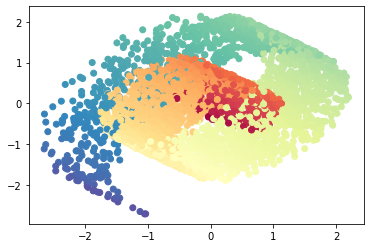

tensor([[0.9998, 0.4054],
        [0.4054, 0.9998]], grad_fn=<DivBackward0>)
Epoch=030, loss=8.3784, time=0.4210
loss before neg tensor(4.9435, grad_fn=<SubBackward0>)
loss after neg tensor(2.0775, grad_fn=<NegBackward0>)
loss corr tensor(1.3605, grad_fn=<MulBackward0>)
loss final tensor(8.3814, grad_fn=<AddBackward0>)
Epoch=031, loss=8.3814, time=0.1864
loss before neg tensor(4.9433, grad_fn=<SubBackward0>)
loss after neg tensor(2.0870, grad_fn=<NegBackward0>)
loss corr tensor(1.3563, grad_fn=<MulBackward0>)
loss final tensor(8.3866, grad_fn=<AddBackward0>)
Epoch=032, loss=8.3866, time=0.1892
loss before neg tensor(4.9430, grad_fn=<SubBackward0>)
loss after neg tensor(2.0786, grad_fn=<NegBackward0>)
loss corr tensor(1.3518, grad_fn=<MulBackward0>)
loss final tensor(8.3734, grad_fn=<AddBackward0>)
Epoch=033, loss=8.3734, time=0.1720
loss before neg tensor(4.9426, grad_fn=<SubBackward0>)
loss after neg tensor(2.0699, grad_fn=<NegBackward0>)
loss corr tensor(1.3474, grad_fn=<MulBackward0

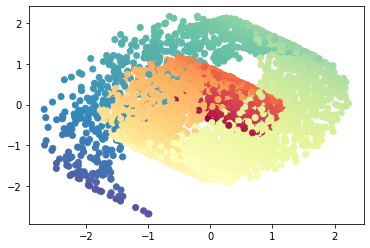

tensor([[0.9998, 0.3356],
        [0.3356, 0.9998]], grad_fn=<DivBackward0>)
Epoch=040, loss=8.3351, time=0.3773
loss before neg tensor(4.9395, grad_fn=<SubBackward0>)
loss after neg tensor(2.0580, grad_fn=<NegBackward0>)
loss corr tensor(1.3328, grad_fn=<MulBackward0>)
loss final tensor(8.3303, grad_fn=<AddBackward0>)
Epoch=041, loss=8.3303, time=0.1925
loss before neg tensor(4.9390, grad_fn=<SubBackward0>)
loss after neg tensor(2.0551, grad_fn=<NegBackward0>)
loss corr tensor(1.3335, grad_fn=<MulBackward0>)
loss final tensor(8.3277, grad_fn=<AddBackward0>)
Epoch=042, loss=8.3277, time=0.1827
loss before neg tensor(4.9386, grad_fn=<SubBackward0>)
loss after neg tensor(2.0621, grad_fn=<NegBackward0>)
loss corr tensor(1.3347, grad_fn=<MulBackward0>)
loss final tensor(8.3354, grad_fn=<AddBackward0>)
Epoch=043, loss=8.3354, time=0.1831
loss before neg tensor(4.9382, grad_fn=<SubBackward0>)
loss after neg tensor(2.0607, grad_fn=<NegBackward0>)
loss corr tensor(1.3361, grad_fn=<MulBackward0

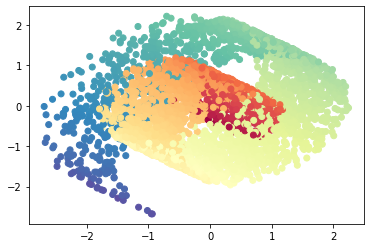

tensor([[0.9997, 0.2871],
        [0.2871, 0.9997]], grad_fn=<DivBackward0>)
Epoch=050, loss=8.3345, time=0.3782
loss before neg tensor(4.9361, grad_fn=<SubBackward0>)
loss after neg tensor(2.0480, grad_fn=<NegBackward0>)
loss corr tensor(1.3463, grad_fn=<MulBackward0>)
loss final tensor(8.3304, grad_fn=<AddBackward0>)
Epoch=051, loss=8.3304, time=0.2034
loss before neg tensor(4.9359, grad_fn=<SubBackward0>)
loss after neg tensor(2.0494, grad_fn=<NegBackward0>)
loss corr tensor(1.3469, grad_fn=<MulBackward0>)
loss final tensor(8.3321, grad_fn=<AddBackward0>)
Epoch=052, loss=8.3321, time=0.2231
loss before neg tensor(4.9357, grad_fn=<SubBackward0>)
loss after neg tensor(2.0453, grad_fn=<NegBackward0>)
loss corr tensor(1.3471, grad_fn=<MulBackward0>)
loss final tensor(8.3281, grad_fn=<AddBackward0>)
Epoch=053, loss=8.3281, time=0.1841
loss before neg tensor(4.9356, grad_fn=<SubBackward0>)
loss after neg tensor(2.0556, grad_fn=<NegBackward0>)
loss corr tensor(1.3471, grad_fn=<MulBackward0

<Figure size 432x288 with 0 Axes>

(array([[ 37., 120., 304., 599., 631., 646., 610., 561., 374., 118.],
        [  9.,  64., 484., 592., 509., 649., 748., 407., 369., 169.]]),
 array([-2.68920684, -2.19803858, -1.7068702 , -1.21570194, -0.72453362,
        -0.2333653 ,  0.25780302,  0.74897134,  1.2401396 ,  1.73130798,
         2.22247624]),
 <a list of 2 BarContainer objects>)

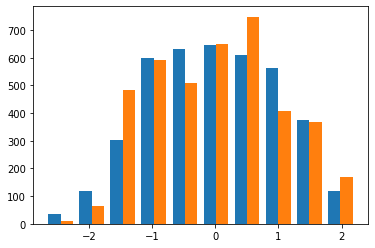

<Figure size 432x288 with 0 Axes>

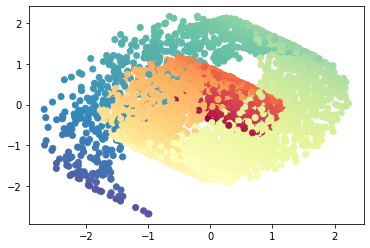

tensor([[0.9998, 0.3356],
        [0.3356, 0.9998]], grad_fn=<DivBackward0>)


In [61]:
#xx = torch.ones((X.shape[0], 10))
# new_data2.x =  new_data.x[:,:2] # leave out z-axis
model6, target_index,_,_  =  train_gnumap(new_data,
                                     target=None, hid_dim=256, dim=2,
                                     n_layers=1, must_propagate= [True, True, True, True, True],
                                     method = 'power', alpha=0.5,
                                     gnn_type='symmetric', repulsion_strength=10.,
                                     norm='standardize', neighbours=15,
                                     beta=1, patience=20, epochs=1000,
                                     lr=1e-2,
                                     wd=1e-4,
                                     lambd_corr=1.,
                                     min_dist=0.001,subsampling=100000)
out = model6(new_data.x.float(), new_data.edge_index)
plt.figure()
plt.hist(out.detach().numpy())
plt.show()
u = out.detach().numpy()
plt.figure()
plt.scatter(u[:,0], u[:,1], c = t,
            cmap="Spectral")
plt.show()
print(torch.mm(out.T, out)/ new_data.num_nodes)

### (g) power = 5

Epsilon is 1e-29
Hyperparameters a = 1.929073396421303 and b = 0.7915045335007013
loss before neg tensor(5.2034, grad_fn=<SubBackward0>)
loss after neg tensor(2.0021, grad_fn=<NegBackward0>)
loss corr tensor(1.7761, grad_fn=<MulBackward0>)
loss final tensor(8.9817, grad_fn=<AddBackward0>)


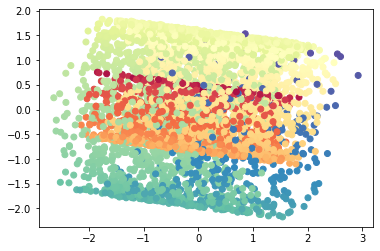

tensor([[0.9997, 0.0614],
        [0.0614, 0.9998]], grad_fn=<DivBackward0>)
Epoch=000, loss=8.9817, time=0.5085
loss before neg tensor(5.2044, grad_fn=<SubBackward0>)
loss after neg tensor(2.0029, grad_fn=<NegBackward0>)
loss corr tensor(1.6812, grad_fn=<MulBackward0>)
loss final tensor(8.8885, grad_fn=<AddBackward0>)
Epoch=001, loss=8.8885, time=0.1827
loss before neg tensor(5.2056, grad_fn=<SubBackward0>)
loss after neg tensor(2.0071, grad_fn=<NegBackward0>)
loss corr tensor(1.5980, grad_fn=<MulBackward0>)
loss final tensor(8.8107, grad_fn=<AddBackward0>)
Epoch=002, loss=8.8107, time=0.1814
loss before neg tensor(5.2069, grad_fn=<SubBackward0>)
loss after neg tensor(2.0040, grad_fn=<NegBackward0>)
loss corr tensor(1.5269, grad_fn=<MulBackward0>)
loss final tensor(8.7378, grad_fn=<AddBackward0>)
Epoch=003, loss=8.7378, time=0.1893
loss before neg tensor(5.2084, grad_fn=<SubBackward0>)
loss after neg tensor(2.0079, grad_fn=<NegBackward0>)
loss corr tensor(1.4679, grad_fn=<MulBackward0

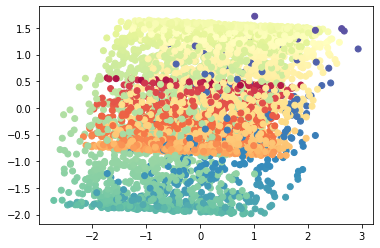

tensor([[0.9998, 0.3318],
        [0.3318, 0.9998]], grad_fn=<DivBackward0>)
Epoch=010, loss=8.5806, time=0.4626
loss before neg tensor(5.2194, grad_fn=<SubBackward0>)
loss after neg tensor(2.0367, grad_fn=<NegBackward0>)
loss corr tensor(1.3340, grad_fn=<MulBackward0>)
loss final tensor(8.5900, grad_fn=<AddBackward0>)
Epoch=011, loss=8.5900, time=0.2040
loss before neg tensor(5.2201, grad_fn=<SubBackward0>)
loss after neg tensor(2.0397, grad_fn=<NegBackward0>)
loss corr tensor(1.3372, grad_fn=<MulBackward0>)
loss final tensor(8.5970, grad_fn=<AddBackward0>)
Epoch=012, loss=8.5970, time=0.2003
loss before neg tensor(5.2203, grad_fn=<SubBackward0>)
loss after neg tensor(2.0387, grad_fn=<NegBackward0>)
loss corr tensor(1.3410, grad_fn=<MulBackward0>)
loss final tensor(8.6000, grad_fn=<AddBackward0>)
Epoch=013, loss=8.6000, time=0.2299
loss before neg tensor(5.2202, grad_fn=<SubBackward0>)
loss after neg tensor(2.0437, grad_fn=<NegBackward0>)
loss corr tensor(1.3441, grad_fn=<MulBackward0

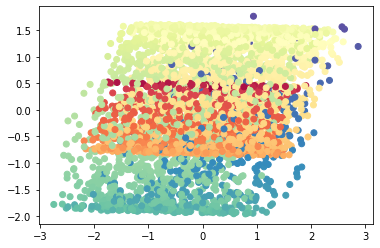

tensor([[0.9998, 0.3651],
        [0.3651, 0.9998]], grad_fn=<DivBackward0>)
Epoch=020, loss=8.5956, time=0.4503
loss before neg tensor(5.2110, grad_fn=<SubBackward0>)
loss after neg tensor(2.0354, grad_fn=<NegBackward0>)
loss corr tensor(1.3363, grad_fn=<MulBackward0>)
loss final tensor(8.5827, grad_fn=<AddBackward0>)
Epoch=021, loss=8.5827, time=0.1758
loss before neg tensor(5.2092, grad_fn=<SubBackward0>)
loss after neg tensor(2.0426, grad_fn=<NegBackward0>)
loss corr tensor(1.3343, grad_fn=<MulBackward0>)
loss final tensor(8.5861, grad_fn=<AddBackward0>)
Epoch=022, loss=8.5861, time=0.2243
loss before neg tensor(5.2074, grad_fn=<SubBackward0>)
loss after neg tensor(2.0318, grad_fn=<NegBackward0>)
loss corr tensor(1.3331, grad_fn=<MulBackward0>)
loss final tensor(8.5723, grad_fn=<AddBackward0>)
Epoch=023, loss=8.5723, time=0.2093
loss before neg tensor(5.2056, grad_fn=<SubBackward0>)
loss after neg tensor(2.0353, grad_fn=<NegBackward0>)
loss corr tensor(1.3327, grad_fn=<MulBackward0

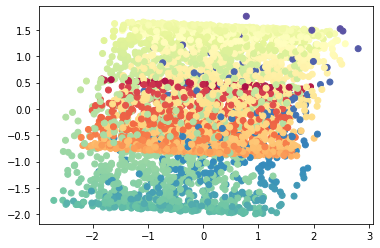

tensor([[0.9997, 0.2913],
        [0.2913, 0.9998]], grad_fn=<DivBackward0>)
Epoch=030, loss=8.5653, time=0.4532
loss before neg tensor(5.1957, grad_fn=<SubBackward0>)
loss after neg tensor(2.0251, grad_fn=<NegBackward0>)
loss corr tensor(1.3455, grad_fn=<MulBackward0>)
loss final tensor(8.5662, grad_fn=<AddBackward0>)
Epoch=031, loss=8.5662, time=0.1909
loss before neg tensor(5.1947, grad_fn=<SubBackward0>)
loss after neg tensor(2.0211, grad_fn=<NegBackward0>)
loss corr tensor(1.3473, grad_fn=<MulBackward0>)
loss final tensor(8.5631, grad_fn=<AddBackward0>)
Epoch=032, loss=8.5631, time=0.1687
loss before neg tensor(5.1939, grad_fn=<SubBackward0>)
loss after neg tensor(2.0242, grad_fn=<NegBackward0>)
loss corr tensor(1.3486, grad_fn=<MulBackward0>)
loss final tensor(8.5667, grad_fn=<AddBackward0>)
Epoch=033, loss=8.5667, time=0.1924
loss before neg tensor(5.1932, grad_fn=<SubBackward0>)
loss after neg tensor(2.0194, grad_fn=<NegBackward0>)
loss corr tensor(1.3494, grad_fn=<MulBackward0

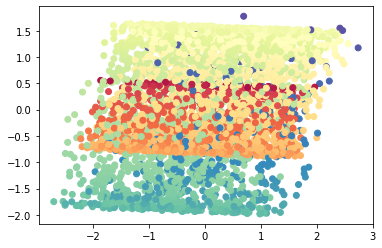

tensor([[0.9998, 0.2891],
        [0.2891, 0.9997]], grad_fn=<DivBackward0>)
Epoch=040, loss=8.5620, time=0.4428
loss before neg tensor(5.1905, grad_fn=<SubBackward0>)
loss after neg tensor(2.0311, grad_fn=<NegBackward0>)
loss corr tensor(1.3428, grad_fn=<MulBackward0>)
loss final tensor(8.5644, grad_fn=<AddBackward0>)
Epoch=041, loss=8.5644, time=0.1712
loss before neg tensor(5.1904, grad_fn=<SubBackward0>)
loss after neg tensor(2.0206, grad_fn=<NegBackward0>)
loss corr tensor(1.3412, grad_fn=<MulBackward0>)
loss final tensor(8.5522, grad_fn=<AddBackward0>)
Epoch=042, loss=8.5522, time=0.1753
loss before neg tensor(5.1902, grad_fn=<SubBackward0>)
loss after neg tensor(2.0306, grad_fn=<NegBackward0>)
loss corr tensor(1.3398, grad_fn=<MulBackward0>)
loss final tensor(8.5606, grad_fn=<AddBackward0>)
Epoch=043, loss=8.5606, time=0.1735
loss before neg tensor(5.1901, grad_fn=<SubBackward0>)
loss after neg tensor(2.0309, grad_fn=<NegBackward0>)
loss corr tensor(1.3385, grad_fn=<MulBackward0

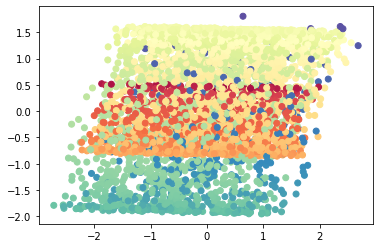

tensor([[0.9997, 0.3163],
        [0.3163, 0.9998]], grad_fn=<DivBackward0>)
Epoch=050, loss=8.5528, time=0.3660
loss before neg tensor(5.1887, grad_fn=<SubBackward0>)
loss after neg tensor(2.0279, grad_fn=<NegBackward0>)
loss corr tensor(1.3342, grad_fn=<MulBackward0>)
loss final tensor(8.5507, grad_fn=<AddBackward0>)
Epoch=051, loss=8.5507, time=0.2002
loss before neg tensor(5.1883, grad_fn=<SubBackward0>)
loss after neg tensor(2.0322, grad_fn=<NegBackward0>)
loss corr tensor(1.3341, grad_fn=<MulBackward0>)
loss final tensor(8.5546, grad_fn=<AddBackward0>)
Epoch=052, loss=8.5546, time=0.1714
loss before neg tensor(5.1879, grad_fn=<SubBackward0>)
loss after neg tensor(2.0262, grad_fn=<NegBackward0>)
loss corr tensor(1.3341, grad_fn=<MulBackward0>)
loss final tensor(8.5482, grad_fn=<AddBackward0>)
Epoch=053, loss=8.5482, time=0.1785
loss before neg tensor(5.1875, grad_fn=<SubBackward0>)
loss after neg tensor(2.0282, grad_fn=<NegBackward0>)
loss corr tensor(1.3341, grad_fn=<MulBackward0

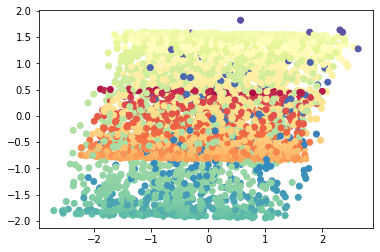

tensor([[0.9998, 0.3112],
        [0.3112, 0.9998]], grad_fn=<DivBackward0>)
Epoch=060, loss=8.5491, time=0.6099
loss before neg tensor(5.1842, grad_fn=<SubBackward0>)
loss after neg tensor(2.0251, grad_fn=<NegBackward0>)
loss corr tensor(1.3360, grad_fn=<MulBackward0>)
loss final tensor(8.5452, grad_fn=<AddBackward0>)
Epoch=061, loss=8.5452, time=0.2169
loss before neg tensor(5.1837, grad_fn=<SubBackward0>)
loss after neg tensor(2.0257, grad_fn=<NegBackward0>)
loss corr tensor(1.3364, grad_fn=<MulBackward0>)
loss final tensor(8.5458, grad_fn=<AddBackward0>)
Epoch=062, loss=8.5458, time=0.1995
loss before neg tensor(5.1833, grad_fn=<SubBackward0>)
loss after neg tensor(2.0316, grad_fn=<NegBackward0>)
loss corr tensor(1.3367, grad_fn=<MulBackward0>)
loss final tensor(8.5517, grad_fn=<AddBackward0>)
Epoch=063, loss=8.5517, time=0.2002
loss before neg tensor(5.1828, grad_fn=<SubBackward0>)
loss after neg tensor(2.0242, grad_fn=<NegBackward0>)
loss corr tensor(1.3371, grad_fn=<MulBackward0

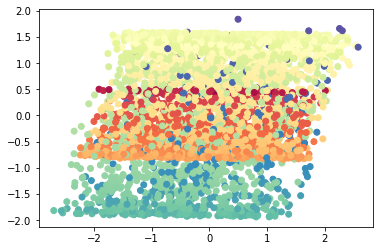

tensor([[0.9998, 0.3026],
        [0.3026, 0.9997]], grad_fn=<DivBackward0>)
Epoch=070, loss=8.5386, time=0.4866
loss before neg tensor(5.1806, grad_fn=<SubBackward0>)
loss after neg tensor(2.0199, grad_fn=<NegBackward0>)
loss corr tensor(1.3383, grad_fn=<MulBackward0>)
loss final tensor(8.5388, grad_fn=<AddBackward0>)
Epoch=071, loss=8.5388, time=0.1708
loss before neg tensor(5.1804, grad_fn=<SubBackward0>)
loss after neg tensor(2.0242, grad_fn=<NegBackward0>)
loss corr tensor(1.3382, grad_fn=<MulBackward0>)
loss final tensor(8.5427, grad_fn=<AddBackward0>)
Epoch=072, loss=8.5427, time=0.1780
loss before neg tensor(5.1802, grad_fn=<SubBackward0>)
loss after neg tensor(2.0321, grad_fn=<NegBackward0>)
loss corr tensor(1.3380, grad_fn=<MulBackward0>)
loss final tensor(8.5503, grad_fn=<AddBackward0>)
Epoch=073, loss=8.5503, time=0.1871
loss before neg tensor(5.1800, grad_fn=<SubBackward0>)
loss after neg tensor(2.0261, grad_fn=<NegBackward0>)
loss corr tensor(1.3379, grad_fn=<MulBackward0

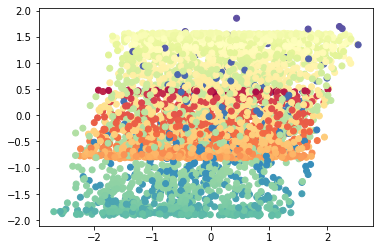

tensor([[0.9997, 0.3072],
        [0.3072, 0.9997]], grad_fn=<DivBackward0>)
Epoch=080, loss=8.5432, time=0.4402
loss before neg tensor(5.1789, grad_fn=<SubBackward0>)
loss after neg tensor(2.0308, grad_fn=<NegBackward0>)
loss corr tensor(1.3366, grad_fn=<MulBackward0>)
loss final tensor(8.5462, grad_fn=<AddBackward0>)
Epoch=081, loss=8.5462, time=0.2046
loss before neg tensor(5.1787, grad_fn=<SubBackward0>)
loss after neg tensor(2.0260, grad_fn=<NegBackward0>)
loss corr tensor(1.3364, grad_fn=<MulBackward0>)
loss final tensor(8.5412, grad_fn=<AddBackward0>)
Epoch=082, loss=8.5412, time=0.1860
loss before neg tensor(5.1785, grad_fn=<SubBackward0>)
loss after neg tensor(2.0256, grad_fn=<NegBackward0>)
loss corr tensor(1.3363, grad_fn=<MulBackward0>)
loss final tensor(8.5405, grad_fn=<AddBackward0>)
Epoch=083, loss=8.5405, time=0.1964
loss before neg tensor(5.1784, grad_fn=<SubBackward0>)
loss after neg tensor(2.0318, grad_fn=<NegBackward0>)
loss corr tensor(1.3362, grad_fn=<MulBackward0

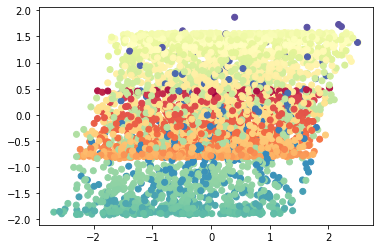

tensor([[0.9998, 0.3090],
        [0.3090, 0.9998]], grad_fn=<DivBackward0>)
Epoch=090, loss=8.5394, time=0.4292
loss before neg tensor(5.1771, grad_fn=<SubBackward0>)
loss after neg tensor(2.0274, grad_fn=<NegBackward0>)
loss corr tensor(1.3362, grad_fn=<MulBackward0>)
loss final tensor(8.5407, grad_fn=<AddBackward0>)
Epoch=091, loss=8.5407, time=0.1731
loss before neg tensor(5.1769, grad_fn=<SubBackward0>)
loss after neg tensor(2.0241, grad_fn=<NegBackward0>)
loss corr tensor(1.3363, grad_fn=<MulBackward0>)
loss final tensor(8.5372, grad_fn=<AddBackward0>)
Epoch=092, loss=8.5372, time=0.2788
loss before neg tensor(5.1767, grad_fn=<SubBackward0>)
loss after neg tensor(2.0305, grad_fn=<NegBackward0>)
loss corr tensor(1.3364, grad_fn=<MulBackward0>)
loss final tensor(8.5435, grad_fn=<AddBackward0>)
Epoch=093, loss=8.5435, time=0.2558
loss before neg tensor(5.1765, grad_fn=<SubBackward0>)
loss after neg tensor(2.0277, grad_fn=<NegBackward0>)
loss corr tensor(1.3364, grad_fn=<MulBackward0

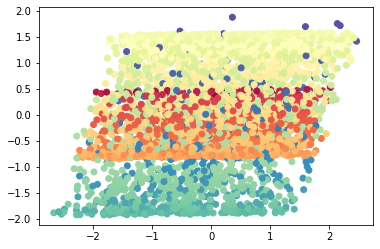

tensor([[0.9997, 0.3071],
        [0.3071, 0.9997]], grad_fn=<DivBackward0>)
Epoch=100, loss=8.5413, time=0.4581
loss before neg tensor(5.1752, grad_fn=<SubBackward0>)
loss after neg tensor(2.0286, grad_fn=<NegBackward0>)
loss corr tensor(1.3368, grad_fn=<MulBackward0>)
loss final tensor(8.5405, grad_fn=<AddBackward0>)
Epoch=101, loss=8.5405, time=0.2148
loss before neg tensor(5.1750, grad_fn=<SubBackward0>)
loss after neg tensor(2.0308, grad_fn=<NegBackward0>)
loss corr tensor(1.3368, grad_fn=<MulBackward0>)
loss final tensor(8.5426, grad_fn=<AddBackward0>)
Epoch=102, loss=8.5426, time=0.1934
loss before neg tensor(5.1749, grad_fn=<SubBackward0>)
loss after neg tensor(2.0248, grad_fn=<NegBackward0>)
loss corr tensor(1.3368, grad_fn=<MulBackward0>)
loss final tensor(8.5364, grad_fn=<AddBackward0>)
Epoch=103, loss=8.5364, time=0.2128
loss before neg tensor(5.1747, grad_fn=<SubBackward0>)
loss after neg tensor(2.0309, grad_fn=<NegBackward0>)
loss corr tensor(1.3368, grad_fn=<MulBackward0

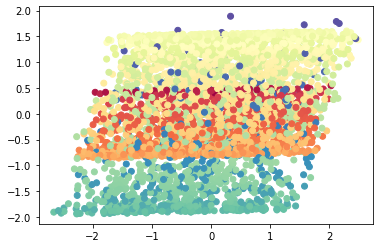

tensor([[0.9997, 0.3078],
        [0.3078, 0.9998]], grad_fn=<DivBackward0>)
Epoch=110, loss=8.5346, time=0.4003
loss before neg tensor(5.1737, grad_fn=<SubBackward0>)
loss after neg tensor(2.0251, grad_fn=<NegBackward0>)
loss corr tensor(1.3365, grad_fn=<MulBackward0>)
loss final tensor(8.5352, grad_fn=<AddBackward0>)
Epoch=111, loss=8.5352, time=0.1864
loss before neg tensor(5.1735, grad_fn=<SubBackward0>)
loss after neg tensor(2.0317, grad_fn=<NegBackward0>)
loss corr tensor(1.3365, grad_fn=<MulBackward0>)
loss final tensor(8.5417, grad_fn=<AddBackward0>)
Epoch=112, loss=8.5417, time=0.1643
loss before neg tensor(5.1734, grad_fn=<SubBackward0>)
loss after neg tensor(2.0236, grad_fn=<NegBackward0>)
loss corr tensor(1.3364, grad_fn=<MulBackward0>)
loss final tensor(8.5334, grad_fn=<AddBackward0>)
Epoch=113, loss=8.5334, time=0.1816
loss before neg tensor(5.1732, grad_fn=<SubBackward0>)
loss after neg tensor(2.0286, grad_fn=<NegBackward0>)
loss corr tensor(1.3364, grad_fn=<MulBackward0

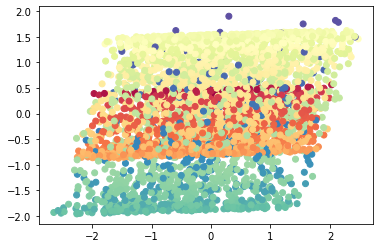

tensor([[0.9997, 0.3088],
        [0.3088, 0.9998]], grad_fn=<DivBackward0>)
Epoch=120, loss=8.5393, time=0.4548
loss before neg tensor(5.1722, grad_fn=<SubBackward0>)
loss after neg tensor(2.0309, grad_fn=<NegBackward0>)
loss corr tensor(1.3363, grad_fn=<MulBackward0>)
loss final tensor(8.5393, grad_fn=<AddBackward0>)
Epoch=121, loss=8.5393, time=0.1951
loss before neg tensor(5.1720, grad_fn=<SubBackward0>)
loss after neg tensor(2.0287, grad_fn=<NegBackward0>)
loss corr tensor(1.3363, grad_fn=<MulBackward0>)
loss final tensor(8.5370, grad_fn=<AddBackward0>)
Epoch=122, loss=8.5370, time=0.2016
loss before neg tensor(5.1719, grad_fn=<SubBackward0>)
loss after neg tensor(2.0232, grad_fn=<NegBackward0>)
loss corr tensor(1.3363, grad_fn=<MulBackward0>)
loss final tensor(8.5313, grad_fn=<AddBackward0>)
Epoch=123, loss=8.5313, time=0.2069
loss before neg tensor(5.1717, grad_fn=<SubBackward0>)
loss after neg tensor(2.0254, grad_fn=<NegBackward0>)
loss corr tensor(1.3363, grad_fn=<MulBackward0

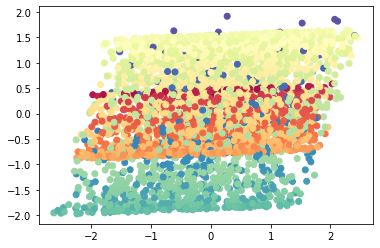

tensor([[0.9998, 0.3087],
        [0.3087, 0.9998]], grad_fn=<DivBackward0>)
Epoch=130, loss=8.5344, time=0.4298
loss before neg tensor(5.1706, grad_fn=<SubBackward0>)
loss after neg tensor(2.0227, grad_fn=<NegBackward0>)
loss corr tensor(1.3363, grad_fn=<MulBackward0>)
loss final tensor(8.5296, grad_fn=<AddBackward0>)
Epoch=131, loss=8.5296, time=0.2242
loss before neg tensor(5.1705, grad_fn=<SubBackward0>)
loss after neg tensor(2.0263, grad_fn=<NegBackward0>)
loss corr tensor(1.3363, grad_fn=<MulBackward0>)
loss final tensor(8.5331, grad_fn=<AddBackward0>)
Epoch=132, loss=8.5331, time=0.1975
loss before neg tensor(5.1703, grad_fn=<SubBackward0>)
loss after neg tensor(2.0288, grad_fn=<NegBackward0>)
loss corr tensor(1.3363, grad_fn=<MulBackward0>)
loss final tensor(8.5354, grad_fn=<AddBackward0>)
Epoch=133, loss=8.5354, time=0.2202
loss before neg tensor(5.1702, grad_fn=<SubBackward0>)
loss after neg tensor(2.0319, grad_fn=<NegBackward0>)
loss corr tensor(1.3363, grad_fn=<MulBackward0

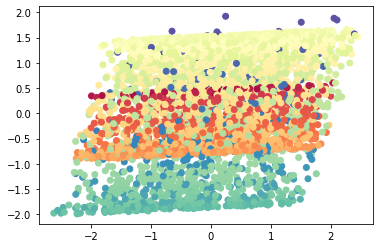

tensor([[0.9997, 0.3092],
        [0.3092, 0.9998]], grad_fn=<DivBackward0>)
Epoch=140, loss=8.5342, time=0.6041
loss before neg tensor(5.1691, grad_fn=<SubBackward0>)
loss after neg tensor(2.0297, grad_fn=<NegBackward0>)
loss corr tensor(1.3361, grad_fn=<MulBackward0>)
loss final tensor(8.5350, grad_fn=<AddBackward0>)
Epoch=141, loss=8.5350, time=0.2321
loss before neg tensor(5.1690, grad_fn=<SubBackward0>)
loss after neg tensor(2.0229, grad_fn=<NegBackward0>)
loss corr tensor(1.3361, grad_fn=<MulBackward0>)
loss final tensor(8.5280, grad_fn=<AddBackward0>)
Epoch=142, loss=8.5280, time=0.2008
loss before neg tensor(5.1688, grad_fn=<SubBackward0>)
loss after neg tensor(2.0217, grad_fn=<NegBackward0>)
loss corr tensor(1.3361, grad_fn=<MulBackward0>)
loss final tensor(8.5266, grad_fn=<AddBackward0>)
Epoch=143, loss=8.5266, time=0.1996
loss before neg tensor(5.1687, grad_fn=<SubBackward0>)
loss after neg tensor(2.0211, grad_fn=<NegBackward0>)
loss corr tensor(1.3361, grad_fn=<MulBackward0

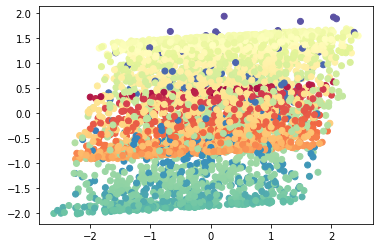

tensor([[0.9997, 0.3097],
        [0.3097, 0.9997]], grad_fn=<DivBackward0>)
Epoch=150, loss=8.5291, time=0.4208
loss before neg tensor(5.1676, grad_fn=<SubBackward0>)
loss after neg tensor(2.0223, grad_fn=<NegBackward0>)
loss corr tensor(1.3360, grad_fn=<MulBackward0>)
loss final tensor(8.5259, grad_fn=<AddBackward0>)
Epoch=151, loss=8.5259, time=0.1834
loss before neg tensor(5.1675, grad_fn=<SubBackward0>)
loss after neg tensor(2.0244, grad_fn=<NegBackward0>)
loss corr tensor(1.3360, grad_fn=<MulBackward0>)
loss final tensor(8.5278, grad_fn=<AddBackward0>)
Epoch=152, loss=8.5278, time=0.1874
loss before neg tensor(5.1673, grad_fn=<SubBackward0>)
loss after neg tensor(2.0257, grad_fn=<NegBackward0>)
loss corr tensor(1.3359, grad_fn=<MulBackward0>)
loss final tensor(8.5289, grad_fn=<AddBackward0>)
Epoch=153, loss=8.5289, time=0.1624
loss before neg tensor(5.1672, grad_fn=<SubBackward0>)
loss after neg tensor(2.0182, grad_fn=<NegBackward0>)
loss corr tensor(1.3359, grad_fn=<MulBackward0

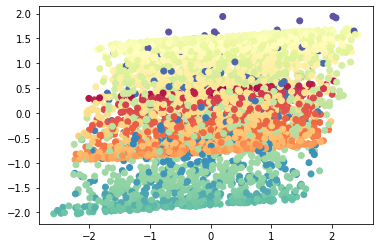

tensor([[0.9998, 0.3102],
        [0.3102, 0.9998]], grad_fn=<DivBackward0>)
Epoch=160, loss=8.5236, time=0.4499
loss before neg tensor(5.1661, grad_fn=<SubBackward0>)
loss after neg tensor(2.0300, grad_fn=<NegBackward0>)
loss corr tensor(1.3359, grad_fn=<MulBackward0>)
loss final tensor(8.5319, grad_fn=<AddBackward0>)
Epoch=161, loss=8.5319, time=0.1904
loss before neg tensor(5.1659, grad_fn=<SubBackward0>)
loss after neg tensor(2.0299, grad_fn=<NegBackward0>)
loss corr tensor(1.3359, grad_fn=<MulBackward0>)
loss final tensor(8.5317, grad_fn=<AddBackward0>)
Epoch=162, loss=8.5317, time=0.1819
loss before neg tensor(5.1658, grad_fn=<SubBackward0>)
loss after neg tensor(2.0220, grad_fn=<NegBackward0>)
loss corr tensor(1.3358, grad_fn=<MulBackward0>)
loss final tensor(8.5236, grad_fn=<AddBackward0>)
Epoch=163, loss=8.5236, time=0.1885
loss before neg tensor(5.1656, grad_fn=<SubBackward0>)
loss after neg tensor(2.0239, grad_fn=<NegBackward0>)
loss corr tensor(1.3358, grad_fn=<MulBackward0

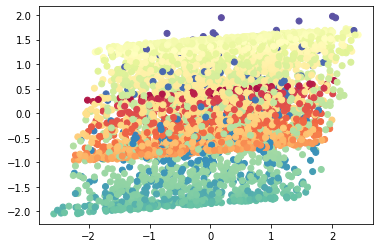

tensor([[0.9998, 0.3105],
        [0.3105, 0.9998]], grad_fn=<DivBackward0>)
Epoch=170, loss=8.5232, time=0.4212
loss before neg tensor(5.1645, grad_fn=<SubBackward0>)
loss after neg tensor(2.0263, grad_fn=<NegBackward0>)
loss corr tensor(1.3358, grad_fn=<MulBackward0>)
loss final tensor(8.5266, grad_fn=<AddBackward0>)
Epoch=171, loss=8.5266, time=0.1972
loss before neg tensor(5.1643, grad_fn=<SubBackward0>)
loss after neg tensor(2.0260, grad_fn=<NegBackward0>)
loss corr tensor(1.3358, grad_fn=<MulBackward0>)
loss final tensor(8.5261, grad_fn=<AddBackward0>)
Epoch=172, loss=8.5261, time=0.1940
loss before neg tensor(5.1642, grad_fn=<SubBackward0>)
loss after neg tensor(2.0225, grad_fn=<NegBackward0>)
loss corr tensor(1.3358, grad_fn=<MulBackward0>)
loss final tensor(8.5224, grad_fn=<AddBackward0>)
Epoch=173, loss=8.5224, time=0.1938
loss before neg tensor(5.1640, grad_fn=<SubBackward0>)
loss after neg tensor(2.0226, grad_fn=<NegBackward0>)
loss corr tensor(1.3357, grad_fn=<MulBackward0

<Figure size 432x288 with 0 Axes>

(array([[ 31., 181., 445., 559., 684., 637., 657., 488., 251.,  67.],
        [  0., 328., 247., 731., 672., 608., 448., 611., 355.,   0.]]),
 array([-2.59631538, -2.09267163, -1.58902788, -1.08538401, -0.58174026,
        -0.07809651,  0.42554727,  0.92919105,  1.43283486,  1.93647861,
         2.44012237]),
 <a list of 2 BarContainer objects>)

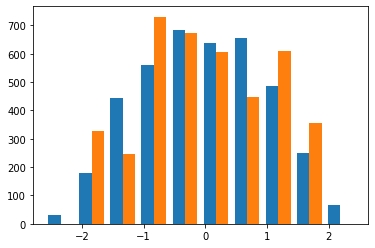

<Figure size 432x288 with 0 Axes>

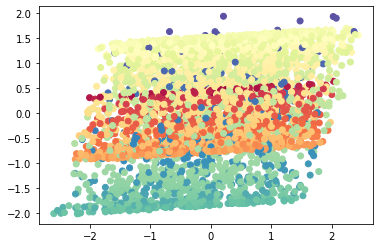

tensor([[0.9998, 0.3100],
        [0.3100, 0.9997]], grad_fn=<DivBackward0>)


In [62]:
#xx = torch.ones((X.shape[0], 10))
# new_data2.x =  new_data.x[:,:2] # leave out z-axis
model6, target_index,_,_  =  train_gnumap(new_data,
                                     target=None, hid_dim=256, dim=2,
                                     n_layers=1, must_propagate= [True, True, True, True, True],
                                     method = 'power', alpha=0.5,
                                     gnn_type='symmetric', repulsion_strength=10.,
                                     norm='standardize', neighbours=15,
                                     beta=1, patience=20, epochs=1000,
                                     power = 5,
                                     lr=1e-2,
                                     wd=1e-4,
                                     lambd_corr=1.,
                                     min_dist=0.001,subsampling=100000)
out = model6(new_data.x.float(), new_data.edge_index)
plt.figure()
plt.hist(out.detach().numpy())
plt.show()
u = out.detach().numpy()
plt.figure()
plt.scatter(u[:,0], u[:,1], c = t,
            cmap="Spectral")
plt.show()
print(torch.mm(out.T, out)/ new_data.num_nodes)